# System Price Forecasting - SHAP Feature Analysis

- Assesing impact of the unavailability of different fuel types and generators on system price in the British BM
- XGBoost regression model with optuna hyperparameter optimisation 
- 100% training data model setup (2023 and 2024)
- Feature importance analysis using mean SHAP values 

## Market Data Load

In [ ]:
# Load libraries
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import joblib
import math
import seaborn as sns
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import optuna
import shap

In [ ]:
# Load baseline market datase
market_data = pd.read_csv("Final_Dataset_Forward_Forecasts_2021_2024.csv")

# Convert 'StartTime' to datetime
market_data['StartTime'] = pd.to_datetime(market_data['StartTime'])

# Display head of the dataset
market_data.head()

,StartTime,SettlementPeriod,SystemPrice,NetImbalanceVolume,DeratedMargin_1,DeratedMargin_2,DeratedMargin_4,DeratedMargin_8,DeratedMargin_12,LossOfLoadProbability_1,LossOfLoadProbability_2,LossOfLoadProbability_4,LossOfLoadProbability_8,LossOfLoadProbability_12,DemandForecast,WindForecast,SolarForecast,InterconnectorFlow
0,2021-01-01 00:00:00,1,73.15,843.6931,16659.870,16652.924,16203.616,16719.902,16970.830,0.0,0.0,0.0,0.0,0.0,0,5383.129,0.0,3428.0
1,2021-01-01 00:30:00,2,73.15,934.5820,16745.850,17186.605,16619.305,16229.908,16808.105,0.0,0.0,0.0,0.0,0.0,0,5383.129,0.0,3572.0
2,2021-01-01 01:00:00,3,72.00,604.7328,17216.723,17547.670,17475.570,16297.968,16881.844,0.0,0.0,0.0,0.0,0.0,0,5495.747,0.0,3570.0
3,2021-01-01 01:30:00,4,71.90,307.3387,18123.268,18123.268,18325.574,17315.922,18829.320,0.0,0.0,0.0,0.0,0.0,0,5495.747,0.0,3568.0
4,2021-01-01 02:00:00,5,71.50,48.8845,18470.736,18889.360,18981.725,18021.650,19804.836,0.0,0.0,0.0,0.0,0.0,0,5540.047,0.0,3512.0


In [3]:
# Trim data for 2023 onwards
market_data = market_data[market_data['StartTime'] >= '2023-01-01']

# Reset index
market_data.reset_index(drop=True, inplace=True)

# Drop SettlementPeriod column
market_data.drop(columns=['SettlementPeriod'], inplace=True)

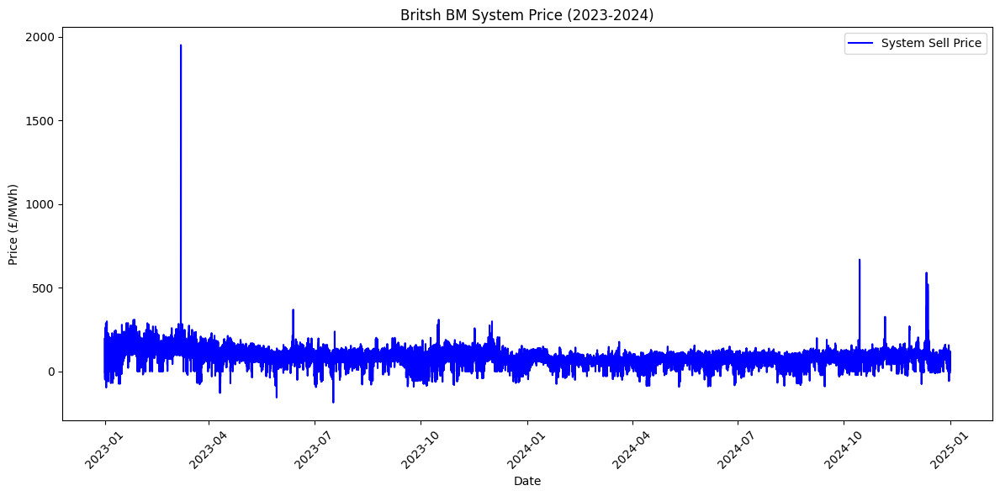

In [4]:
# Plot SystemSellPrice 
plt.figure(figsize=(12, 6))
plt.plot(market_data['StartTime'], market_data['SystemPrice'], label='System Sell Price', color='blue')
plt.title('Britsh BM System Price (2023-2024)')
plt.xlabel('Date')
plt.ylabel('Price (£/MWh)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

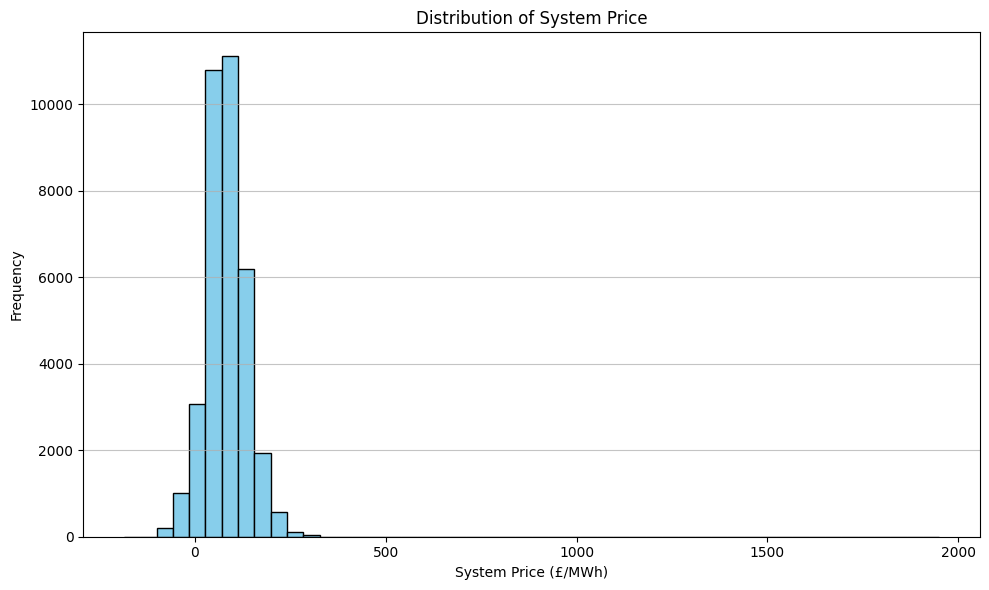

In [5]:
# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(market_data['SystemPrice'].dropna(), bins=50, color='skyblue', edgecolor='black')

plt.title('Distribution of System Price')
plt.xlabel('System Price (£/MWh)')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.show()

## Fuel Type Data Load

In [ ]:
# Load REMIT dataset
fuel_data = pd.read_csv("REMIT_Unavailable_Capacity_Percentage_By_FuelType_And_Availability_Type.csv")

# Convert 'StartTime' to datetime
fuel_data['StartTime'] = pd.to_datetime(fuel_data['StartTime'])

# Drop Coal columns
fuel_data = fuel_data.drop(columns=[col for col in fuel_data.columns if 'coal' in col.lower()])

# Display head of the dataset
fuel_data.head()

,StartTime,Biomass_Planned_%,CCGT_Planned_%,Hydropower_Planned_%,Interconnector_Planned_%,Nuclear_Planned_%,OCGT_Planned_%,Wind_Offshore_Planned_%,Wind_Onshore_Planned_%,Biomass_Unplanned_%,CCGT_Unplanned_%,Hydropower_Unplanned_%,Interconnector_Unplanned_%,Nuclear_Unplanned_%,OCGT_Unplanned_%,Wind_Offshore_Unplanned_%,Wind_Onshore_Unplanned_%,Planned_Unavailability_%,Unplanned_Unavailability_%,Total_Unavailability_%
0,2023-01-01 00:00:00,1.741522,11.826828,6.263048,0.0,11.235764,5.526802,2.620314,0.773143,14.11549,3.394281,8.768267,9.708738,2.804691,1.219963,0.071345,0.0,4.436844,3.800024,8.236868
1,2023-01-01 00:30:00,1.741522,11.826828,6.263048,0.0,11.235764,5.526802,2.620314,0.773143,14.11549,3.394281,8.768267,9.708738,2.804691,1.219963,0.071345,0.0,4.436844,3.800024,8.236868
2,2023-01-01 01:00:00,1.741522,11.826828,6.263048,0.0,11.235764,5.526802,2.620314,0.773143,14.11549,3.394281,8.768267,9.708738,2.804691,1.219963,0.071345,0.0,4.436844,3.800024,8.236868
3,2023-01-01 01:30:00,1.741522,11.826828,6.263048,0.0,11.235764,5.526802,2.620314,0.773143,14.11549,3.394281,8.768267,9.708738,2.804691,1.219963,0.071345,0.0,4.436844,3.800024,8.236868
4,2023-01-01 02:00:00,1.741522,11.826828,6.263048,0.0,11.235764,5.526802,2.620314,0.773143,14.11549,3.394281,8.768267,9.708738,2.804691,1.219963,0.071345,0.0,4.436844,3.800024,8.236868


In [7]:
# Trim data for 2023 onwards
fuel_data = fuel_data[fuel_data['StartTime'] >= '2023-01-01']

# Reset index
fuel_data.reset_index(drop=True, inplace=True)

In [8]:
# Drop Total columns
fuel_data = fuel_data.drop(columns=['Planned_Unavailability_%','Unplanned_Unavailability_%','Total_Unavailability_%'])

# Check data types
print(fuel_data.dtypes)

StartTime                     datetime64[ns]
Biomass_Planned_%                    float64
CCGT_Planned_%                       float64
Hydropower_Planned_%                 float64
Interconnector_Planned_%             float64
Nuclear_Planned_%                    float64
OCGT_Planned_%                       float64
Wind_Offshore_Planned_%              float64
Wind_Onshore_Planned_%               float64
Biomass_Unplanned_%                  float64
CCGT_Unplanned_%                     float64
Hydropower_Unplanned_%               float64
Interconnector_Unplanned_%           float64
Nuclear_Unplanned_%                  float64
OCGT_Unplanned_%                     float64
Wind_Offshore_Unplanned_%            float64
Wind_Onshore_Unplanned_%             float64
dtype: object


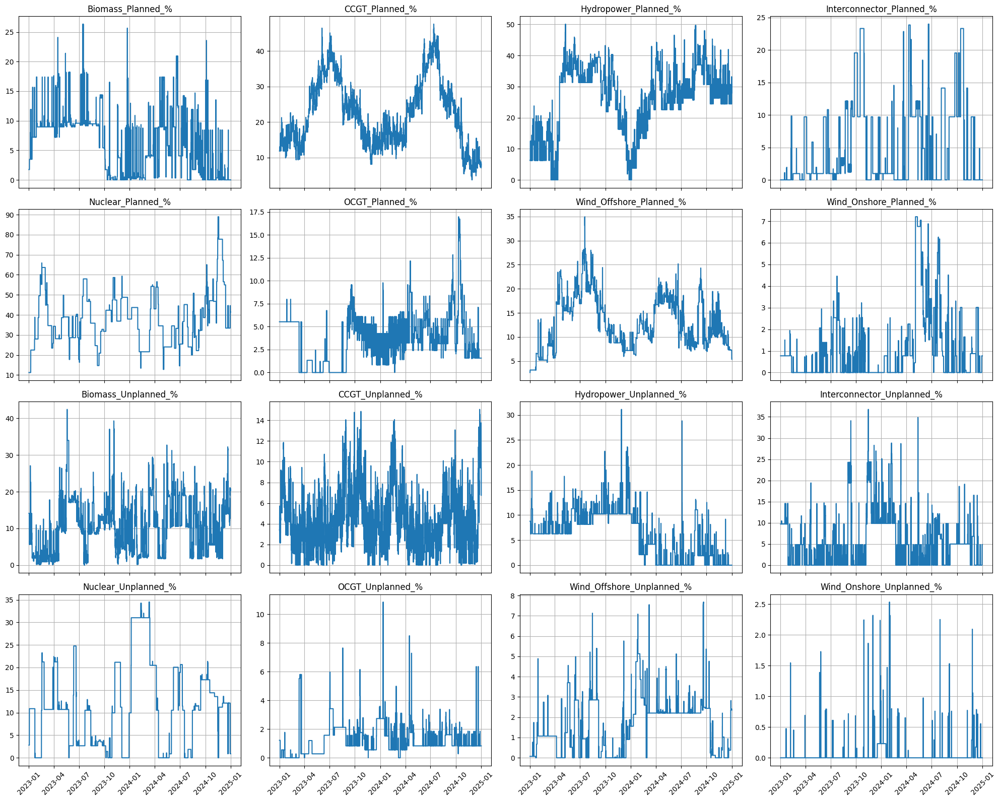

In [ ]:
# Exclude columns
columns_to_plot = [col for col in fuel_data.columns 
                   if col not in ['StartTime']]

# Calculate grid size
n = len(columns_to_plot)
n_cols = 4  # Number of columns in the subplot grid
n_rows = math.ceil(n / n_cols)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows), sharex=True)
axes = axes.flatten()  # Flatten in case it's a 2D array

# Plot each column
for i, col in enumerate(columns_to_plot):
    axes[i].plot(fuel_data['StartTime'], fuel_data[col])
    axes[i].set_title(col)
    axes[i].grid(True)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [10]:
# Add System Price column to dataset
fuel_data['SystemPrice'] = market_data['SystemPrice']   

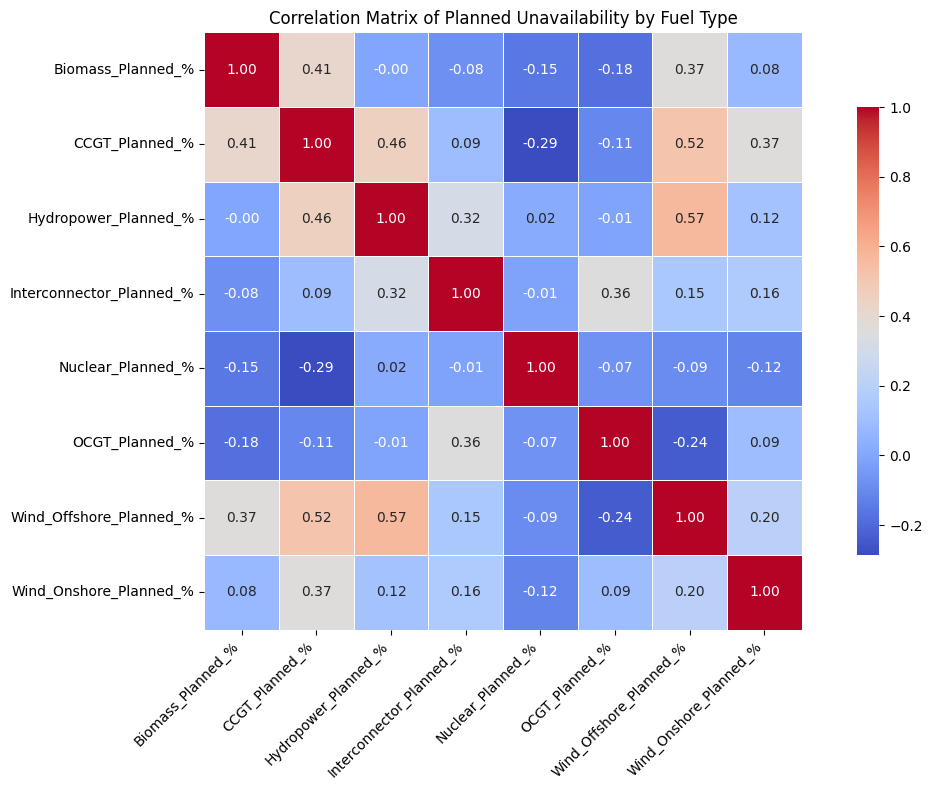

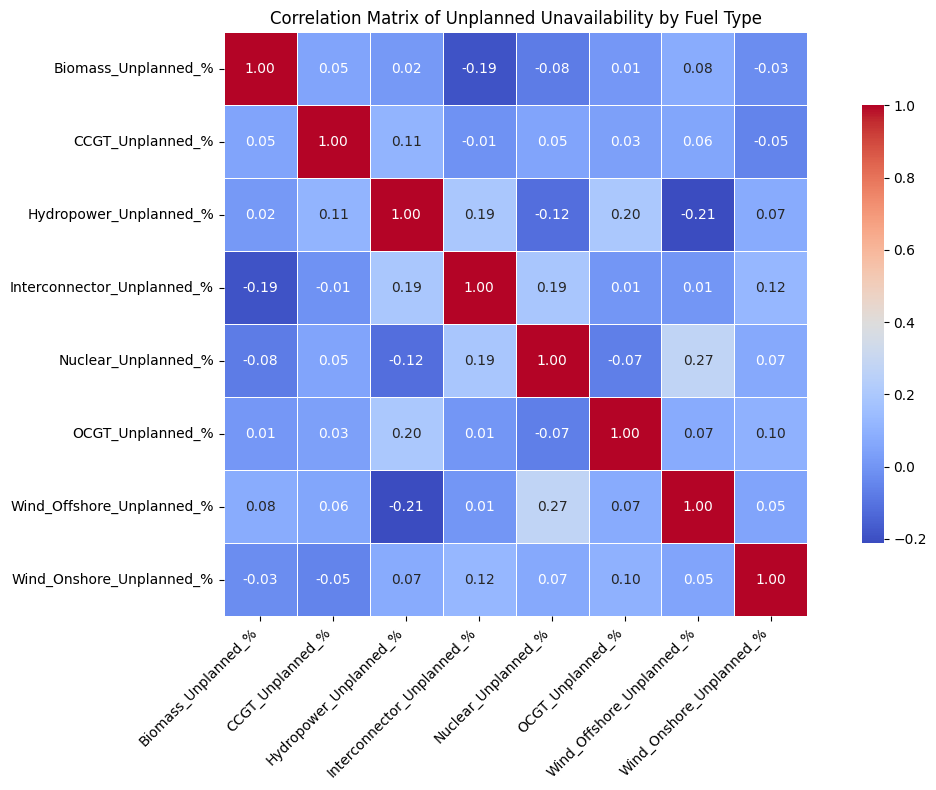

In [ ]:
# Select planned and unplanned columns 
planned_cols = [col for col in fuel_data.columns if '_Planned_%' in col]
unplanned_cols = [col for col in fuel_data.columns if '_Unplanned_%' in col]

fuel_data_planned = fuel_data[planned_cols]
fuel_data_unplanned = fuel_data[unplanned_cols]

# Compute correlation matrices 
corr_planned = fuel_data_planned.corr()
corr_unplanned = fuel_data_unplanned.corr()

# Plot correlation matrix for Planned
plt.figure(figsize=(12, 8))
sns.heatmap(
    corr_planned,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.75}
)
plt.title("Correlation Matrix of Planned Unavailability by Fuel Type")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Plot correlation matrix for Unplanned 
plt.figure(figsize=(12, 8))
sns.heatmap(
    corr_unplanned,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.75}
)
plt.title("Correlation Matrix of Unplanned Unavailability by Fuel Type")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

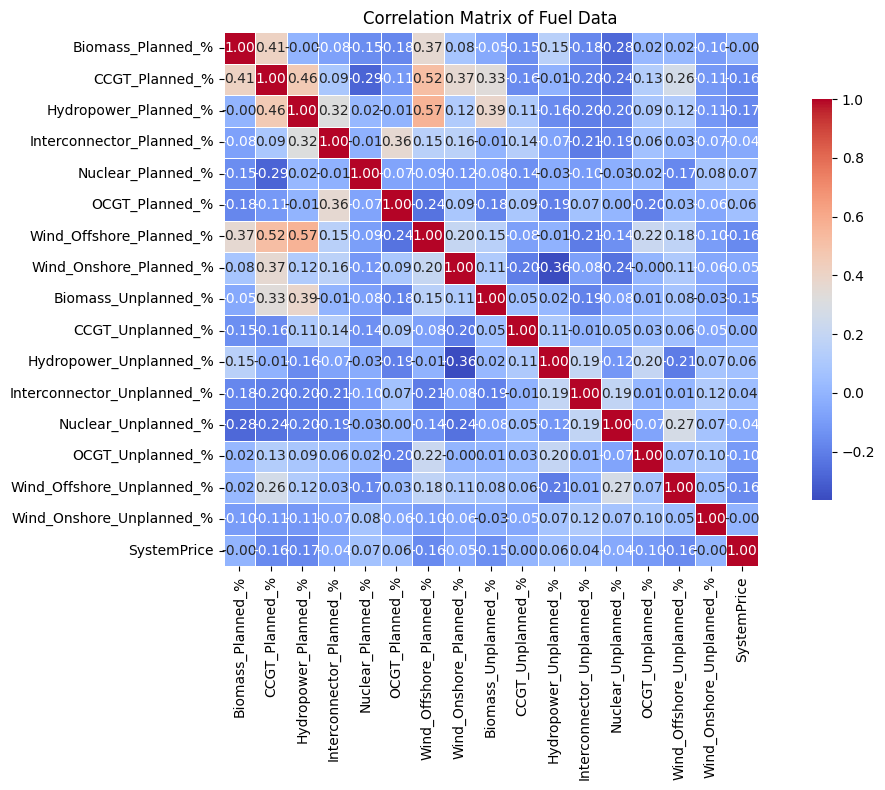

In [ ]:
# Compute correlation matrix 
correlation_matrix = fuel_data.corr(numeric_only=True)

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.75}
)

plt.title("Correlation Matrix of Fuel Data")
plt.tight_layout()
plt.show()

In [13]:
# Add system price and start time data back to fuel_data_planned and fuel_data_unplanned
fuel_data_planned = fuel_data_planned.copy()
fuel_data_unplanned = fuel_data_unplanned.copy()

fuel_data_planned['SystemPrice'] = market_data['SystemPrice']
fuel_data_unplanned['SystemPrice'] = market_data['SystemPrice']
fuel_data_planned['StartTime'] = market_data['StartTime']
fuel_data_unplanned['StartTime'] = market_data['StartTime']

## Generator Data Load

In [ ]:
# Load datasets
individual_unit_capacity = pd.read_csv("Individual_Unit_Capacity.csv")
individual_unit_capacity_planned = pd.read_csv("Individual_Unit_Capacity_Planned.csv")
individual_unit_capacity_unplanned = pd.read_csv("Individual_Unit_Capacity_Unplanned.csv")

In [15]:
# Trim data for 2023 onwards
individual_unit_capacity['StartTime'] = pd.to_datetime(individual_unit_capacity['StartTime'])
individual_unit_capacity = individual_unit_capacity[individual_unit_capacity['StartTime'] >= '2023-01-01']

individual_unit_capacity_planned['StartTime'] = pd.to_datetime(individual_unit_capacity_planned['StartTime'])
individual_unit_capacity_planned = individual_unit_capacity_planned[individual_unit_capacity_planned['StartTime'] >= '2023-01-01']

individual_unit_capacity_unplanned['StartTime'] = pd.to_datetime(individual_unit_capacity_unplanned['StartTime'])
individual_unit_capacity_unplanned = individual_unit_capacity_unplanned[individual_unit_capacity_unplanned['StartTime'] >= '2023-01-01']

# Add System Price column to dataset
individual_unit_capacity['SystemPrice'] = market_data['SystemPrice']
individual_unit_capacity_planned['SystemPrice'] = market_data['SystemPrice']
individual_unit_capacity_unplanned['SystemPrice'] = market_data['SystemPrice']

# Reset index
individual_unit_capacity.reset_index(drop=True, inplace=True)
individual_unit_capacity_planned.reset_index(drop=True, inplace=True)
individual_unit_capacity_unplanned.reset_index(drop=True, inplace=True)

In [ ]:
# Load affected unit data
affected_unit_fuel = pd.read_csv("affected_unit_fuel.csv")

# Remame IC Moyle to Interconnector
affected_unit_fuel['fuelType'] = affected_unit_fuel['fuelType'].replace('IC Moyle', 'Interconnector')
affected_unit_fuel['fuelType'] = affected_unit_fuel['fuelType'].replace('IC East West', 'Interconnector')
affected_unit_fuel['fuelType'] = affected_unit_fuel['fuelType'].replace('IC Eleclink', 'Interconnector')
affected_unit_fuel['fuelType'] = affected_unit_fuel['fuelType'].replace('IC France 1', 'Interconnector')
affected_unit_fuel['fuelType'] = affected_unit_fuel['fuelType'].replace('IC France 2', 'Interconnector')
affected_unit_fuel['fuelType'] = affected_unit_fuel['fuelType'].replace('IC Greenlink', 'Interconnector')
affected_unit_fuel['fuelType'] = affected_unit_fuel['fuelType'].replace('IC NEMO', 'Interconnector')
affected_unit_fuel['fuelType'] = affected_unit_fuel['fuelType'].replace('IC North Sea', 'Interconnector')
affected_unit_fuel['fuelType'] = affected_unit_fuel['fuelType'].replace('IC Viking', 'Interconnector')

## XGBoost Forecasting Functions

In [ ]:
# Function to run feature importance model
def run_feature_importance_model(
    df: pd.DataFrame,
    target_col: str = 'SystemPrice',
    dt_col: str = 'StartTime',
    n_trials: int = 100,
    random_state: int = 42
):
    """
    Trains XGBoost on 100% of the data for feature importance analysis.
    Optuna used to tune hyperparameters.
    No test set or validation is used.
    """

    df = df.copy()
    X = df.drop(columns=[dt_col, target_col])
    y = df[target_col].values
    features = X.columns.tolist()

    # Step 1: Optuna tuning on full data
    def objective(trial):
        params = {
            'n_estimators':     trial.suggest_int('n_estimators', 100, 1000, step=100),
            'max_depth':        trial.suggest_int('max_depth', 3, 12),
            'learning_rate':    trial.suggest_float('learning_rate', 1e-3, 1.0, log=True),
            'subsample':        trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha':        trial.suggest_float('reg_alpha', 1e-5, 10.0, log=True),
            'reg_lambda':       trial.suggest_float('reg_lambda', 1e-5, 10.0, log=True),
            'random_state':     random_state,
            'n_jobs':           -1
        }
        model = XGBRegressor(**params)
        model.fit(X, y)
        y_pred = model.predict(X)
        return -np.sqrt(mean_squared_error(y, y_pred))  

    study = optuna.create_study(direction='maximize')
    print(f"\nStarting hyperparameter search ({n_trials} trials)...\n")
    study.optimize(objective, n_trials=n_trials)
    best_params = study.best_params
    print(f"\n[Tuning complete] Best parameters:\n{best_params}\n")

    # Step 2: Train final model on 100% of the data
    model = XGBRegressor(**best_params, n_jobs=-1, random_state=random_state)
    model.fit(X, y)
    y_pred = model.predict(X)

    # Step 3: Evaluation
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    mae  = mean_absolute_error(y, y_pred)
    r2   = r2_score(y, y_pred)
    print(f"[Result] Train RMSE = {rmse:.3f}, MAE = {mae:.3f}, R² = {r2:.3f}\n")

    # Step 4: Feature importance
    imp = model.feature_importances_
    order = np.argsort(imp)
    plt.figure(figsize=(8, 6))
    plt.barh(np.array(features)[order], imp[order])
    plt.title("Feature Importances")
    plt.tight_layout()
    plt.show()

    return model, features, imp

## Fuel Type Feature Analysis (Planned + Unplanned)

[I 2025-08-03 20:11:22,642] A new study created in memory with name: no-name-f1da15c3-c233-441a-b178-3352d1663fc2



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:11:26,890] Trial 0 finished with value: -27.011942081118363 and parameters: {'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.14745867509728286, 'subsample': 0.762290025511045, 'colsample_bytree': 0.8010551244501707, 'reg_alpha': 0.12571252323679108, 'reg_lambda': 0.0004713314726609814}. Best is trial 0 with value: -27.011942081118363.
[I 2025-08-03 20:11:28,010] Trial 1 finished with value: -32.61908710739395 and parameters: {'n_estimators': 300, 'max_depth': 10, 'learning_rate': 0.02816918125032798, 'subsample': 0.8391668980104323, 'colsample_bytree': 0.6866716832935658, 'reg_alpha': 0.10451996150591744, 'reg_lambda': 1.898316790543293e-05}. Best is trial 0 with value: -27.011942081118363.
[I 2025-08-03 20:11:28,401] Trial 2 finished with value: -45.3746891099508 and parameters: {'n_estimators': 100, 'max_depth': 9, 'learning_rate': 0.007707673486892294, 'subsample': 0.8707188319430146, 'colsample_bytree': 0.9484089955681319, 'reg_alpha': 1.1639190907492054, 


[Tuning complete] Best parameters:
{'n_estimators': 700, 'max_depth': 12, 'learning_rate': 0.8594374551417826, 'subsample': 0.9983310251569761, 'colsample_bytree': 0.6844254003587964, 'reg_alpha': 1.3035463089517694, 'reg_lambda': 1.9583058242781504e-05}

[Result] Train RMSE = 26.461, MAE = 14.195, R² = 0.766



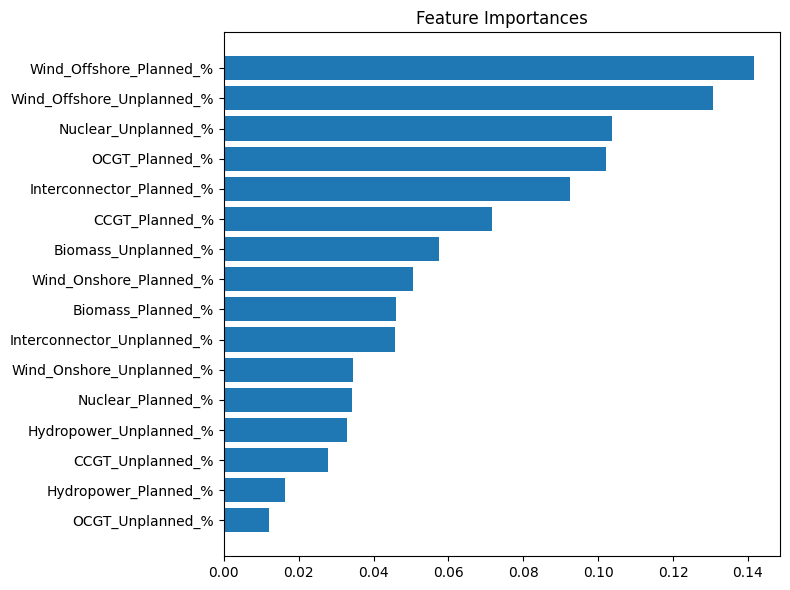

In [21]:
model_fuel_data_1, features_fuel_data_1, imp_fuel_data_1 = run_feature_importance_model(fuel_data)

[I 2025-08-03 20:16:32,845] A new study created in memory with name: no-name-6e68ef5d-d819-4f04-9b49-b2baa60f5e4a



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:16:36,887] Trial 0 finished with value: -43.454629311616266 and parameters: {'n_estimators': 600, 'max_depth': 11, 'learning_rate': 0.0013325866795267775, 'subsample': 0.6386115159576573, 'colsample_bytree': 0.7553416604590126, 'reg_alpha': 1.3038365095519737e-05, 'reg_lambda': 0.34870352253966996}. Best is trial 0 with value: -43.454629311616266.
[I 2025-08-03 20:16:37,193] Trial 1 finished with value: -47.38529405140344 and parameters: {'n_estimators': 400, 'max_depth': 4, 'learning_rate': 0.008099570100206305, 'subsample': 0.6723840888419114, 'colsample_bytree': 0.5281941471369849, 'reg_alpha': 0.17590030434045836, 'reg_lambda': 7.147871140094134}. Best is trial 0 with value: -43.454629311616266.
[I 2025-08-03 20:16:37,376] Trial 2 finished with value: -44.9094643155392 and parameters: {'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.048160378893779617, 'subsample': 0.5295073205126704, 'colsample_bytree': 0.9359818837011765, 'reg_alpha': 0.021581568004492065


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 9, 'learning_rate': 0.4041760391416954, 'subsample': 0.9998189176990465, 'colsample_bytree': 0.8007468877885855, 'reg_alpha': 0.017367308972748245, 'reg_lambda': 0.08372832405793261}

[Result] Train RMSE = 26.460, MAE = 14.229, R² = 0.766



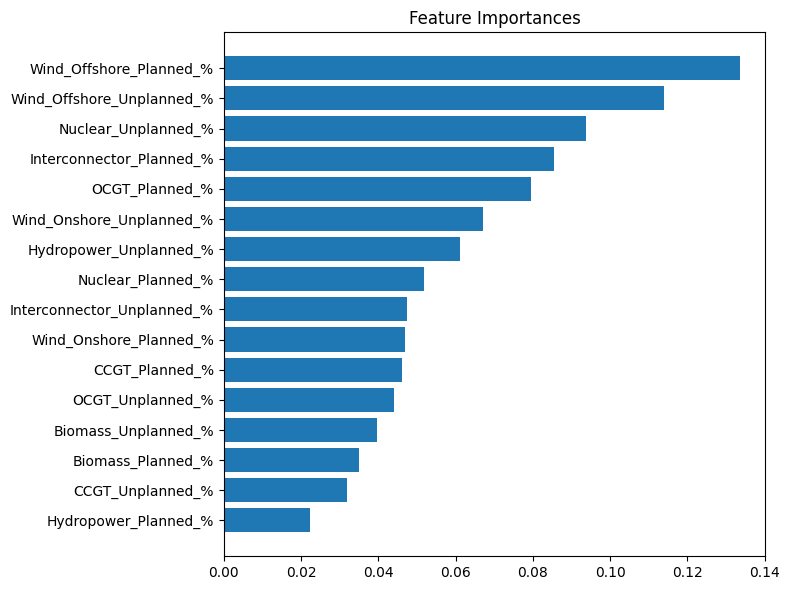

In [22]:
model_fuel_data_2, features_fuel_data_2, imp_fuel_data_2 = run_feature_importance_model(fuel_data)

[I 2025-08-03 20:20:43,992] A new study created in memory with name: no-name-13406e1b-dcf7-4fe9-ad91-e3b78c52c930



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:20:46,267] Trial 0 finished with value: -28.76094871085927 and parameters: {'n_estimators': 600, 'max_depth': 10, 'learning_rate': 0.05789866216556319, 'subsample': 0.7942699449355441, 'colsample_bytree': 0.9661177783803176, 'reg_alpha': 0.0002971461613291462, 'reg_lambda': 2.9576548456487055}. Best is trial 0 with value: -28.76094871085927.
[I 2025-08-03 20:20:48,733] Trial 1 finished with value: -31.778636428405793 and parameters: {'n_estimators': 900, 'max_depth': 9, 'learning_rate': 0.022754733609548033, 'subsample': 0.5523653887976823, 'colsample_bytree': 0.7906450921433199, 'reg_alpha': 3.4014593146805764e-05, 'reg_lambda': 2.4994947370649085}. Best is trial 0 with value: -28.76094871085927.
[I 2025-08-03 20:20:50,158] Trial 2 finished with value: -27.0117038139555 and parameters: {'n_estimators': 800, 'max_depth': 8, 'learning_rate': 0.4514299868367235, 'subsample': 0.9651094591716229, 'colsample_bytree': 0.9369215425509049, 'reg_alpha': 4.841431628622406e-05, '


[Tuning complete] Best parameters:
{'n_estimators': 600, 'max_depth': 12, 'learning_rate': 0.38816588727519463, 'subsample': 0.9995216718660426, 'colsample_bytree': 0.7859111115526224, 'reg_alpha': 0.3310268409668476, 'reg_lambda': 0.00015993809061282268}

[Result] Train RMSE = 26.454, MAE = 14.136, R² = 0.766



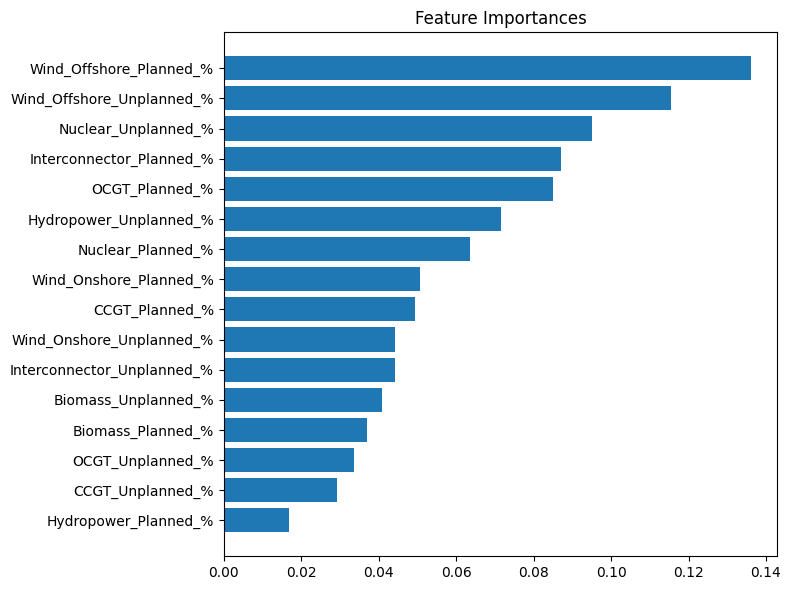

In [23]:
model_fuel_data_3, features_fuel_data_3, imp_fuel_data_3 = run_feature_importance_model(fuel_data)

[I 2025-08-03 20:25:11,106] A new study created in memory with name: no-name-37dff5a2-e514-4b27-a570-f68e80db1b9d



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:25:11,817] Trial 0 finished with value: -48.46521832914626 and parameters: {'n_estimators': 200, 'max_depth': 9, 'learning_rate': 0.0021752472707132343, 'subsample': 0.5081784805706835, 'colsample_bytree': 0.8133360723343667, 'reg_alpha': 0.00010067494134990144, 'reg_lambda': 0.002448965656981609}. Best is trial 0 with value: -48.46521832914626.
[I 2025-08-03 20:25:12,077] Trial 1 finished with value: -37.35143185362014 and parameters: {'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.53632954405696, 'subsample': 0.7510061417971388, 'colsample_bytree': 0.6400957037946635, 'reg_alpha': 7.245775664096855e-05, 'reg_lambda': 0.0028922577226389353}. Best is trial 1 with value: -37.35143185362014.
[I 2025-08-03 20:25:12,827] Trial 2 finished with value: -41.6415796702941 and parameters: {'n_estimators': 500, 'max_depth': 7, 'learning_rate': 0.006371657370082578, 'subsample': 0.6913248690926287, 'colsample_bytree': 0.8770770565070936, 'reg_alpha': 0.0003172038796331247


[Tuning complete] Best parameters:
{'n_estimators': 700, 'max_depth': 11, 'learning_rate': 0.5144257427704533, 'subsample': 0.9998171556160776, 'colsample_bytree': 0.6559118301734432, 'reg_alpha': 0.8127633050110472, 'reg_lambda': 0.6920209046071074}

[Result] Train RMSE = 26.455, MAE = 14.173, R² = 0.766



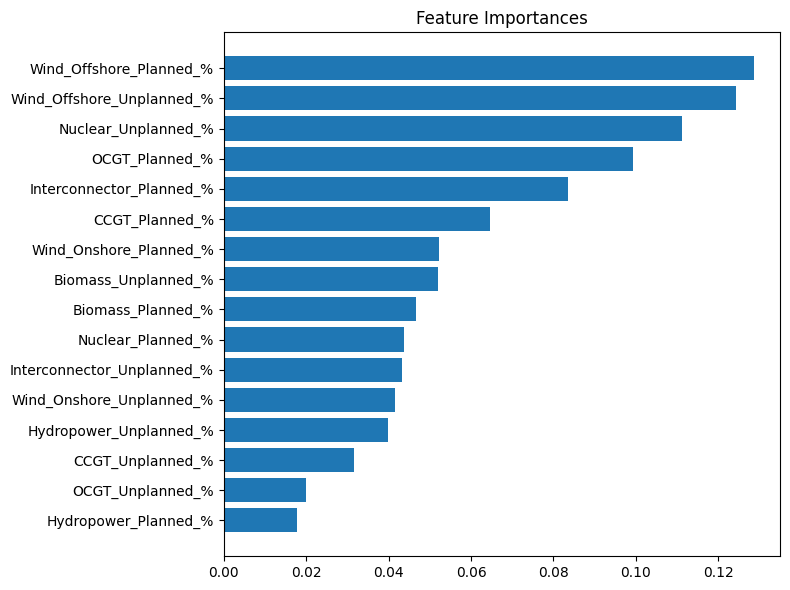

In [24]:
model_fuel_data_4, features_fuel_data_4, imp_fuel_data_4 = run_feature_importance_model(fuel_data)

[I 2025-08-03 20:30:11,337] A new study created in memory with name: no-name-2479d9a4-7470-4aa8-9505-40f825cbcd98



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:30:12,172] Trial 0 finished with value: -47.68807811433057 and parameters: {'n_estimators': 1000, 'max_depth': 5, 'learning_rate': 0.0014772303530573034, 'subsample': 0.64058850628867, 'colsample_bytree': 0.6615440445210112, 'reg_alpha': 0.5242228792518868, 'reg_lambda': 0.0014861438650930934}. Best is trial 0 with value: -47.68807811433057.
[I 2025-08-03 20:30:14,801] Trial 1 finished with value: -26.767731314622473 and parameters: {'n_estimators': 800, 'max_depth': 10, 'learning_rate': 0.5642904477406129, 'subsample': 0.9410982946288695, 'colsample_bytree': 0.7690648943450515, 'reg_alpha': 6.157231132144699e-05, 'reg_lambda': 0.00025321052071212297}. Best is trial 1 with value: -26.767731314622473.
[I 2025-08-03 20:30:15,573] Trial 2 finished with value: -28.991995548733524 and parameters: {'n_estimators': 600, 'max_depth': 7, 'learning_rate': 0.4305376429787653, 'subsample': 0.6620365839926001, 'colsample_bytree': 0.8350890676296356, 'reg_alpha': 0.01889096583144146


[Tuning complete] Best parameters:
{'n_estimators': 800, 'max_depth': 11, 'learning_rate': 0.8130347876520018, 'subsample': 0.9997150477907907, 'colsample_bytree': 0.6369154986984302, 'reg_alpha': 0.0004650531032780709, 'reg_lambda': 0.001387293721478324}

[Result] Train RMSE = 26.454, MAE = 14.090, R² = 0.766



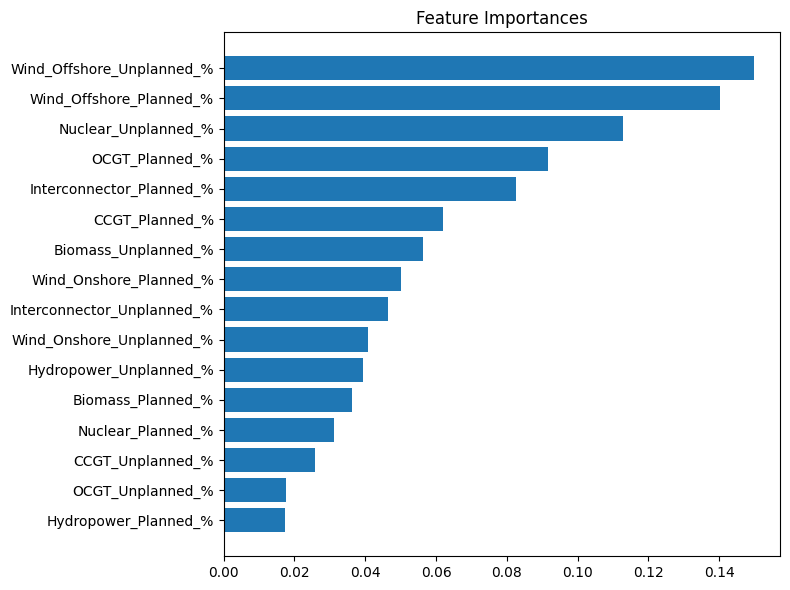

In [25]:
model_fuel_data_5, features_fuel_data_5, imp_fuel_data_5 = run_feature_importance_model(fuel_data)

[I 2025-08-03 20:35:50,423] A new study created in memory with name: no-name-4affe064-349a-42a3-947c-c88dd1c7ff91



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:35:50,855] Trial 0 finished with value: -47.87015263246416 and parameters: {'n_estimators': 600, 'max_depth': 4, 'learning_rate': 0.0038023132255215783, 'subsample': 0.8944069722995316, 'colsample_bytree': 0.7157410278390376, 'reg_alpha': 0.12162950104878063, 'reg_lambda': 0.000974962379080771}. Best is trial 0 with value: -47.87015263246416.
[I 2025-08-03 20:35:56,176] Trial 1 finished with value: -38.725847377083 and parameters: {'n_estimators': 800, 'max_depth': 11, 'learning_rate': 0.0019484025664325204, 'subsample': 0.5024230653268258, 'colsample_bytree': 0.7784406655147804, 'reg_alpha': 0.12194706525431263, 'reg_lambda': 1.0814639417534291e-05}. Best is trial 1 with value: -38.725847377083.
[I 2025-08-03 20:35:57,144] Trial 2 finished with value: -40.61188614137821 and parameters: {'n_estimators': 800, 'max_depth': 7, 'learning_rate': 0.006485628450019468, 'subsample': 0.8249512197481677, 'colsample_bytree': 0.520779231848627, 'reg_alpha': 0.05318739586701505, 'r


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 12, 'learning_rate': 0.5550797195494138, 'subsample': 0.9999502344756713, 'colsample_bytree': 0.9861946054108156, 'reg_alpha': 0.012846278097447799, 'reg_lambda': 0.0028301031891174357}

[Result] Train RMSE = 26.453, MAE = 14.076, R² = 0.766



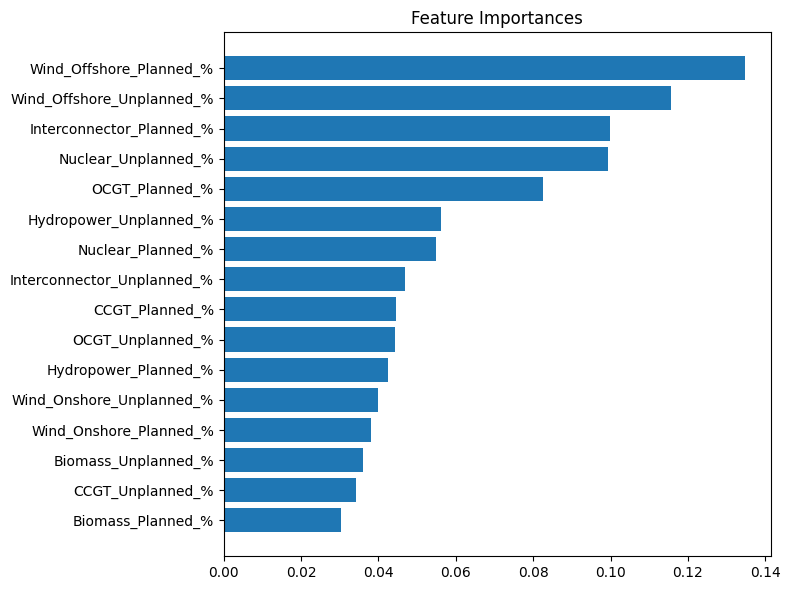

In [26]:
model_fuel_data_6, features_fuel_data_6, imp_fuel_data_6 = run_feature_importance_model(fuel_data)

[I 2025-08-03 20:41:30,824] A new study created in memory with name: no-name-6142049e-7475-4627-ab4b-922591b3fc5d



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:41:32,618] Trial 0 finished with value: -32.9242755053753 and parameters: {'n_estimators': 600, 'max_depth': 9, 'learning_rate': 0.01744546903694342, 'subsample': 0.7241350360063897, 'colsample_bytree': 0.8867534163724995, 'reg_alpha': 0.0009079191793650598, 'reg_lambda': 0.015226468186233926}. Best is trial 0 with value: -32.9242755053753.
[I 2025-08-03 20:41:33,349] Trial 1 finished with value: -27.69959964191862 and parameters: {'n_estimators': 300, 'max_depth': 9, 'learning_rate': 0.628176843741959, 'subsample': 0.8135385154875809, 'colsample_bytree': 0.8190516171606128, 'reg_alpha': 0.001506781868198407, 'reg_lambda': 1.219871538641171e-05}. Best is trial 1 with value: -27.69959964191862.
[I 2025-08-03 20:41:35,241] Trial 2 finished with value: -28.04776330443309 and parameters: {'n_estimators': 600, 'max_depth': 10, 'learning_rate': 0.49716974324576657, 'subsample': 0.6285497083728401, 'colsample_bytree': 0.5973862788455644, 'reg_alpha': 0.00010905802445541854, '


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 12, 'learning_rate': 0.3599692139276618, 'subsample': 0.9998987080079119, 'colsample_bytree': 0.6351510766053149, 'reg_alpha': 2.285474394780955e-05, 'reg_lambda': 0.0005226651776744615}

[Result] Train RMSE = 26.453, MAE = 14.079, R² = 0.766



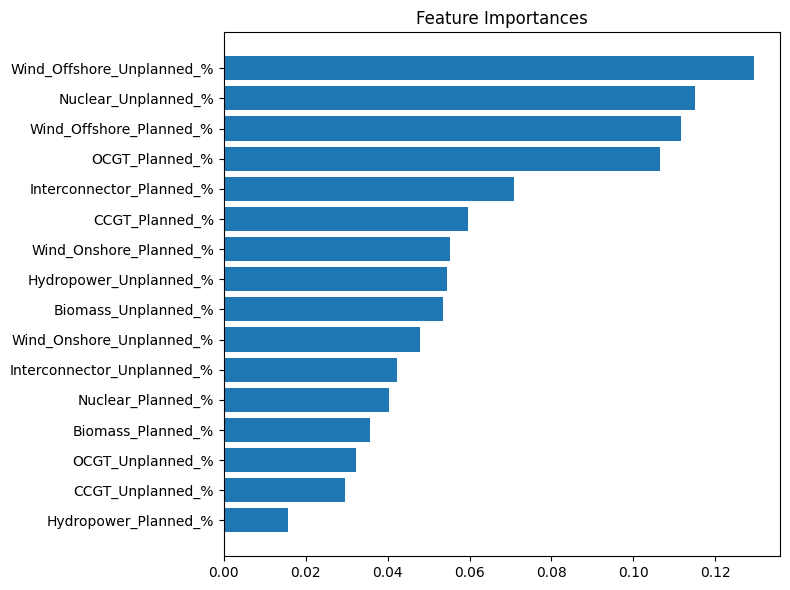

In [27]:
model_fuel_data_7, features_fuel_data_7, imp_fuel_data_7 = run_feature_importance_model(fuel_data)

[I 2025-08-03 20:48:10,913] A new study created in memory with name: no-name-8b5fbee9-bfbc-4451-8e02-8c90d8017b96



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:48:11,363] Trial 0 finished with value: -42.46936438975296 and parameters: {'n_estimators': 500, 'max_depth': 4, 'learning_rate': 0.030694603655114568, 'subsample': 0.5685781479417173, 'colsample_bytree': 0.8471230043501947, 'reg_alpha': 4.726291130371731e-05, 'reg_lambda': 8.562670595769258e-05}. Best is trial 0 with value: -42.46936438975296.
[I 2025-08-03 20:48:14,220] Trial 1 finished with value: -29.081272719611036 and parameters: {'n_estimators': 600, 'max_depth': 11, 'learning_rate': 0.8724557597842002, 'subsample': 0.5477551948789978, 'colsample_bytree': 0.9006544621090948, 'reg_alpha': 0.0002782197986376129, 'reg_lambda': 0.36389680325453}. Best is trial 1 with value: -29.081272719611036.
[I 2025-08-03 20:48:15,972] Trial 2 finished with value: -36.55014053519197 and parameters: {'n_estimators': 900, 'max_depth': 8, 'learning_rate': 0.00897699433157063, 'subsample': 0.5365222594158088, 'colsample_bytree': 0.6577370135792389, 'reg_alpha': 7.757766127006586, 're


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 9, 'learning_rate': 0.6587420962524186, 'subsample': 0.9999076875786082, 'colsample_bytree': 0.821233545997479, 'reg_alpha': 0.0029440794483457946, 'reg_lambda': 0.03440777260432287}

[Result] Train RMSE = 26.453, MAE = 14.087, R² = 0.766



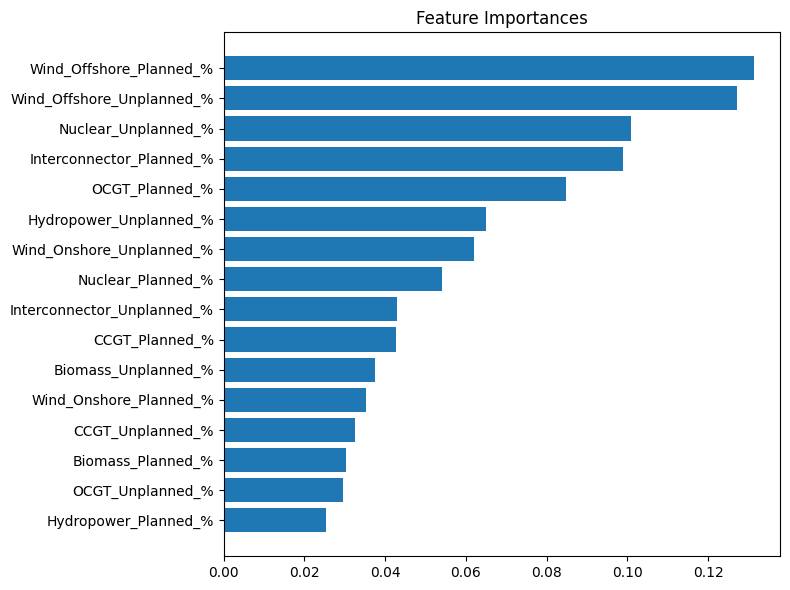

In [28]:
model_fuel_data_8, features_fuel_data_8, imp_fuel_data_8 = run_feature_importance_model(fuel_data)

[I 2025-08-03 20:52:04,367] A new study created in memory with name: no-name-4e92dcad-77a0-4b06-a51d-3a917980b8dd



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:52:07,618] Trial 0 finished with value: -36.27851870190382 and parameters: {'n_estimators': 900, 'max_depth': 9, 'learning_rate': 0.005265571844257899, 'subsample': 0.8591771796161176, 'colsample_bytree': 0.9684466825812591, 'reg_alpha': 0.07980183533168901, 'reg_lambda': 0.05480518524132554}. Best is trial 0 with value: -36.27851870190382.
[I 2025-08-03 20:52:07,781] Trial 1 finished with value: -41.68485879478833 and parameters: {'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.114537246905794, 'subsample': 0.5021783288559933, 'colsample_bytree': 0.5286883266284478, 'reg_alpha': 0.0013296864796007706, 'reg_lambda': 0.019372085303093114}. Best is trial 0 with value: -36.27851870190382.
[I 2025-08-03 20:52:10,126] Trial 2 finished with value: -38.55326428331143 and parameters: {'n_estimators': 200, 'max_depth': 12, 'learning_rate': 0.006304484352115434, 'subsample': 0.6923566842343102, 'colsample_bytree': 0.7532976994401184, 'reg_alpha': 1.3312906423153041, 'reg


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 11, 'learning_rate': 0.5404860956031448, 'subsample': 0.999786473134414, 'colsample_bytree': 0.750860012174824, 'reg_alpha': 0.20707642835568418, 'reg_lambda': 0.0011099528225357908}

[Result] Train RMSE = 26.453, MAE = 14.100, R² = 0.766



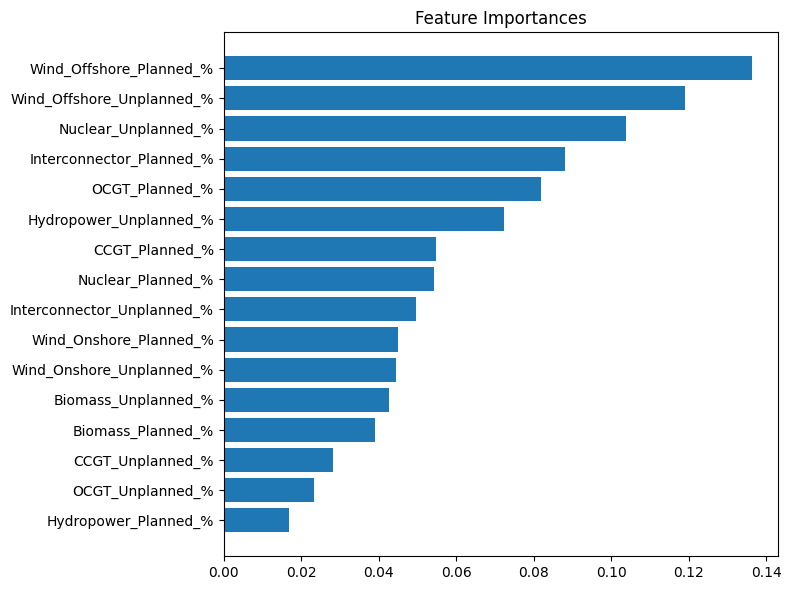

In [29]:
model_fuel_data_9, features_fuel_data_9, imp_fuel_data_9 = run_feature_importance_model(fuel_data)

[I 2025-08-03 20:58:12,038] A new study created in memory with name: no-name-780247ca-1c69-46c1-b3c6-275fb8e31f59



Starting hyperparameter search (100 trials)...



[I 2025-08-03 20:58:14,991] Trial 0 finished with value: -27.29164696738395 and parameters: {'n_estimators': 700, 'max_depth': 10, 'learning_rate': 0.5407077284653169, 'subsample': 0.756889550233666, 'colsample_bytree': 0.7308644827799109, 'reg_alpha': 0.00012840511229514752, 'reg_lambda': 0.18005250534958067}. Best is trial 0 with value: -27.29164696738395.
[I 2025-08-03 20:58:15,366] Trial 1 finished with value: -30.3854721738689 and parameters: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.9719047437802018, 'subsample': 0.7534860302774891, 'colsample_bytree': 0.7025724718454898, 'reg_alpha': 0.0027208822845180493, 'reg_lambda': 0.36498104406604615}. Best is trial 0 with value: -27.29164696738395.
[I 2025-08-03 20:58:16,003] Trial 2 finished with value: -51.25146377104942 and parameters: {'n_estimators': 800, 'max_depth': 3, 'learning_rate': 0.0010596748209151196, 'subsample': 0.8213477895982877, 'colsample_bytree': 0.726527884654327, 'reg_alpha': 0.47500125063410004, 'reg


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.4552492335440585, 'subsample': 0.9997897077659919, 'colsample_bytree': 0.5062234956190074, 'reg_alpha': 0.0010461642415789153, 'reg_lambda': 2.834488364992714e-05}

[Result] Train RMSE = 26.454, MAE = 14.136, R² = 0.766



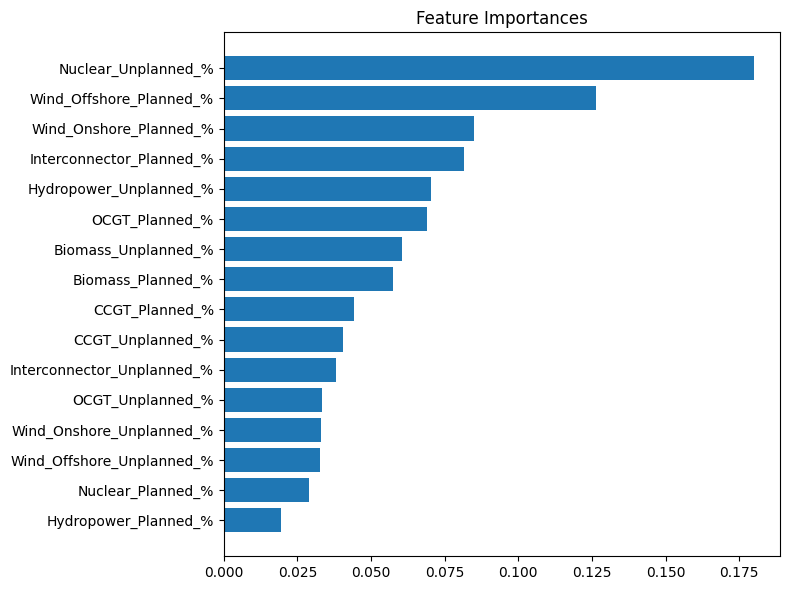

In [30]:
model_fuel_data_10, features_fuel_data_10, imp_fuel_data_10 = run_feature_importance_model(fuel_data)

In [ ]:
## Save all 10 models 
# List of models
models = [
    model_fuel_data_1,
    model_fuel_data_2,
    model_fuel_data_3,
    model_fuel_data_4,
    model_fuel_data_5,
    model_fuel_data_6,
    model_fuel_data_7,
    model_fuel_data_8,
    model_fuel_data_9,
    model_fuel_data_10
]

# Save each model
for i, model in enumerate(models, start=1):
    filename = f"model_fuel_data_{i}.joblib"
    joblib.dump(model, filename)
    print(f"Saved: {filename}")

Saved: model_fuel_data_1.joblib
Saved: model_fuel_data_2.joblib
Saved: model_fuel_data_3.joblib
Saved: model_fuel_data_4.joblib
Saved: model_fuel_data_5.joblib
Saved: model_fuel_data_6.joblib
Saved: model_fuel_data_7.joblib
Saved: model_fuel_data_8.joblib
Saved: model_fuel_data_9.joblib
Saved: model_fuel_data_10.joblib


In [ ]:
## Load all 10 models into a list
models = []

for i in range(1, 11):
    filename = f"model_fuel_data_{i}.joblib"
    model = joblib.load(filename)
    models.append(model)
    print(f"Loaded: {filename}")

Loaded: model_fuel_data_1.joblib
Loaded: model_fuel_data_2.joblib
Loaded: model_fuel_data_3.joblib
Loaded: model_fuel_data_4.joblib
Loaded: model_fuel_data_5.joblib
Loaded: model_fuel_data_6.joblib
Loaded: model_fuel_data_7.joblib
Loaded: model_fuel_data_8.joblib
Loaded: model_fuel_data_9.joblib
Loaded: model_fuel_data_10.joblib


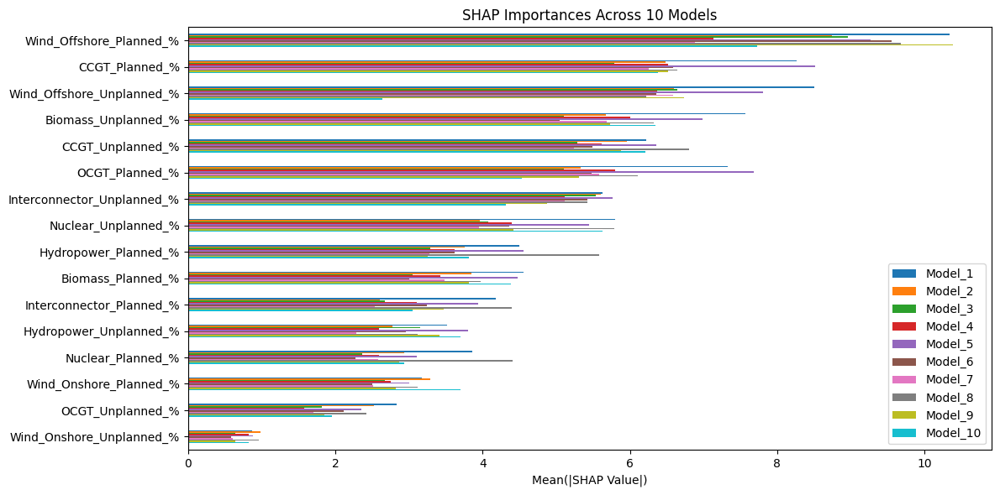

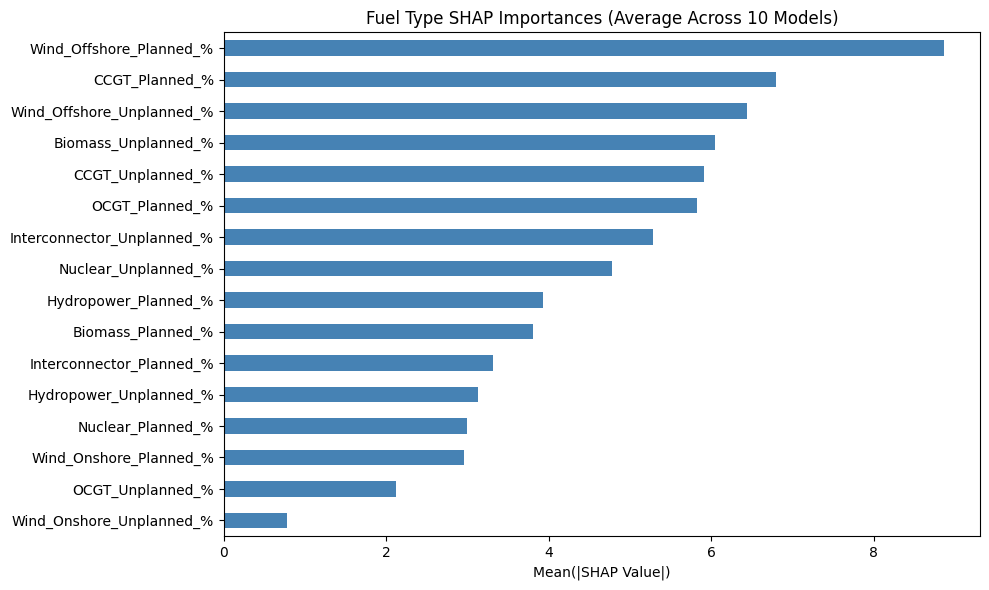

In [ ]:
# Compute SHAP values for each model 
def compute_shap_values(model, X, sample_size=None):
    if sample_size is not None and sample_size < len(X):
        X = X.sample(n=sample_size, random_state=42)
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)
    return shap_values, X  # Return sampled or full X for reference

def get_global_shap_importance(shap_values, X):
    return pd.Series(
        np.abs(shap_values).mean(axis=0),
        index=X.columns
    ).sort_values(ascending=False)

# Use the same dataset for all models 
shap_data = fuel_data.drop(columns=['StartTime', 'SystemPrice'])

# List of 10 models 
models = [
    model_fuel_data_1,
    model_fuel_data_2,
    model_fuel_data_3,
    model_fuel_data_4,
    model_fuel_data_5,
    model_fuel_data_6,
    model_fuel_data_7,
    model_fuel_data_8,
    model_fuel_data_9,
    model_fuel_data_10
]

# Compute SHAP values and global importances for each model 
shap_importances = []
for i, model in enumerate(models, start=1):
    shap_values, X_sampled = compute_shap_values(model, shap_data, sample_size=1000)
    shap_imp = get_global_shap_importance(shap_values, X_sampled)
    shap_importances.append(shap_imp.rename(f"Model_{i}"))

# Combine importances into a single DataFrame
shap_compare = pd.concat(shap_importances, axis=1)

# Compute average and standard deviation
shap_compare["Mean"] = shap_compare.mean(axis=1)
shap_compare["StdDev"] = shap_compare.std(axis=1)
shap_compare = shap_compare.sort_values(by="Mean", ascending=False)

# Plot SHAP importances for all 10 models
shap_compare.iloc[:, :10].plot(
    kind='barh',
    figsize=(12, max(6, len(shap_compare) * 0.3)),
    title='SHAP Importances Across 10 Models'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

# Plot average SHAP importance across models
shap_compare["Mean"].plot(
    kind='barh',
    figsize=(10, max(6, len(shap_compare) * 0.3)),
    title='Fuel Type SHAP Importances (Average Across 10 Models)',
    color='steelblue'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

## Fuel Type Feature Analysis (Planned)

[I 2025-08-04 11:40:40,222] A new study created in memory with name: no-name-c2f848fc-2747-4de1-9082-cc67d2d1c1ec



Starting hyperparameter search (100 trials)...



[I 2025-08-04 11:40:42,851] Trial 0 finished with value: -34.560530837025944 and parameters: {'n_estimators': 300, 'max_depth': 10, 'learning_rate': 0.11993672400847173, 'subsample': 0.5741406931468829, 'colsample_bytree': 0.7553052118534362, 'reg_alpha': 0.0004636434601352036, 'reg_lambda': 0.057720735212340835}. Best is trial 0 with value: -34.560530837025944.
[I 2025-08-04 11:40:45,710] Trial 1 finished with value: -38.09798752034446 and parameters: {'n_estimators': 900, 'max_depth': 11, 'learning_rate': 0.007463151559169231, 'subsample': 0.5040659779392458, 'colsample_bytree': 0.7013762579377544, 'reg_alpha': 0.0017011315244624898, 'reg_lambda': 5.159789646422268}. Best is trial 0 with value: -34.560530837025944.
[I 2025-08-04 11:40:46,051] Trial 2 finished with value: -48.44077966766334 and parameters: {'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.010582622392092251, 'subsample': 0.9374540684153427, 'colsample_bytree': 0.6672530669117888, 'reg_alpha': 0.0003490995175774


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 12, 'learning_rate': 0.5813116060851636, 'subsample': 0.9999336337301585, 'colsample_bytree': 0.9471993318758916, 'reg_alpha': 0.0013213557677463903, 'reg_lambda': 1.9419708045931373e-05}

[Result] Train RMSE = 33.696, MAE = 21.995, R² = 0.621



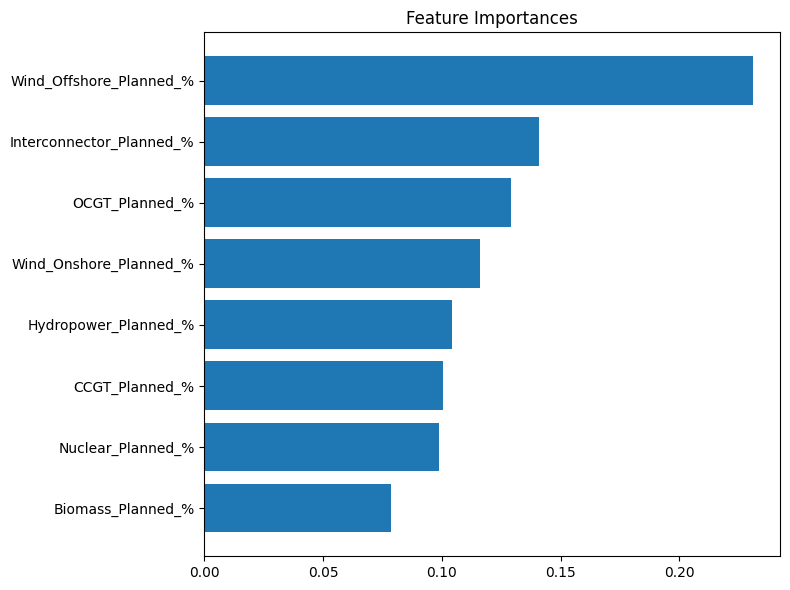

In [33]:
model_fuel_planned_data_1, features_fuel_planned_data_1, imp_fuel_planned_data_1 = run_feature_importance_model(fuel_data_planned)

[I 2025-08-04 11:44:29,843] A new study created in memory with name: no-name-76d167b0-b986-40fa-b8e4-acddfbc49729



Starting hyperparameter search (100 trials)...



[I 2025-08-04 11:44:30,470] Trial 0 finished with value: -48.60045664961526 and parameters: {'n_estimators': 500, 'max_depth': 7, 'learning_rate': 0.0015888179243689054, 'subsample': 0.7426654506014749, 'colsample_bytree': 0.725404254369423, 'reg_alpha': 0.001988654776158246, 'reg_lambda': 0.05853946580099316}. Best is trial 0 with value: -48.60045664961526.
[I 2025-08-04 11:44:30,820] Trial 1 finished with value: -34.52082064710414 and parameters: {'n_estimators': 200, 'max_depth': 9, 'learning_rate': 0.23500378998281968, 'subsample': 0.8962974608495254, 'colsample_bytree': 0.7108513471835471, 'reg_alpha': 0.0003298046365464107, 'reg_lambda': 0.04423097744056386}. Best is trial 1 with value: -34.52082064710414.
[I 2025-08-04 11:44:31,935] Trial 2 finished with value: -35.09002498204236 and parameters: {'n_estimators': 700, 'max_depth': 9, 'learning_rate': 0.07029763792927501, 'subsample': 0.7477431794045151, 'colsample_bytree': 0.5620247553571223, 'reg_alpha': 5.140854336287857, 'reg_


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.6011201646333568, 'subsample': 0.9999380884977592, 'colsample_bytree': 0.8229225615496596, 'reg_alpha': 0.0001286316672348901, 'reg_lambda': 0.027550226243323622}

[Result] Train RMSE = 33.696, MAE = 21.996, R² = 0.621



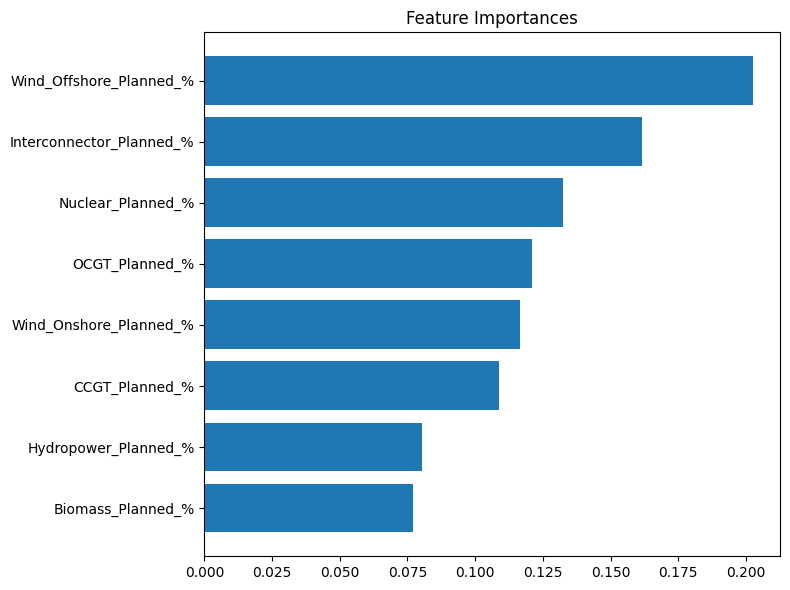

In [34]:
model_fuel_planned_data_2, features_fuel_planned_data_2, imp_fuel_planned_data_2 = run_feature_importance_model(fuel_data_planned)

[I 2025-08-04 11:47:28,431] A new study created in memory with name: no-name-b21318ef-79f8-40de-84fd-699cd84f53d4



Starting hyperparameter search (100 trials)...



[I 2025-08-04 11:47:28,980] Trial 0 finished with value: -38.452780411447414 and parameters: {'n_estimators': 700, 'max_depth': 5, 'learning_rate': 0.10561340301063987, 'subsample': 0.5856449405151878, 'colsample_bytree': 0.6275735193870199, 'reg_alpha': 0.00408372257565233, 'reg_lambda': 0.2694091575820246}. Best is trial 0 with value: -38.452780411447414.
[I 2025-08-04 11:47:32,805] Trial 1 finished with value: -34.19433291970771 and parameters: {'n_estimators': 900, 'max_depth': 12, 'learning_rate': 0.7818701658907867, 'subsample': 0.7782264149327465, 'colsample_bytree': 0.8587601090468591, 'reg_alpha': 0.020097760042227283, 'reg_lambda': 3.916516084960771e-05}. Best is trial 1 with value: -34.19433291970771.
[I 2025-08-04 11:47:33,790] Trial 2 finished with value: -34.07574751295512 and parameters: {'n_estimators': 700, 'max_depth': 8, 'learning_rate': 0.5980740690177587, 'subsample': 0.8713854572666446, 'colsample_bytree': 0.5287157220801297, 'reg_alpha': 0.00011506676450401227, '


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 11, 'learning_rate': 0.23260459382362905, 'subsample': 0.9994941883234381, 'colsample_bytree': 0.6881950998636794, 'reg_alpha': 0.07991097942479537, 'reg_lambda': 0.0027544119043927027}

[Result] Train RMSE = 33.697, MAE = 22.016, R² = 0.621



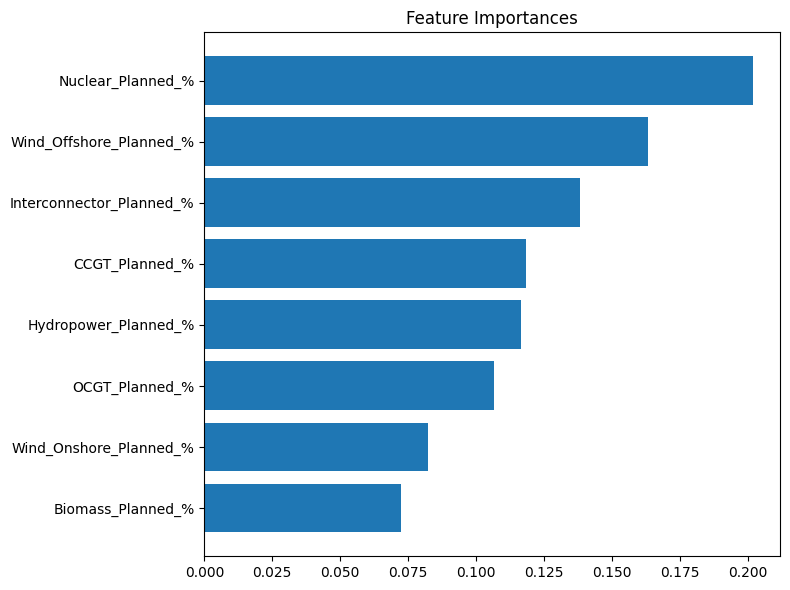

In [35]:
model_fuel_planned_data_3, features_fuel_planned_data_3, imp_fuel_planned_data_3 = run_feature_importance_model(fuel_data_planned)

[I 2025-08-04 11:50:05,487] A new study created in memory with name: no-name-f119a469-9e7b-47de-92c1-c1c746118b0d



Starting hyperparameter search (100 trials)...



[I 2025-08-04 11:50:06,203] Trial 0 finished with value: -42.26601232379631 and parameters: {'n_estimators': 900, 'max_depth': 6, 'learning_rate': 0.008988964110289797, 'subsample': 0.6492032099613934, 'colsample_bytree': 0.7497150923857168, 'reg_alpha': 0.002339301110184273, 'reg_lambda': 0.00011755142042039931}. Best is trial 0 with value: -42.26601232379631.
[I 2025-08-04 11:50:07,064] Trial 1 finished with value: -34.41785361777891 and parameters: {'n_estimators': 800, 'max_depth': 8, 'learning_rate': 0.5704132143701207, 'subsample': 0.6896998394810094, 'colsample_bytree': 0.7183252983816166, 'reg_alpha': 0.0003424836299748134, 'reg_lambda': 0.6128552572575103}. Best is trial 1 with value: -34.41785361777891.
[I 2025-08-04 11:50:08,045] Trial 2 finished with value: -34.04654754437454 and parameters: {'n_estimators': 600, 'max_depth': 10, 'learning_rate': 0.16716446582979805, 'subsample': 0.8088168147523958, 'colsample_bytree': 0.5749083277737284, 'reg_alpha': 0.04106875287643801, '


[Tuning complete] Best parameters:
{'n_estimators': 700, 'max_depth': 10, 'learning_rate': 0.5425202764377026, 'subsample': 0.9996752838600074, 'colsample_bytree': 0.7892408212306169, 'reg_alpha': 0.23527542017912373, 'reg_lambda': 0.01380922562760341}

[Result] Train RMSE = 33.697, MAE = 22.010, R² = 0.621



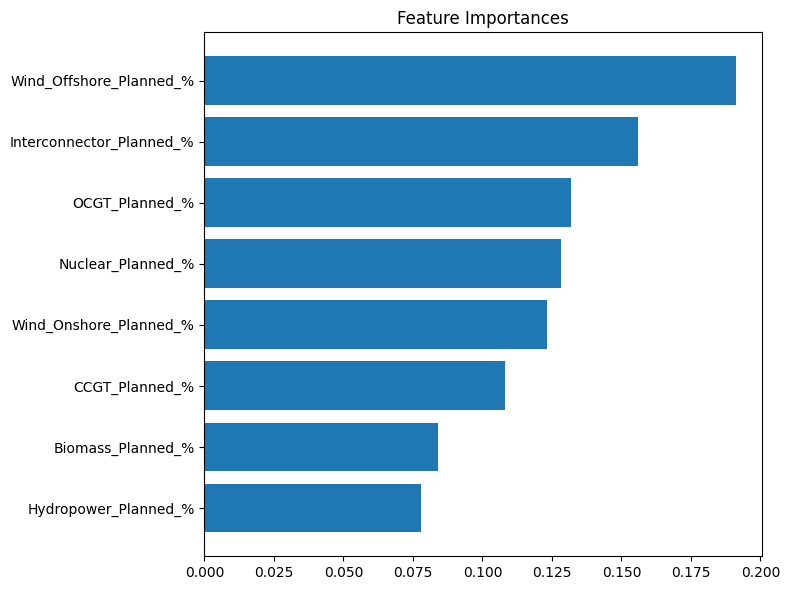

In [36]:
model_fuel_planned_data_4, features_fuel_planned_data_4, imp_fuel_planned_data_4 = run_feature_importance_model(fuel_data_planned)

[I 2025-08-04 11:52:19,451] A new study created in memory with name: no-name-37e023be-696e-4f45-93a4-052922ee150d



Starting hyperparameter search (100 trials)...



[I 2025-08-04 11:52:20,184] Trial 0 finished with value: -34.66234496201196 and parameters: {'n_estimators': 600, 'max_depth': 8, 'learning_rate': 0.3142207713185745, 'subsample': 0.621793751511377, 'colsample_bytree': 0.6737153759709811, 'reg_alpha': 0.01311853538244655, 'reg_lambda': 6.64870980220027}. Best is trial 0 with value: -34.66234496201196.
[I 2025-08-04 11:52:20,666] Trial 1 finished with value: -41.04813229192193 and parameters: {'n_estimators': 400, 'max_depth': 8, 'learning_rate': 0.01088604078058018, 'subsample': 0.6821252259848561, 'colsample_bytree': 0.6333301682008894, 'reg_alpha': 0.29797029263475794, 'reg_lambda': 0.012490388288890507}. Best is trial 0 with value: -34.66234496201196.
[I 2025-08-04 11:52:23,455] Trial 2 finished with value: -35.0041019283813 and parameters: {'n_estimators': 1000, 'max_depth': 12, 'learning_rate': 0.6929600561886555, 'subsample': 0.530155673043996, 'colsample_bytree': 0.6027362937415129, 'reg_alpha': 0.00028360817825096935, 'reg_lamb


[Tuning complete] Best parameters:
{'n_estimators': 800, 'max_depth': 11, 'learning_rate': 0.8716360003587378, 'subsample': 0.9999894673463642, 'colsample_bytree': 0.9289146928057102, 'reg_alpha': 0.0032572646765098817, 'reg_lambda': 0.006999948263447373}

[Result] Train RMSE = 33.696, MAE = 21.996, R² = 0.621



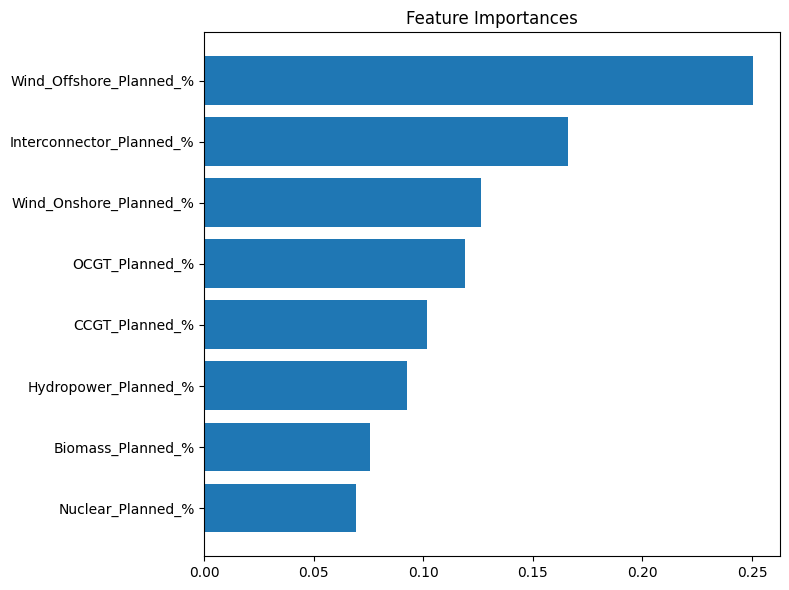

In [37]:
model_fuel_planned_data_5, features_fuel_planned_data_5, imp_fuel_planned_data_5 = run_feature_importance_model(fuel_data_planned)

[I 2025-08-04 11:54:26,239] A new study created in memory with name: no-name-05ddaef8-8104-4f3c-bcba-217b3011879a



Starting hyperparameter search (100 trials)...



[I 2025-08-04 11:54:26,817] Trial 0 finished with value: -35.77518529838175 and parameters: {'n_estimators': 700, 'max_depth': 6, 'learning_rate': 0.20920912148377, 'subsample': 0.6262542061535823, 'colsample_bytree': 0.9306891197214612, 'reg_alpha': 3.0202908130423467e-05, 'reg_lambda': 0.5063927861599388}. Best is trial 0 with value: -35.77518529838175.
[I 2025-08-04 11:54:27,366] Trial 1 finished with value: -35.13487912602107 and parameters: {'n_estimators': 400, 'max_depth': 9, 'learning_rate': 0.0748902162722679, 'subsample': 0.9926450993429567, 'colsample_bytree': 0.6767771884619761, 'reg_alpha': 0.14677318323772678, 'reg_lambda': 0.0004138735613140759}. Best is trial 1 with value: -35.13487912602107.
[I 2025-08-04 11:54:28,260] Trial 2 finished with value: -48.40815478276304 and parameters: {'n_estimators': 700, 'max_depth': 8, 'learning_rate': 0.001043641463460673, 'subsample': 0.6190523636781118, 'colsample_bytree': 0.7827399422277476, 'reg_alpha': 0.3683718751379194, 'reg_la


[Tuning complete] Best parameters:
{'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.6585793526121425, 'subsample': 0.9998470829167824, 'colsample_bytree': 0.8385819758538192, 'reg_alpha': 0.10207307448753895, 'reg_lambda': 3.593165677967741}

[Result] Train RMSE = 33.696, MAE = 22.008, R² = 0.621



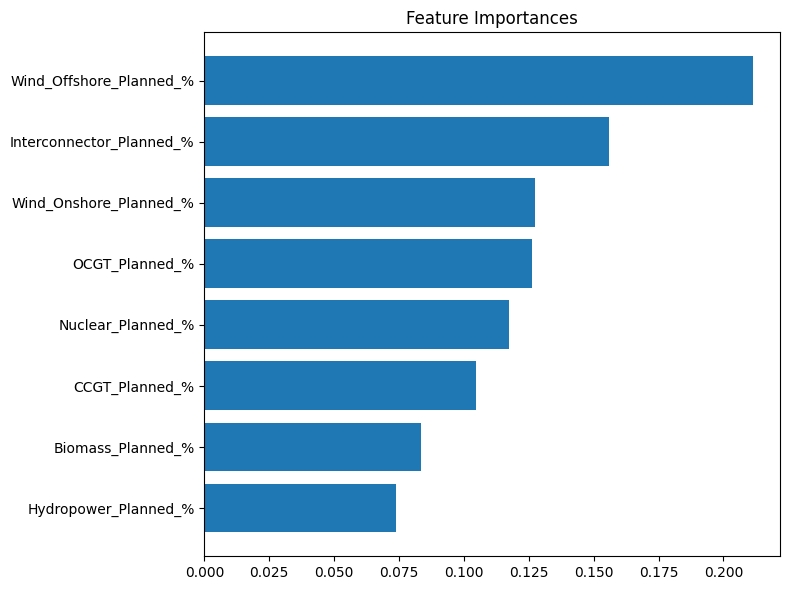

In [38]:
model_fuel_planned_data_6, features_fuel_planned_data_6, imp_fuel_planned_data_6 = run_feature_importance_model(fuel_data_planned)

[I 2025-08-04 11:56:50,904] A new study created in memory with name: no-name-c2d53cfd-eb7d-4b36-8ba3-1ce1c2751df6



Starting hyperparameter search (100 trials)...



[I 2025-08-04 11:56:51,037] Trial 0 finished with value: -48.26910824123382 and parameters: {'n_estimators': 100, 'max_depth': 4, 'learning_rate': 0.027579664988920373, 'subsample': 0.7050538085970853, 'colsample_bytree': 0.7772104722373351, 'reg_alpha': 1.0794946382511554, 'reg_lambda': 0.0004680202328136498}. Best is trial 0 with value: -48.26910824123382.
[I 2025-08-04 11:56:55,339] Trial 1 finished with value: -41.29498353044726 and parameters: {'n_estimators': 900, 'max_depth': 12, 'learning_rate': 0.001629843438644991, 'subsample': 0.9146366645966596, 'colsample_bytree': 0.750320302756586, 'reg_alpha': 0.0002375922658784876, 'reg_lambda': 1.1356329849528948}. Best is trial 1 with value: -41.29498353044726.
[I 2025-08-04 11:56:55,417] Trial 2 finished with value: -46.750551299256195 and parameters: {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.03145956785448413, 'subsample': 0.6418018644025321, 'colsample_bytree': 0.5539488985704977, 'reg_alpha': 0.007494982145370216, '


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.6507399812407463, 'subsample': 0.9996036614331334, 'colsample_bytree': 0.6666055745519552, 'reg_alpha': 0.008575578226425682, 'reg_lambda': 0.0019330945317823818}

[Result] Train RMSE = 33.697, MAE = 22.006, R² = 0.621



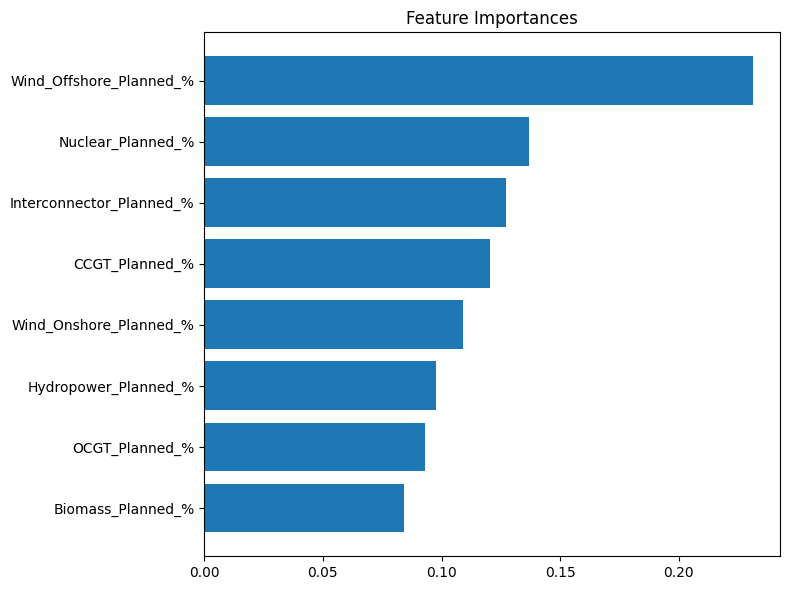

In [39]:
model_fuel_planned_data_7, features_fuel_planned_data_7, imp_fuel_planned_data_7 = run_feature_importance_model(fuel_data_planned)

[I 2025-08-04 11:59:11,830] A new study created in memory with name: no-name-5d03821a-481b-4402-b36d-ec4b7599f015



Starting hyperparameter search (100 trials)...



[I 2025-08-04 11:59:13,983] Trial 0 finished with value: -41.53083304977596 and parameters: {'n_estimators': 700, 'max_depth': 11, 'learning_rate': 0.002570195945846679, 'subsample': 0.9720967745565277, 'colsample_bytree': 0.5541410469675064, 'reg_alpha': 0.0914322462774692, 'reg_lambda': 0.0011128928581356763}. Best is trial 0 with value: -41.53083304977596.
[I 2025-08-04 11:59:14,054] Trial 1 finished with value: -38.66982233957425 and parameters: {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.8063935655946862, 'subsample': 0.8557493438032908, 'colsample_bytree': 0.787022632954287, 'reg_alpha': 0.0007247137972543958, 'reg_lambda': 0.031095805974073337}. Best is trial 1 with value: -38.66982233957425.
[I 2025-08-04 11:59:14,509] Trial 2 finished with value: -40.1863418575075 and parameters: {'n_estimators': 300, 'max_depth': 8, 'learning_rate': 0.018508999032324232, 'subsample': 0.8685994304533426, 'colsample_bytree': 0.8073333059653651, 'reg_alpha': 6.83917743135268, 'reg_l


[Tuning complete] Best parameters:
{'n_estimators': 800, 'max_depth': 12, 'learning_rate': 0.18414533656740842, 'subsample': 0.9999158608754132, 'colsample_bytree': 0.7800214015440048, 'reg_alpha': 2.4276758708418912e-05, 'reg_lambda': 0.0001857118403812101}

[Result] Train RMSE = 33.696, MAE = 21.999, R² = 0.621



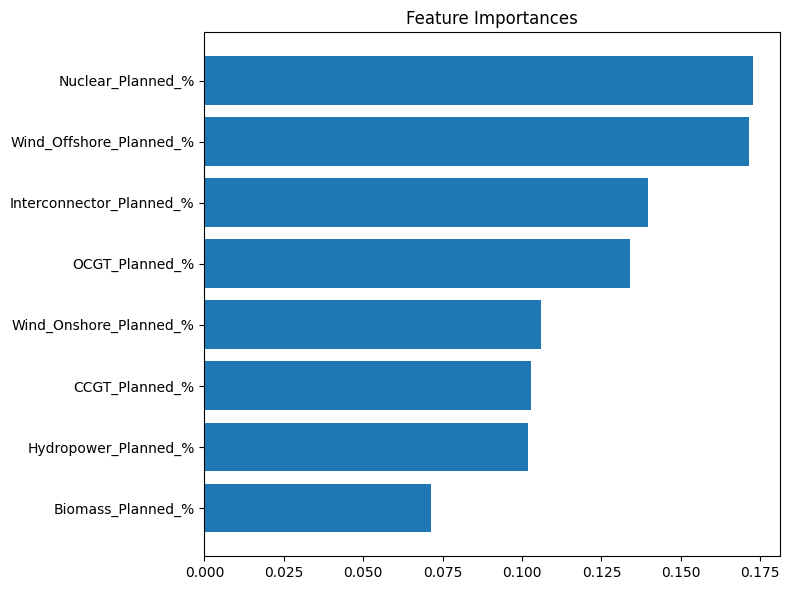

In [40]:
model_fuel_planned_data_8, features_fuel_planned_data_8, imp_fuel_planned_data_8 = run_feature_importance_model(fuel_data_planned)

[I 2025-08-04 12:01:44,618] A new study created in memory with name: no-name-1492fb40-afcd-47bd-a556-672f0a245ac0



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:01:46,923] Trial 0 finished with value: -43.10818022609873 and parameters: {'n_estimators': 600, 'max_depth': 12, 'learning_rate': 0.0022813004664868288, 'subsample': 0.8145022112287517, 'colsample_bytree': 0.7995140777835299, 'reg_alpha': 0.0015059869038616305, 'reg_lambda': 6.953950165089649}. Best is trial 0 with value: -43.10818022609873.
[I 2025-08-04 12:01:50,584] Trial 1 finished with value: -34.05201344167026 and parameters: {'n_estimators': 1000, 'max_depth': 12, 'learning_rate': 0.3331427730082838, 'subsample': 0.5888221165840752, 'colsample_bytree': 0.8824167671084661, 'reg_alpha': 0.4244440781678352, 'reg_lambda': 0.059260595351147326}. Best is trial 1 with value: -34.05201344167026.
[I 2025-08-04 12:01:50,919] Trial 2 finished with value: -48.59516184562412 and parameters: {'n_estimators': 300, 'max_depth': 6, 'learning_rate': 0.003575276543709611, 'subsample': 0.7827435226802971, 'colsample_bytree': 0.5414194976981652, 'reg_alpha': 0.00012132587388451272,


[Tuning complete] Best parameters:
{'n_estimators': 500, 'max_depth': 12, 'learning_rate': 0.4191463793208725, 'subsample': 0.9997529598579793, 'colsample_bytree': 0.5758890366867216, 'reg_alpha': 0.002243438169338087, 'reg_lambda': 0.0029219756277269254}

[Result] Train RMSE = 33.697, MAE = 22.012, R² = 0.621



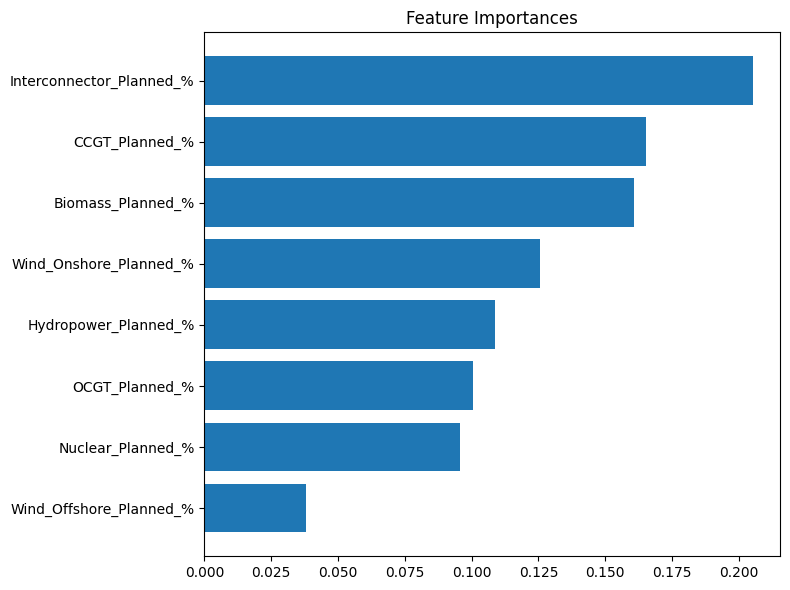

In [41]:
model_fuel_planned_data_9, features_fuel_planned_data_9, imp_fuel_planned_data_9 = run_feature_importance_model(fuel_data_planned)

[I 2025-08-04 12:04:36,755] A new study created in memory with name: no-name-be330b8d-a750-4880-92f1-fdd17b2e53fd



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:04:37,945] Trial 0 finished with value: -34.43912089972855 and parameters: {'n_estimators': 900, 'max_depth': 9, 'learning_rate': 0.4991083796957328, 'subsample': 0.6491811177338862, 'colsample_bytree': 0.5638551425419871, 'reg_alpha': 0.3193641281341648, 'reg_lambda': 0.02959007042973466}. Best is trial 0 with value: -34.43912089972855.
[I 2025-08-04 12:04:39,280] Trial 1 finished with value: -34.50055352070392 and parameters: {'n_estimators': 300, 'max_depth': 12, 'learning_rate': 0.05153010647252167, 'subsample': 0.5244424537460413, 'colsample_bytree': 0.8482445795031788, 'reg_alpha': 1.671703921927969e-05, 'reg_lambda': 0.00011487791523753628}. Best is trial 0 with value: -34.43912089972855.
[I 2025-08-04 12:04:39,955] Trial 2 finished with value: -36.19989387055259 and parameters: {'n_estimators': 400, 'max_depth': 10, 'learning_rate': 0.037530492457287276, 'subsample': 0.6612632899255098, 'colsample_bytree': 0.5900958725606213, 'reg_alpha': 1.1823097274680678e-05


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 10, 'learning_rate': 0.5375532667321136, 'subsample': 0.9992776428800634, 'colsample_bytree': 0.7651717145566439, 'reg_alpha': 0.00024263218383482096, 'reg_lambda': 0.0057406239746346805}

[Result] Train RMSE = 33.699, MAE = 22.015, R² = 0.621



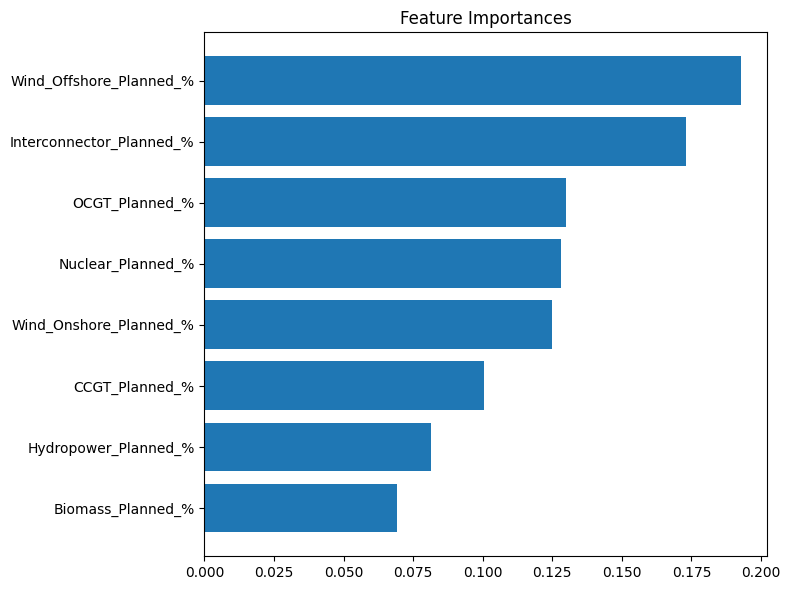

In [42]:
model_fuel_planned_data_10, features_fuel_planned_data_10, imp_fuel_planned_data_10 = run_feature_importance_model(fuel_data_planned)

In [ ]:
# Save all 10 models 
# List of models
models = [
    model_fuel_planned_data_1,
    model_fuel_planned_data_2,
    model_fuel_planned_data_3,
    model_fuel_planned_data_4,
    model_fuel_planned_data_5,
    model_fuel_planned_data_6,
    model_fuel_planned_data_7,
    model_fuel_planned_data_8,
    model_fuel_planned_data_9,
    model_fuel_planned_data_10
]

# Save each model
for i, model in enumerate(models, start=1):
    filename = f"model_fuel_planned_data_{i}.joblib"
    joblib.dump(model, filename)
    print(f"Saved: {filename}")

Saved: model_fuel_planned_data_1.joblib
Saved: model_fuel_planned_data_2.joblib
Saved: model_fuel_planned_data_3.joblib
Saved: model_fuel_planned_data_4.joblib
Saved: model_fuel_planned_data_5.joblib
Saved: model_fuel_planned_data_6.joblib
Saved: model_fuel_planned_data_7.joblib
Saved: model_fuel_planned_data_8.joblib
Saved: model_fuel_planned_data_9.joblib
Saved: model_fuel_planned_data_10.joblib


In [ ]:
# Load all 10 models into a list
models = []

for i in range(1, 11):
    filename = f"model_fuel_planned_data_{i}.joblib"
    model = joblib.load(filename)
    models.append(model)
    print(f"Loaded: {filename}")

Loaded: model_fuel_planned_data_1.joblib
Loaded: model_fuel_planned_data_2.joblib
Loaded: model_fuel_planned_data_3.joblib
Loaded: model_fuel_planned_data_4.joblib
Loaded: model_fuel_planned_data_5.joblib
Loaded: model_fuel_planned_data_6.joblib
Loaded: model_fuel_planned_data_7.joblib
Loaded: model_fuel_planned_data_8.joblib
Loaded: model_fuel_planned_data_9.joblib
Loaded: model_fuel_planned_data_10.joblib


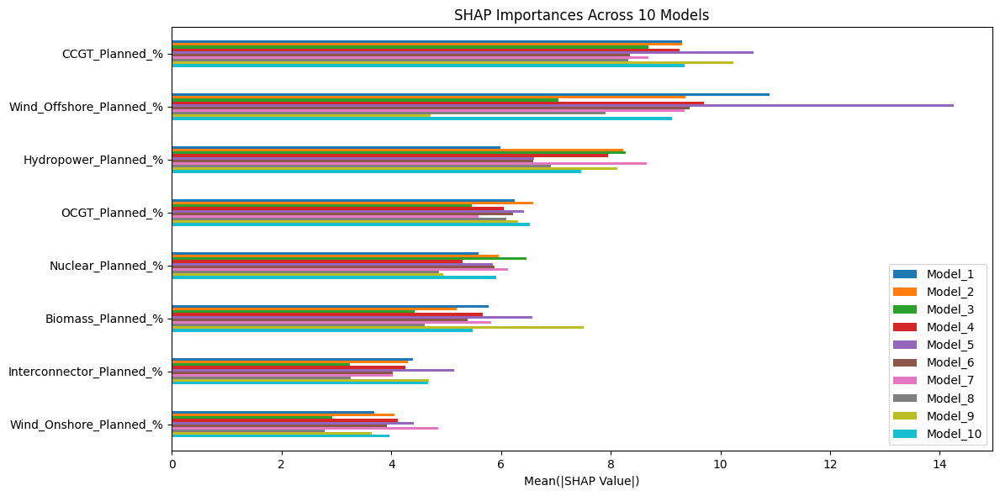

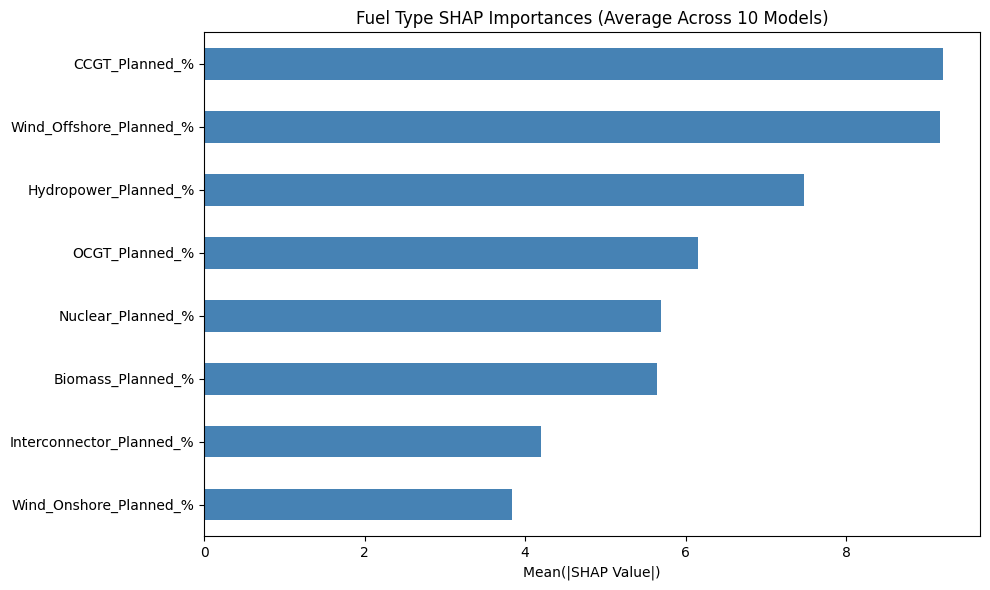

In [ ]:
# Use the same dataset for all models
shap_data = fuel_data_planned.drop(columns=['StartTime', 'SystemPrice'])

# List of 10 models
models = [
    model_fuel_planned_data_1,
    model_fuel_planned_data_2,
    model_fuel_planned_data_3,
    model_fuel_planned_data_4,
    model_fuel_planned_data_5,
    model_fuel_planned_data_6,
    model_fuel_planned_data_7,
    model_fuel_planned_data_8,
    model_fuel_planned_data_9,
    model_fuel_planned_data_10
]

# Compute SHAP values and global importances for each model 
shap_importances = []
for i, model in enumerate(models, start=1):
    shap_values, X_sampled = compute_shap_values(model, shap_data, sample_size=1000)
    shap_imp = get_global_shap_importance(shap_values, X_sampled)
    shap_importances.append(shap_imp.rename(f"Model_{i}"))

# Combine importances into a single DataFrame
shap_compare = pd.concat(shap_importances, axis=1)

# Compute average and standard deviation
shap_compare["Mean"] = shap_compare.mean(axis=1)
shap_compare["StdDev"] = shap_compare.std(axis=1)
shap_compare = shap_compare.sort_values(by="Mean", ascending=False)

# Plot SHAP importances for all 10 models       
shap_compare.iloc[:, :10].plot(
    kind='barh',
    figsize=(12, max(6, len(shap_compare) * 0.3)),
    title='SHAP Importances Across 10 Models'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

# Plot average SHAP importance across models
shap_compare["Mean"].plot(
    kind='barh',
    figsize=(10, max(6, len(shap_compare) * 0.3)),
    title='Fuel Type SHAP Importances (Average Across 10 Models)',
    color='steelblue'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

## Fuel Type Feature Analysis (Unplanned)

[I 2025-08-04 12:10:33,370] A new study created in memory with name: no-name-dd18fd3c-dbbd-4983-81c2-45f37138960b



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:10:33,826] Trial 0 finished with value: -33.72155200438209 and parameters: {'n_estimators': 100, 'max_depth': 12, 'learning_rate': 0.10887254786765582, 'subsample': 0.9557985637681596, 'colsample_bytree': 0.735245267553704, 'reg_alpha': 0.00035456013505192854, 'reg_lambda': 0.5751173958516591}. Best is trial 0 with value: -33.72155200438209.
[I 2025-08-04 12:10:34,088] Trial 1 finished with value: -46.92795972452719 and parameters: {'n_estimators': 600, 'max_depth': 3, 'learning_rate': 0.020449165173140677, 'subsample': 0.7348893354115436, 'colsample_bytree': 0.7057695271490056, 'reg_alpha': 0.06328183837503809, 'reg_lambda': 7.042132561925626e-05}. Best is trial 0 with value: -33.72155200438209.
[I 2025-08-04 12:10:34,684] Trial 2 finished with value: -32.08821042304516 and parameters: {'n_estimators': 300, 'max_depth': 10, 'learning_rate': 0.24443210779900437, 'subsample': 0.9951400776231893, 'colsample_bytree': 0.9501460786185554, 'reg_alpha': 7.919269169517557, 're


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 11, 'learning_rate': 0.2248004652197637, 'subsample': 0.9999470762090854, 'colsample_bytree': 0.9123320547764876, 'reg_alpha': 0.024773009325881567, 'reg_lambda': 0.292201225100889}

[Result] Train RMSE = 31.794, MAE = 19.433, R² = 0.663



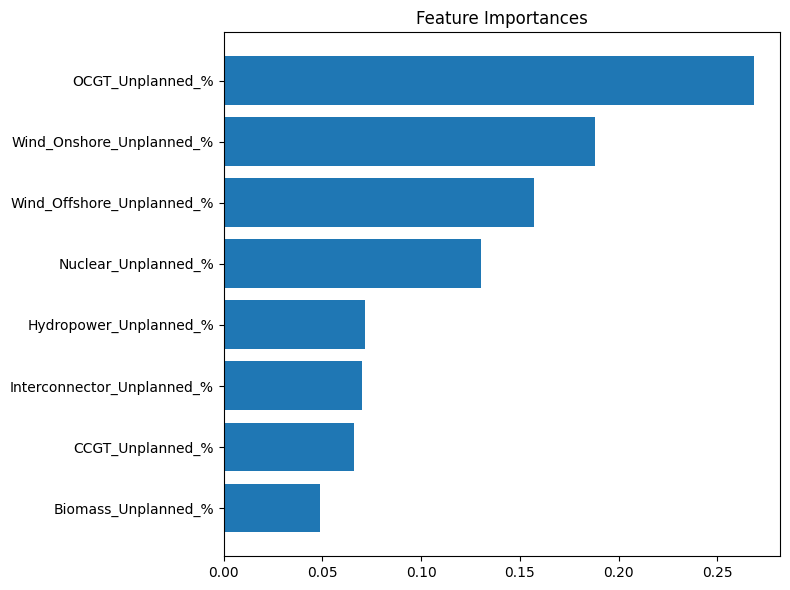

In [48]:
model_fuel_unplanned_data_1, features_fuel_unplanned_data_1, imp_fuel_unplanned_data_1 = run_feature_importance_model(fuel_data_unplanned)

[I 2025-08-04 12:13:46,528] A new study created in memory with name: no-name-02303f21-c549-441c-89b8-60e7220c1c36



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:13:46,832] Trial 0 finished with value: -48.94315639487822 and parameters: {'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.006925057564208539, 'subsample': 0.9098795011486952, 'colsample_bytree': 0.5153994504192515, 'reg_alpha': 9.325289216165635e-05, 'reg_lambda': 0.3516475173217597}. Best is trial 0 with value: -48.94315639487822.
[I 2025-08-04 12:13:47,974] Trial 1 finished with value: -32.59411392554817 and parameters: {'n_estimators': 800, 'max_depth': 8, 'learning_rate': 0.5041189656280276, 'subsample': 0.7209939998764838, 'colsample_bytree': 0.9757860905132771, 'reg_alpha': 0.14369409263683805, 'reg_lambda': 0.0013326626532131345}. Best is trial 1 with value: -32.59411392554817.
[I 2025-08-04 12:13:48,241] Trial 2 finished with value: -43.101772925607904 and parameters: {'n_estimators': 400, 'max_depth': 3, 'learning_rate': 0.1622813236927525, 'subsample': 0.8631629052668726, 'colsample_bytree': 0.8859293898208287, 'reg_alpha': 0.0012554561668364154, 'r


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 10, 'learning_rate': 0.431987516455943, 'subsample': 0.9996558756362995, 'colsample_bytree': 0.5801635147857518, 'reg_alpha': 2.038415211459072, 'reg_lambda': 0.004556463151660852}

[Result] Train RMSE = 31.800, MAE = 19.569, R² = 0.662



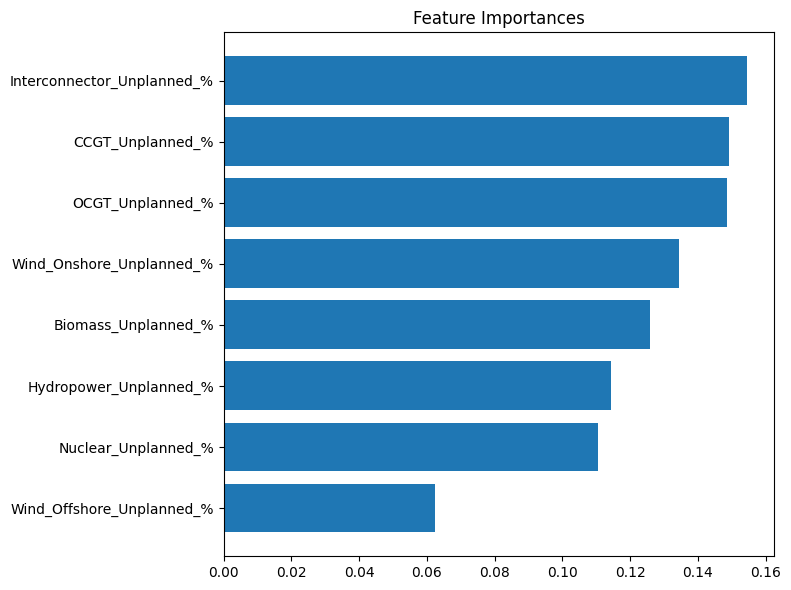

In [49]:
model_fuel_unplanned_data_2, features_fuel_unplanned_data_2, imp_fuel_unplanned_data_2 = run_feature_importance_model(fuel_data_unplanned)

[I 2025-08-04 12:16:46,902] A new study created in memory with name: no-name-4873fc57-9ca3-4698-a7f1-c39c6d39b43d



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:16:47,126] Trial 0 finished with value: -39.23889710775933 and parameters: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.05979701924217697, 'subsample': 0.6320133320775649, 'colsample_bytree': 0.9263106424498044, 'reg_alpha': 1.523359559402897, 'reg_lambda': 0.44269933956799623}. Best is trial 0 with value: -39.23889710775933.
[I 2025-08-04 12:16:47,381] Trial 1 finished with value: -36.000389560996474 and parameters: {'n_estimators': 400, 'max_depth': 5, 'learning_rate': 0.3846694317227685, 'subsample': 0.9549919048298612, 'colsample_bytree': 0.8425683086768296, 'reg_alpha': 3.0640812862247233, 'reg_lambda': 5.185433129411065}. Best is trial 1 with value: -36.000389560996474.
[I 2025-08-04 12:16:47,748] Trial 2 finished with value: -49.025187769453204 and parameters: {'n_estimators': 300, 'max_depth': 8, 'learning_rate': 0.002368065630908339, 'subsample': 0.5144920079838724, 'colsample_bytree': 0.5264821629687305, 'reg_alpha': 1.1495570209437135e-05, 'reg_l


[Tuning complete] Best parameters:
{'n_estimators': 600, 'max_depth': 11, 'learning_rate': 0.9151105849646606, 'subsample': 0.9997933293257522, 'colsample_bytree': 0.95792154405215, 'reg_alpha': 3.982867270020619e-05, 'reg_lambda': 5.413796021416086}

[Result] Train RMSE = 31.794, MAE = 19.440, R² = 0.663



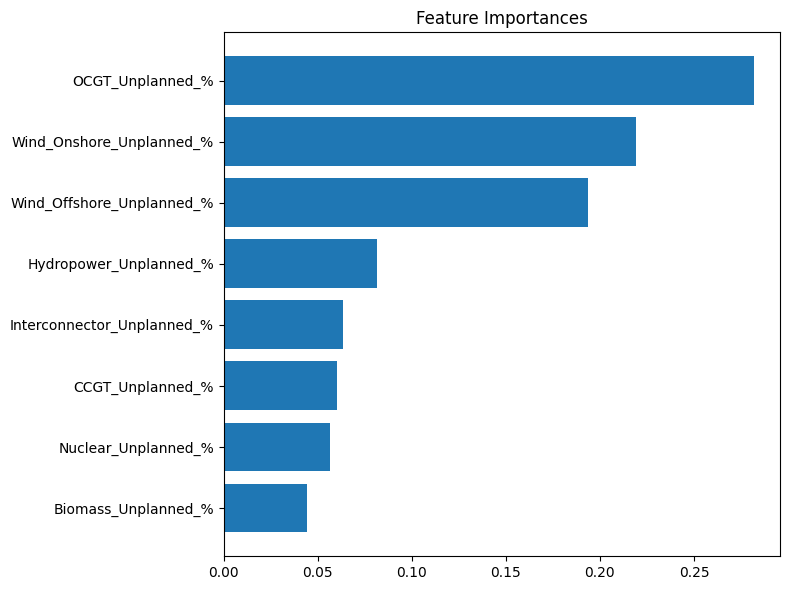

In [50]:
model_fuel_unplanned_data_3, features_fuel_unplanned_data_3, imp_fuel_unplanned_data_3 = run_feature_importance_model(fuel_data_unplanned)

[I 2025-08-04 12:20:46,214] A new study created in memory with name: no-name-902b1397-ea6a-4607-8f40-abbc76f1d9bb



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:20:46,999] Trial 0 finished with value: -32.3407494940131 and parameters: {'n_estimators': 500, 'max_depth': 9, 'learning_rate': 0.66544777294607, 'subsample': 0.7965473371565315, 'colsample_bytree': 0.8490206609618249, 'reg_alpha': 0.0001020143377818874, 'reg_lambda': 0.4612827447685087}. Best is trial 0 with value: -32.3407494940131.
[I 2025-08-04 12:20:47,503] Trial 1 finished with value: -33.140531335151735 and parameters: {'n_estimators': 200, 'max_depth': 11, 'learning_rate': 0.16662039704984458, 'subsample': 0.5875325825032209, 'colsample_bytree': 0.5885422780027096, 'reg_alpha': 0.003387213946874505, 'reg_lambda': 4.548048586719249e-05}. Best is trial 0 with value: -32.3407494940131.
[I 2025-08-04 12:20:49,478] Trial 2 finished with value: -34.98203889778042 and parameters: {'n_estimators': 600, 'max_depth': 12, 'learning_rate': 0.01564224295759058, 'subsample': 0.771526412674931, 'colsample_bytree': 0.526133546213214, 'reg_alpha': 0.05504080390342447, 'reg_lam


[Tuning complete] Best parameters:
{'n_estimators': 600, 'max_depth': 11, 'learning_rate': 0.892438419334811, 'subsample': 0.9999881754140497, 'colsample_bytree': 0.7353505655829077, 'reg_alpha': 0.00045216129899009876, 'reg_lambda': 2.3699661019914857}

[Result] Train RMSE = 31.794, MAE = 19.430, R² = 0.663



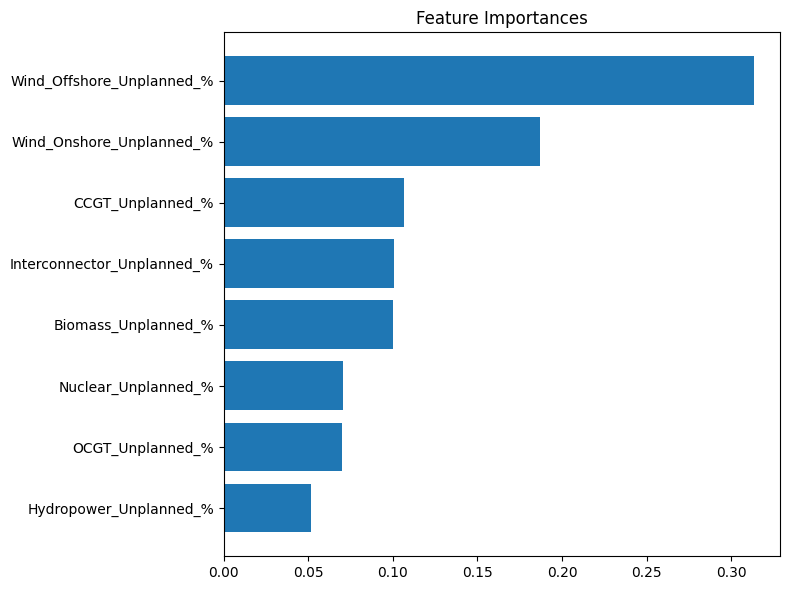

In [51]:
model_fuel_unplanned_data_4, features_fuel_unplanned_data_4, imp_fuel_unplanned_data_4 = run_feature_importance_model(fuel_data_unplanned)

[I 2025-08-04 12:24:00,195] A new study created in memory with name: no-name-871da5cc-0bdd-4e17-b398-498fbbe86172



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:24:01,297] Trial 0 finished with value: -36.24727021615222 and parameters: {'n_estimators': 500, 'max_depth': 9, 'learning_rate': 0.02427940723946764, 'subsample': 0.9861550109922981, 'colsample_bytree': 0.79749062583205, 'reg_alpha': 0.05978629451921026, 'reg_lambda': 2.718649780909481e-05}. Best is trial 0 with value: -36.24727021615222.
[I 2025-08-04 12:24:01,582] Trial 1 finished with value: -44.092806198049466 and parameters: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.013848178164370816, 'subsample': 0.7795568011898778, 'colsample_bytree': 0.7148707290467882, 'reg_alpha': 0.0005966544670637346, 'reg_lambda': 1.422600805445636e-05}. Best is trial 0 with value: -36.24727021615222.
[I 2025-08-04 12:24:03,412] Trial 2 finished with value: -32.343413388421475 and parameters: {'n_estimators': 700, 'max_depth': 10, 'learning_rate': 0.11762908373903586, 'subsample': 0.9327066448452341, 'colsample_bytree': 0.6149495161449845, 'reg_alpha': 1.1697605152035593, 


[Tuning complete] Best parameters:
{'n_estimators': 800, 'max_depth': 11, 'learning_rate': 0.46321796236356433, 'subsample': 0.9997769878148453, 'colsample_bytree': 0.7507237754445133, 'reg_alpha': 0.00019704893974653638, 'reg_lambda': 4.7986571507331786e-05}

[Result] Train RMSE = 31.794, MAE = 19.433, R² = 0.663



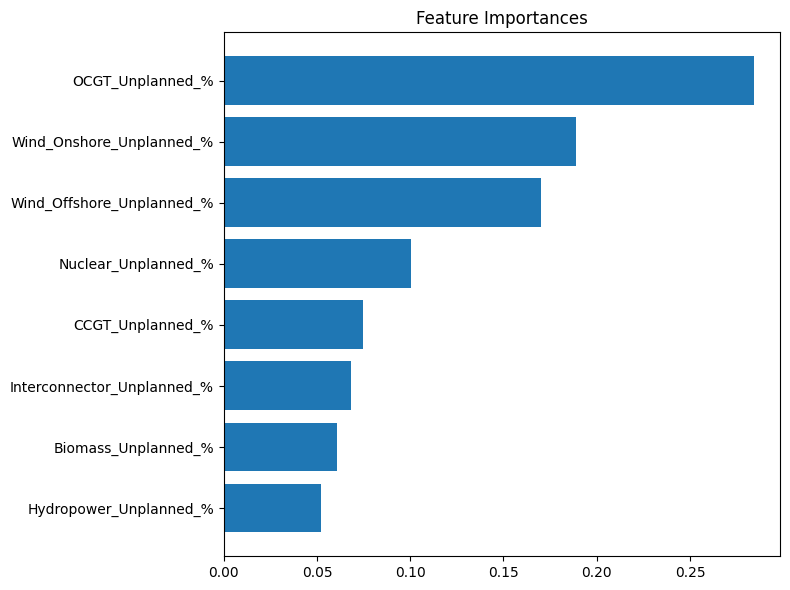

In [52]:
model_fuel_unplanned_data_5, features_fuel_unplanned_data_5, imp_fuel_unplanned_data_5 = run_feature_importance_model(fuel_data_unplanned)

[I 2025-08-04 12:26:48,705] A new study created in memory with name: no-name-7b097e3b-0673-42bc-873f-70c2029f0270



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:26:49,172] Trial 0 finished with value: -41.38184981185904 and parameters: {'n_estimators': 500, 'max_depth': 6, 'learning_rate': 0.02492374539961283, 'subsample': 0.905993998615521, 'colsample_bytree': 0.7934816014878502, 'reg_alpha': 0.14837965648621376, 'reg_lambda': 0.0021848098347166654}. Best is trial 0 with value: -41.38184981185904.
[I 2025-08-04 12:26:49,548] Trial 1 finished with value: -36.93667027596792 and parameters: {'n_estimators': 200, 'max_depth': 10, 'learning_rate': 0.04332988544775539, 'subsample': 0.5384044632114804, 'colsample_bytree': 0.5668976845385971, 'reg_alpha': 1.987743053518057e-05, 'reg_lambda': 0.00040188854232457813}. Best is trial 1 with value: -36.93667027596792.
[I 2025-08-04 12:26:49,915] Trial 2 finished with value: -45.37526796639261 and parameters: {'n_estimators': 600, 'max_depth': 5, 'learning_rate': 0.008983965342926154, 'subsample': 0.552153603277606, 'colsample_bytree': 0.6251985932468946, 'reg_alpha': 1.8829100447684183e-0


[Tuning complete] Best parameters:
{'n_estimators': 700, 'max_depth': 10, 'learning_rate': 0.6096686463792683, 'subsample': 0.999861432549687, 'colsample_bytree': 0.6275219251610317, 'reg_alpha': 0.09948967556782383, 'reg_lambda': 0.01827115485040978}

[Result] Train RMSE = 31.794, MAE = 19.441, R² = 0.663



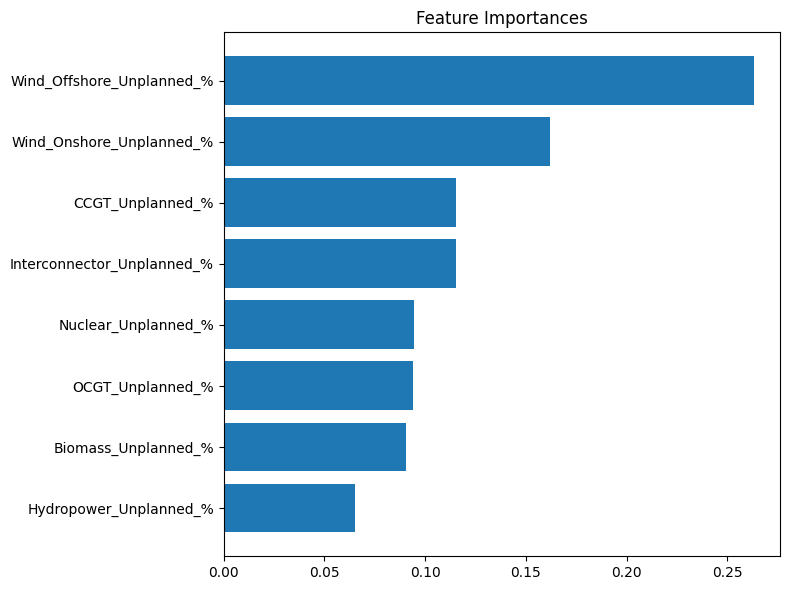

In [53]:
model_fuel_unplanned_data_6, features_fuel_unplanned_data_6, imp_fuel_unplanned_data_6 = run_feature_importance_model(fuel_data_unplanned)

[I 2025-08-04 12:28:46,576] A new study created in memory with name: no-name-92d289f9-7ade-4722-9d83-d903fb0690a1



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:28:47,969] Trial 0 finished with value: -47.158268441405546 and parameters: {'n_estimators': 800, 'max_depth': 9, 'learning_rate': 0.0010208170737773313, 'subsample': 0.8278328149991973, 'colsample_bytree': 0.549739228760649, 'reg_alpha': 8.455129153517859e-05, 'reg_lambda': 0.0027593428652979025}. Best is trial 0 with value: -47.158268441405546.
[I 2025-08-04 12:28:48,429] Trial 1 finished with value: -38.80557999386611 and parameters: {'n_estimators': 600, 'max_depth': 6, 'learning_rate': 0.04010537360285611, 'subsample': 0.6612328950036002, 'colsample_bytree': 0.8236313818299663, 'reg_alpha': 0.0003901639482461726, 'reg_lambda': 0.19958315381295463}. Best is trial 1 with value: -38.80557999386611.
[I 2025-08-04 12:28:48,481] Trial 2 finished with value: -53.959674040757285 and parameters: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.0013147054378471646, 'subsample': 0.6854941465666702, 'colsample_bytree': 0.6540740482623257, 'reg_alpha': 1.91860974834804


[Tuning complete] Best parameters:
{'n_estimators': 300, 'max_depth': 11, 'learning_rate': 0.5056947983732097, 'subsample': 0.9997681426214259, 'colsample_bytree': 0.9691339712718468, 'reg_alpha': 0.0003138140782204876, 'reg_lambda': 0.0007969855067978928}

[Result] Train RMSE = 31.794, MAE = 19.442, R² = 0.663



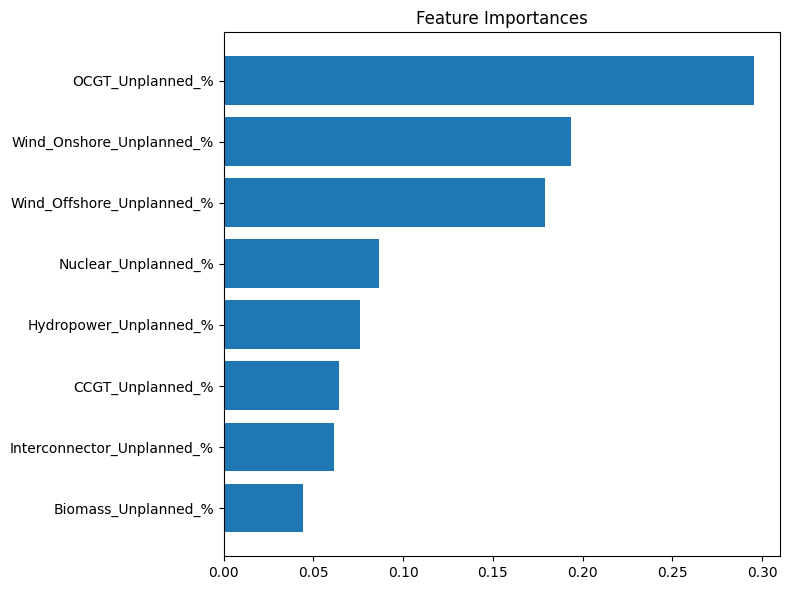

In [54]:
model_fuel_unplanned_data_7, features_fuel_unplanned_data_7, imp_fuel_unplanned_data_7 = run_feature_importance_model(fuel_data_unplanned)

[I 2025-08-04 12:31:04,056] A new study created in memory with name: no-name-b9f54015-1902-4c25-9fa3-03acc7bff716



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:31:04,801] Trial 0 finished with value: -34.005624512842864 and parameters: {'n_estimators': 1000, 'max_depth': 6, 'learning_rate': 0.17203471326177394, 'subsample': 0.7106546325194023, 'colsample_bytree': 0.7912671771249304, 'reg_alpha': 5.986331732927633e-05, 'reg_lambda': 5.4407992939660706e-05}. Best is trial 0 with value: -34.005624512842864.
[I 2025-08-04 12:31:05,000] Trial 1 finished with value: -44.8738124224134 and parameters: {'n_estimators': 100, 'max_depth': 9, 'learning_rate': 0.01006867304862361, 'subsample': 0.5735318042312759, 'colsample_bytree': 0.917559126304543, 'reg_alpha': 0.002747165273407579, 'reg_lambda': 0.0004914479578312136}. Best is trial 0 with value: -34.005624512842864.
[I 2025-08-04 12:31:05,313] Trial 2 finished with value: -46.52853614529091 and parameters: {'n_estimators': 500, 'max_depth': 5, 'learning_rate': 0.006254041888532851, 'subsample': 0.7891298126459365, 'colsample_bytree': 0.8300430512942554, 'reg_alpha': 0.001123261940429


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 10, 'learning_rate': 0.9674314021672781, 'subsample': 0.9999928607858481, 'colsample_bytree': 0.575134014942341, 'reg_alpha': 0.01278973492479871, 'reg_lambda': 0.00019720973383226536}

[Result] Train RMSE = 31.794, MAE = 19.428, R² = 0.663



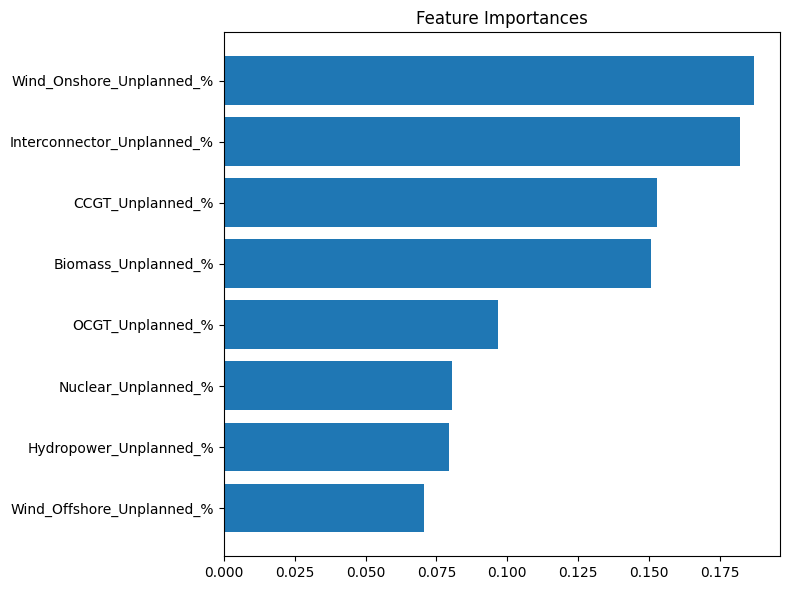

In [55]:
model_fuel_unplanned_data_8, features_fuel_unplanned_data_8, imp_fuel_unplanned_data_8 = run_feature_importance_model(fuel_data_unplanned)

[I 2025-08-04 12:34:47,470] A new study created in memory with name: no-name-979dd75c-98c0-41d3-b6ee-ceea4958a40c



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:34:47,854] Trial 0 finished with value: -48.99421367956549 and parameters: {'n_estimators': 400, 'max_depth': 6, 'learning_rate': 0.002150103502228584, 'subsample': 0.7449068570238724, 'colsample_bytree': 0.6618601522975545, 'reg_alpha': 0.24848398443964104, 'reg_lambda': 0.07212192075998984}. Best is trial 0 with value: -48.99421367956549.
[I 2025-08-04 12:34:48,149] Trial 1 finished with value: -41.875494505570856 and parameters: {'n_estimators': 700, 'max_depth': 3, 'learning_rate': 0.1705439116930716, 'subsample': 0.5504087395512772, 'colsample_bytree': 0.6723282452995127, 'reg_alpha': 0.10222136506109583, 'reg_lambda': 0.00012752755857413906}. Best is trial 1 with value: -41.875494505570856.
[I 2025-08-04 12:34:50,084] Trial 2 finished with value: -33.174717183885235 and parameters: {'n_estimators': 900, 'max_depth': 10, 'learning_rate': 0.025213409975504496, 'subsample': 0.8825558912829614, 'colsample_bytree': 0.8209490911088609, 'reg_alpha': 0.008684976812136258


[Tuning complete] Best parameters:
{'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.4721346499965208, 'subsample': 0.9997662544909189, 'colsample_bytree': 0.8533039463926173, 'reg_alpha': 1.504126797645879, 'reg_lambda': 1.1802834702424253e-05}

[Result] Train RMSE = 31.795, MAE = 19.482, R² = 0.663



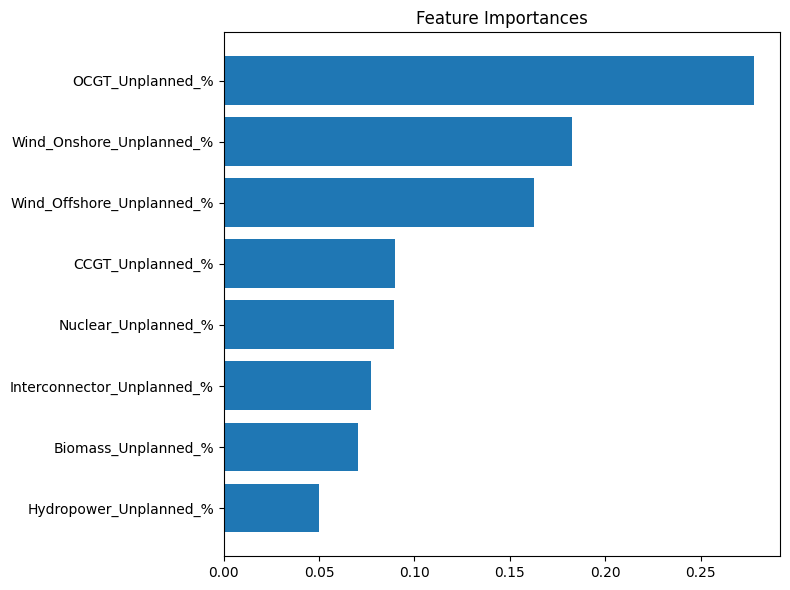

In [56]:
model_fuel_unplanned_data_9, features_fuel_unplanned_data_9, imp_fuel_unplanned_data_9 = run_feature_importance_model(fuel_data_unplanned)

[I 2025-08-04 12:37:58,993] A new study created in memory with name: no-name-01b88312-7798-4530-9b11-26244365589c



Starting hyperparameter search (100 trials)...



[I 2025-08-04 12:38:03,620] Trial 0 finished with value: -38.60481486475906 and parameters: {'n_estimators': 900, 'max_depth': 12, 'learning_rate': 0.0024698105678551212, 'subsample': 0.6515726187620857, 'colsample_bytree': 0.888163850889516, 'reg_alpha': 2.016605729001382e-05, 'reg_lambda': 2.6324429098444955}. Best is trial 0 with value: -38.60481486475906.
[I 2025-08-04 12:38:04,040] Trial 1 finished with value: -39.379973523668255 and parameters: {'n_estimators': 700, 'max_depth': 5, 'learning_rate': 0.07617852277455225, 'subsample': 0.6781134888197851, 'colsample_bytree': 0.7478485573676855, 'reg_alpha': 0.00038806039401091365, 'reg_lambda': 5.85828204685842}. Best is trial 0 with value: -38.60481486475906.
[I 2025-08-04 12:38:04,171] Trial 2 finished with value: -46.495461093022236 and parameters: {'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.04737574924783954, 'subsample': 0.5118513668309175, 'colsample_bytree': 0.8483239952984121, 'reg_alpha': 0.09889542088040004, 'r


[Tuning complete] Best parameters:
{'n_estimators': 500, 'max_depth': 10, 'learning_rate': 0.4785356575464644, 'subsample': 0.9999322019295581, 'colsample_bytree': 0.8573304951722267, 'reg_alpha': 2.1031121064734114e-05, 'reg_lambda': 9.252957173242085e-05}

[Result] Train RMSE = 31.794, MAE = 19.440, R² = 0.663



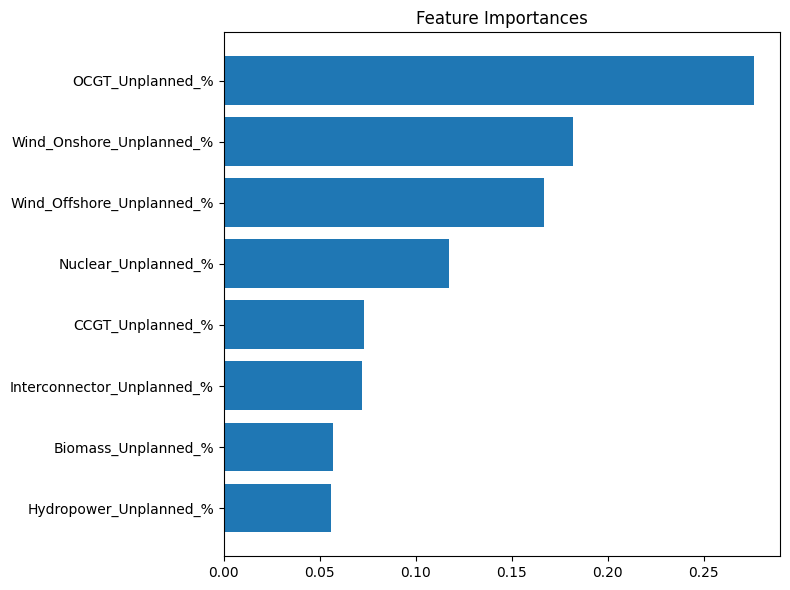

In [57]:
model_fuel_unplanned_data_10, features_fuel_unplanned_data_10, imp_fuel_unplanned_data_10 = run_feature_importance_model(fuel_data_unplanned)

In [ ]:
# Save all 10 models 
# List of models
models = [
    model_fuel_unplanned_data_1,
    model_fuel_unplanned_data_2,
    model_fuel_unplanned_data_3,
    model_fuel_unplanned_data_4,
    model_fuel_unplanned_data_5,
    model_fuel_unplanned_data_6,
    model_fuel_unplanned_data_7,
    model_fuel_unplanned_data_8,
    model_fuel_unplanned_data_9,
    model_fuel_unplanned_data_10
]

# Save each model
for i, model in enumerate(models, start=1):
    filename = f"model_fuel_unplanned_data_{i}.joblib"
    joblib.dump(model, filename)
    print(f"Saved: {filename}")

Saved: model_fuel_unplanned_data_1.joblib
Saved: model_fuel_unplanned_data_2.joblib
Saved: model_fuel_unplanned_data_3.joblib
Saved: model_fuel_unplanned_data_4.joblib
Saved: model_fuel_unplanned_data_5.joblib
Saved: model_fuel_unplanned_data_6.joblib
Saved: model_fuel_unplanned_data_7.joblib
Saved: model_fuel_unplanned_data_8.joblib
Saved: model_fuel_unplanned_data_9.joblib
Saved: model_fuel_unplanned_data_10.joblib


In [ ]:
# Load all 10 models into a list
models = []

for i in range(1, 11):
    filename = f"model_fuel_unplanned_data_{i}.joblib"
    model = joblib.load(filename)
    models.append(model)
    print(f"Loaded: {filename}")

Loaded: model_fuel_unplanned_data_1.joblib
Loaded: model_fuel_unplanned_data_2.joblib
Loaded: model_fuel_unplanned_data_3.joblib
Loaded: model_fuel_unplanned_data_4.joblib
Loaded: model_fuel_unplanned_data_5.joblib
Loaded: model_fuel_unplanned_data_6.joblib
Loaded: model_fuel_unplanned_data_7.joblib
Loaded: model_fuel_unplanned_data_8.joblib
Loaded: model_fuel_unplanned_data_9.joblib
Loaded: model_fuel_unplanned_data_10.joblib


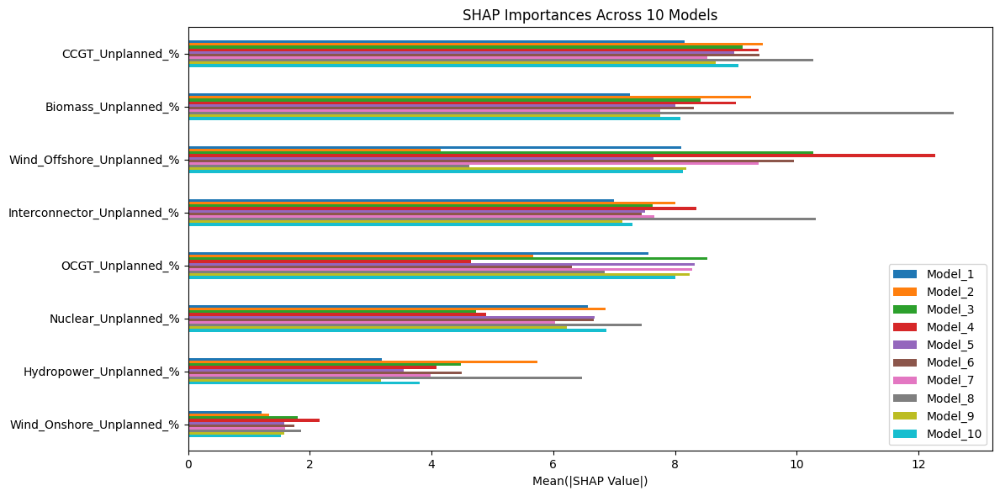

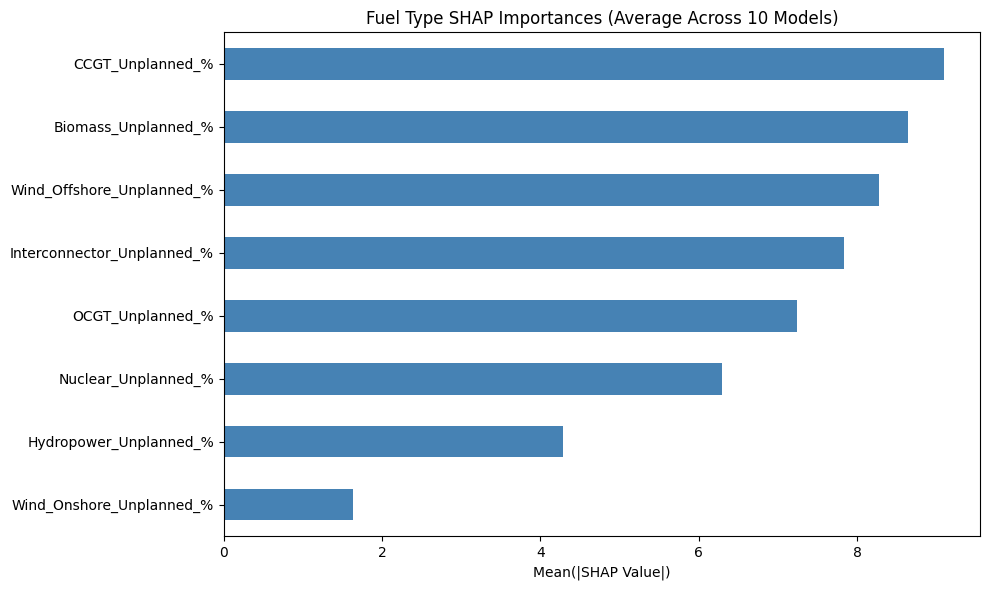

In [ ]:
# Use the same dataset for all models
shap_data = fuel_data_unplanned.drop(columns=['StartTime', 'SystemPrice'])

# List of 10 models
models = [
    model_fuel_unplanned_data_1,
    model_fuel_unplanned_data_2,
    model_fuel_unplanned_data_3,
    model_fuel_unplanned_data_4,
    model_fuel_unplanned_data_5,
    model_fuel_unplanned_data_6,
    model_fuel_unplanned_data_7,
    model_fuel_unplanned_data_8,
    model_fuel_unplanned_data_9,
    model_fuel_unplanned_data_10
]

# Compute SHAP values and global importances for each model
shap_importances = []
for i, model in enumerate(models, start=1):
    shap_values, X_sampled = compute_shap_values(model, shap_data, sample_size=1000)
    shap_imp = get_global_shap_importance(shap_values, X_sampled)
    shap_importances.append(shap_imp.rename(f"Model_{i}"))

# Combine importances into a single DataFrame
shap_compare = pd.concat(shap_importances, axis=1)

# Compute average and standard deviation
shap_compare["Mean"] = shap_compare.mean(axis=1)
shap_compare["StdDev"] = shap_compare.std(axis=1)
shap_compare = shap_compare.sort_values(by="Mean", ascending=False)

# Plot SHAP importances for all 10 models
shap_compare.iloc[:, :10].plot(
    kind='barh',
    figsize=(12, max(6, len(shap_compare) * 0.3)),
    title='SHAP Importances Across 10 Models'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

# Plot average SHAP importance across models
shap_compare["Mean"].plot(
    kind='barh',
    figsize=(10, max(6, len(shap_compare) * 0.3)),
    title='Fuel Type SHAP Importances (Average Across 10 Models)',
    color='steelblue'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

## Individual Generator Feature Analysis (Planned + Unplanned)

[I 2025-08-03 13:19:58,210] A new study created in memory with name: no-name-58879208-4bf4-4844-aedb-d3697022ed56



Starting hyperparameter search (100 trials)...



[I 2025-08-03 13:20:03,533] Trial 0 finished with value: -28.28552812019792 and parameters: {'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.05325900103329257, 'subsample': 0.67829705241928, 'colsample_bytree': 0.8285382676623192, 'reg_alpha': 1.815091460562866, 'reg_lambda': 0.00018344611367580575}. Best is trial 0 with value: -28.28552812019792.
[I 2025-08-03 13:20:04,350] Trial 1 finished with value: -31.186381274829607 and parameters: {'n_estimators': 100, 'max_depth': 9, 'learning_rate': 0.2840027688147968, 'subsample': 0.6653177984810594, 'colsample_bytree': 0.9200378696466852, 'reg_alpha': 0.08648599171520627, 'reg_lambda': 0.032233113550785016}. Best is trial 0 with value: -28.28552812019792.
[I 2025-08-03 13:20:05,771] Trial 2 finished with value: -43.74436079760324 and parameters: {'n_estimators': 400, 'max_depth': 3, 'learning_rate': 0.039217409177694014, 'subsample': 0.6615668560467133, 'colsample_bytree': 0.520639175543427, 'reg_alpha': 0.009159525155645207, 'reg_


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.6481900346892284, 'subsample': 0.9997219768376857, 'colsample_bytree': 0.9544599481146891, 'reg_alpha': 0.11646405276514642, 'reg_lambda': 0.006889752673553471}

[Result] Train RMSE = 26.005, MAE = 13.690, R² = 0.774



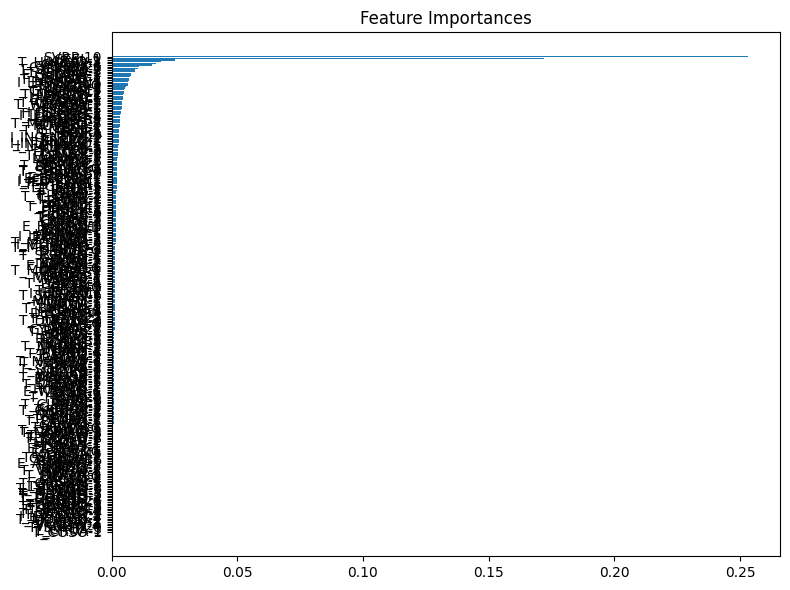

In [95]:
model_individual_generator_data_1, features_individual_generator_data_1, imp_individual_generator_data_1 = run_feature_importance_model(individual_unit_capacity)

[I 2025-08-03 13:29:52,376] A new study created in memory with name: no-name-539ea7c9-bfe0-4a1d-8fcc-6b9668a7f70f



Starting hyperparameter search (100 trials)...



[I 2025-08-03 13:29:55,549] Trial 0 finished with value: -35.430141098704375 and parameters: {'n_estimators': 600, 'max_depth': 8, 'learning_rate': 0.030513116286870326, 'subsample': 0.727806013739807, 'colsample_bytree': 0.5021323500506378, 'reg_alpha': 0.0012376773405358857, 'reg_lambda': 8.0062906734853}. Best is trial 0 with value: -35.430141098704375.
[I 2025-08-03 13:29:58,556] Trial 1 finished with value: -42.830251649140784 and parameters: {'n_estimators': 800, 'max_depth': 5, 'learning_rate': 0.0057057291505663845, 'subsample': 0.8581781870117565, 'colsample_bytree': 0.6914370331012694, 'reg_alpha': 0.0033967699306598183, 'reg_lambda': 5.0245341348090396e-05}. Best is trial 0 with value: -35.430141098704375.
[I 2025-08-03 13:30:00,741] Trial 2 finished with value: -49.11799855602082 and parameters: {'n_estimators': 700, 'max_depth': 3, 'learning_rate': 0.0019144625263931103, 'subsample': 0.6296517665597807, 'colsample_bytree': 0.6653177773037915, 'reg_alpha': 7.344480638212742


[Tuning complete] Best parameters:
{'n_estimators': 300, 'max_depth': 12, 'learning_rate': 0.45586577634865433, 'subsample': 0.9997619582966988, 'colsample_bytree': 0.9909414349297903, 'reg_alpha': 0.04473462890002732, 'reg_lambda': 1.3227823876374408e-05}

[Result] Train RMSE = 26.015, MAE = 13.830, R² = 0.774



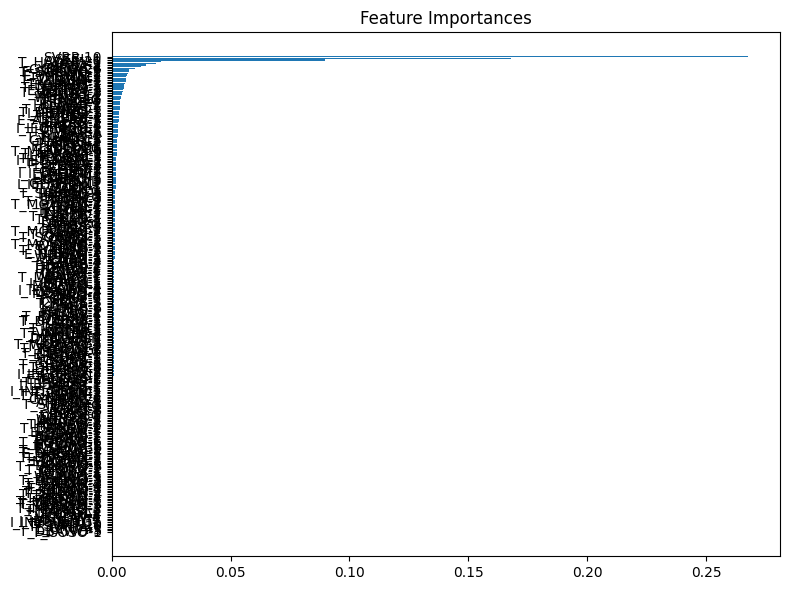

In [96]:
model_individual_generator_data_2, features_individual_generator_data_2, imp_individual_generator_data_2 = run_feature_importance_model(individual_unit_capacity)

[I 2025-08-03 13:37:22,446] A new study created in memory with name: no-name-e1568c9a-ee83-40bb-a3ed-736af3454389



Starting hyperparameter search (100 trials)...



[I 2025-08-03 13:37:29,723] Trial 0 finished with value: -27.00487304856436 and parameters: {'n_estimators': 800, 'max_depth': 12, 'learning_rate': 0.4158131576635018, 'subsample': 0.6071419134396836, 'colsample_bytree': 0.5764552067238141, 'reg_alpha': 4.243612537451695, 'reg_lambda': 5.27776787732896e-05}. Best is trial 0 with value: -27.00487304856436.
[I 2025-08-03 13:37:46,938] Trial 1 finished with value: -39.90267174624998 and parameters: {'n_estimators': 1000, 'max_depth': 11, 'learning_rate': 0.0011111027129121639, 'subsample': 0.7155853882568391, 'colsample_bytree': 0.9839192816176627, 'reg_alpha': 0.00011087746679232847, 'reg_lambda': 0.0010654284449940314}. Best is trial 0 with value: -27.00487304856436.
[I 2025-08-03 13:37:50,672] Trial 2 finished with value: -28.840621675384874 and parameters: {'n_estimators': 300, 'max_depth': 12, 'learning_rate': 0.05774382791818148, 'subsample': 0.772079938848472, 'colsample_bytree': 0.5837990546188916, 'reg_alpha': 0.00570047880933974


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.5501394535237593, 'subsample': 0.9999859485369593, 'colsample_bytree': 0.9210097655852046, 'reg_alpha': 0.001348621216827602, 'reg_lambda': 1.7839405098267136e-05}

[Result] Train RMSE = 26.003, MAE = 13.637, R² = 0.774



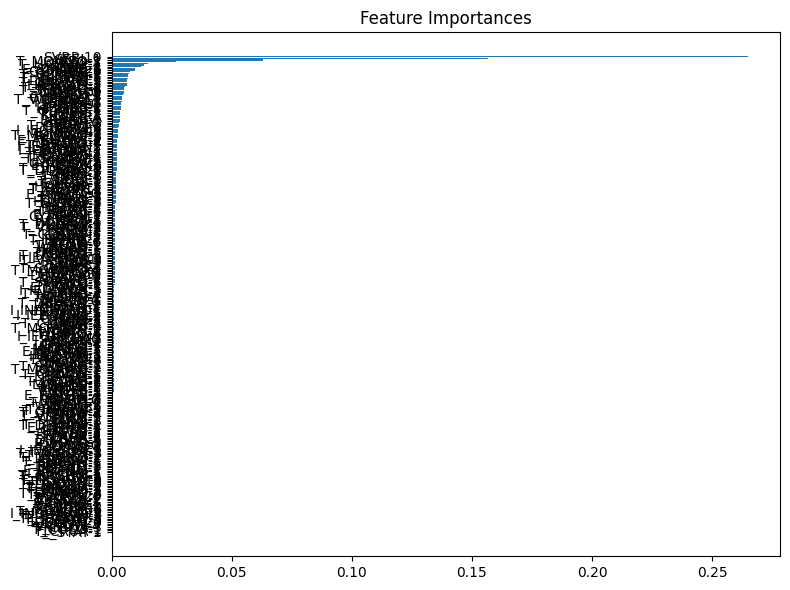

In [97]:
model_individual_generator_data_3, features_individual_generator_data_3, imp_individual_generator_data_3 = run_feature_importance_model(individual_unit_capacity)

[I 2025-08-03 13:47:20,208] A new study created in memory with name: no-name-878864d9-506f-48fd-844f-c1dbd5d648d7



Starting hyperparameter search (100 trials)...



[I 2025-08-03 13:47:22,560] Trial 0 finished with value: -26.89148404514554 and parameters: {'n_estimators': 300, 'max_depth': 9, 'learning_rate': 0.47877110776078585, 'subsample': 0.9891155564414922, 'colsample_bytree': 0.8080262209985125, 'reg_alpha': 6.269316444552949, 'reg_lambda': 0.17449668568455834}. Best is trial 0 with value: -26.89148404514554.
[I 2025-08-03 13:47:26,943] Trial 1 finished with value: -29.880331668383846 and parameters: {'n_estimators': 900, 'max_depth': 7, 'learning_rate': 0.14902578884395523, 'subsample': 0.5896454884955125, 'colsample_bytree': 0.8108828141879866, 'reg_alpha': 0.000778713257124125, 'reg_lambda': 0.05628976624804659}. Best is trial 0 with value: -26.89148404514554.
[I 2025-08-03 13:47:28,117] Trial 2 finished with value: -35.21871881162783 and parameters: {'n_estimators': 300, 'max_depth': 5, 'learning_rate': 0.27962248825978203, 'subsample': 0.5467994337190566, 'colsample_bytree': 0.6901399358148269, 'reg_alpha': 0.0017629056343690184, 'reg_


[Tuning complete] Best parameters:
{'n_estimators': 500, 'max_depth': 11, 'learning_rate': 0.6423503989650857, 'subsample': 0.9998758045188554, 'colsample_bytree': 0.6157968258866479, 'reg_alpha': 0.16456223864716635, 'reg_lambda': 0.40746579420503937}

[Result] Train RMSE = 26.010, MAE = 13.799, R² = 0.774



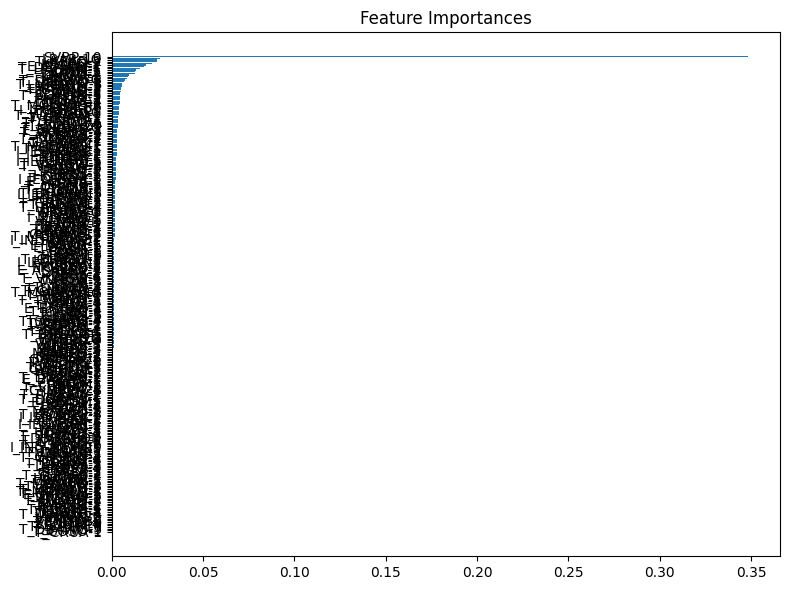

In [98]:
model_individual_generator_data_4, features_individual_generator_data_4, imp_individual_generator_data_4 = run_feature_importance_model(individual_unit_capacity)

[I 2025-08-03 13:58:14,315] A new study created in memory with name: no-name-004ed774-1b20-4723-9c8c-93f77c8e2a29



Starting hyperparameter search (100 trials)...



[I 2025-08-03 13:58:16,725] Trial 0 finished with value: -31.45031861245925 and parameters: {'n_estimators': 500, 'max_depth': 6, 'learning_rate': 0.21821954604682675, 'subsample': 0.8036795559065991, 'colsample_bytree': 0.7217127876015066, 'reg_alpha': 0.9077199723052021, 'reg_lambda': 1.469080740377791e-05}. Best is trial 0 with value: -31.45031861245925.
[I 2025-08-03 13:58:20,919] Trial 1 finished with value: -41.57262647475446 and parameters: {'n_estimators': 700, 'max_depth': 6, 'learning_rate': 0.0055943840015795585, 'subsample': 0.6885310439620574, 'colsample_bytree': 0.7228615039732302, 'reg_alpha': 0.00018934154515495532, 'reg_lambda': 0.14693175997245045}. Best is trial 0 with value: -31.45031861245925.
[I 2025-08-03 13:58:24,434] Trial 2 finished with value: -33.70907154522689 and parameters: {'n_estimators': 800, 'max_depth': 5, 'learning_rate': 0.8967776015946555, 'subsample': 0.5325104228224055, 'colsample_bytree': 0.5395499141475265, 'reg_alpha': 0.0007076688746816272, 


[Tuning complete] Best parameters:
{'n_estimators': 500, 'max_depth': 12, 'learning_rate': 0.8652086968025846, 'subsample': 0.9994596751135796, 'colsample_bytree': 0.6356166152349916, 'reg_alpha': 5.883116265354247e-05, 'reg_lambda': 1.1772470039348886}

[Result] Train RMSE = 26.009, MAE = 13.746, R² = 0.774



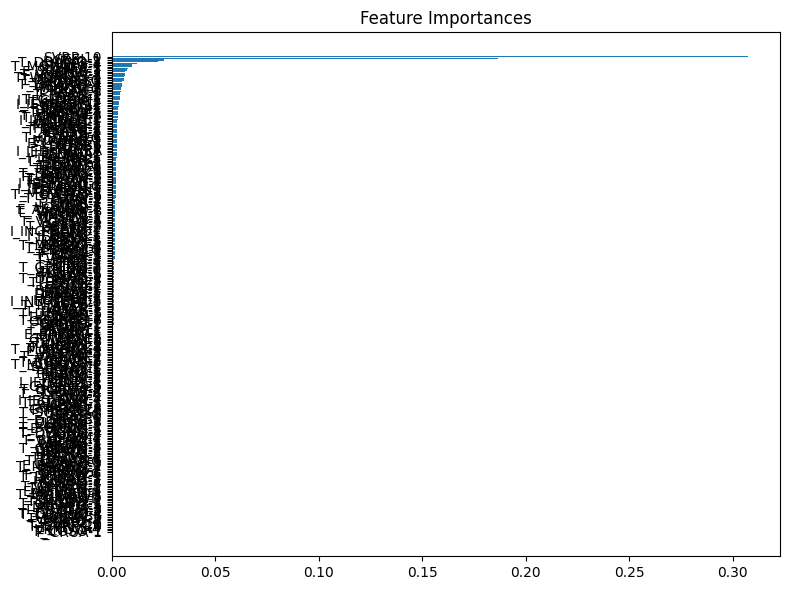

In [99]:
model_individual_generator_data_5, features_individual_generator_data_5, imp_individual_generator_data_5 = run_feature_importance_model(individual_unit_capacity)

[I 2025-08-03 14:07:07,524] A new study created in memory with name: no-name-434e77db-cf02-497e-b60f-db028ed0866d



Starting hyperparameter search (100 trials)...



[I 2025-08-03 14:07:09,807] Trial 0 finished with value: -28.910552599434894 and parameters: {'n_estimators': 300, 'max_depth': 10, 'learning_rate': 0.7057748922517855, 'subsample': 0.6557586127009165, 'colsample_bytree': 0.9456489030723593, 'reg_alpha': 1.8751050328890615e-05, 'reg_lambda': 5.696570093260101e-05}. Best is trial 0 with value: -28.910552599434894.
[I 2025-08-03 14:07:12,413] Trial 1 finished with value: -30.126132597489182 and parameters: {'n_estimators': 700, 'max_depth': 6, 'learning_rate': 0.39717886868422736, 'subsample': 0.6574101001938606, 'colsample_bytree': 0.9443825104401997, 'reg_alpha': 0.0028293222541675494, 'reg_lambda': 0.000689114948446981}. Best is trial 0 with value: -28.910552599434894.
[I 2025-08-03 14:07:16,699] Trial 2 finished with value: -40.90147453252954 and parameters: {'n_estimators': 300, 'max_depth': 11, 'learning_rate': 0.004457479033426302, 'subsample': 0.8897806408012483, 'colsample_bytree': 0.6807100925545935, 'reg_alpha': 4.839689897457


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 12, 'learning_rate': 0.9978878892247556, 'subsample': 0.9990763329208459, 'colsample_bytree': 0.6291139622322183, 'reg_alpha': 0.07307830930741788, 'reg_lambda': 0.001375832852600848}

[Result] Train RMSE = 26.006, MAE = 13.684, R² = 0.774



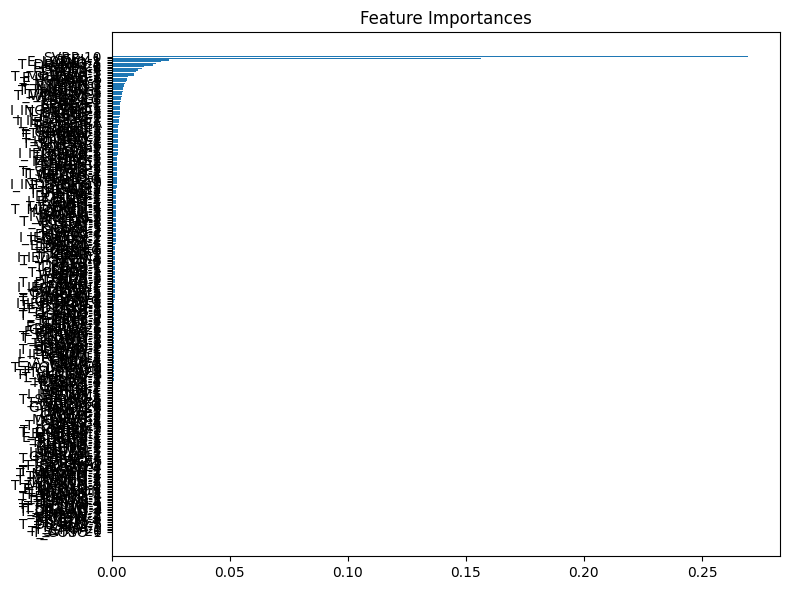

In [100]:
model_individual_generator_data_6, features_individual_generator_data_6, imp_individual_generator_data_6 = run_feature_importance_model(individual_unit_capacity)

[I 2025-08-03 14:17:02,717] A new study created in memory with name: no-name-caf1703b-6e84-48ea-9537-73106e50f304



Starting hyperparameter search (100 trials)...



[I 2025-08-03 14:17:04,024] Trial 0 finished with value: -51.58168334218265 and parameters: {'n_estimators': 300, 'max_depth': 5, 'learning_rate': 0.0010860898357720312, 'subsample': 0.8940747628358034, 'colsample_bytree': 0.740671456034429, 'reg_alpha': 0.0010905359146097583, 'reg_lambda': 9.507803357864976}. Best is trial 0 with value: -51.58168334218265.
[I 2025-08-03 14:17:04,604] Trial 1 finished with value: -51.99893924209904 and parameters: {'n_estimators': 100, 'max_depth': 6, 'learning_rate': 0.002177945470104621, 'subsample': 0.9772990445880313, 'colsample_bytree': 0.5119431882914491, 'reg_alpha': 0.008884319340228763, 'reg_lambda': 0.0002945370870811333}. Best is trial 0 with value: -51.58168334218265.
[I 2025-08-03 14:17:07,535] Trial 2 finished with value: -35.54387041232705 and parameters: {'n_estimators': 900, 'max_depth': 5, 'learning_rate': 0.06548009864860582, 'subsample': 0.6403152534651397, 'colsample_bytree': 0.911116483084008, 'reg_alpha': 9.184649760251962e-05, '


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 11, 'learning_rate': 0.39255349636886905, 'subsample': 0.9998928668137563, 'colsample_bytree': 0.7718820729056346, 'reg_alpha': 8.401009476042419e-05, 'reg_lambda': 2.533018886002105e-05}

[Result] Train RMSE = 26.004, MAE = 13.682, R² = 0.774



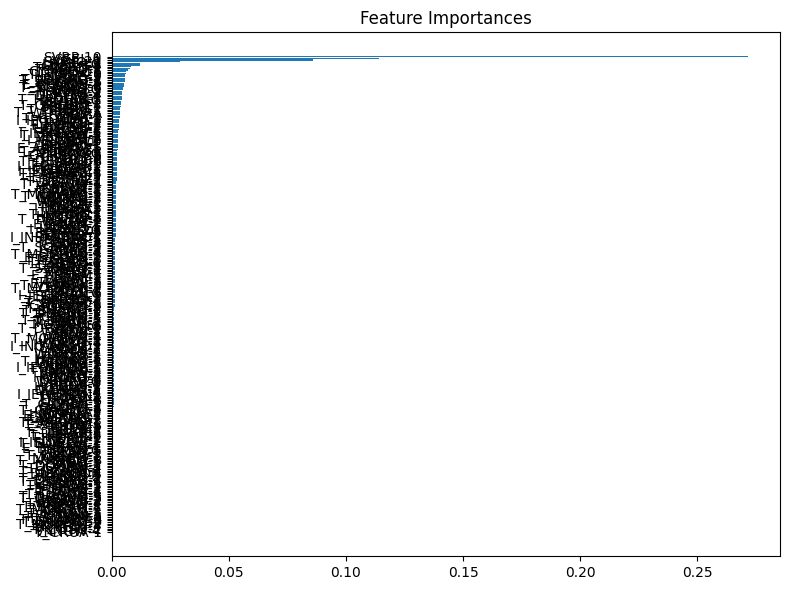

In [101]:
model_individual_generator_data_7, features_individual_generator_data_7, imp_individual_generator_data_7 = run_feature_importance_model(individual_unit_capacity)

[I 2025-08-03 14:28:15,731] A new study created in memory with name: no-name-189c8496-01e9-4d91-880d-aedd9f203603



Starting hyperparameter search (100 trials)...



[I 2025-08-03 14:28:16,671] Trial 0 finished with value: -37.79168770519814 and parameters: {'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.36329214254281844, 'subsample': 0.7614308639004407, 'colsample_bytree': 0.9493176992247129, 'reg_alpha': 7.104411348521572e-05, 'reg_lambda': 3.158724563607559}. Best is trial 0 with value: -37.79168770519814.
[I 2025-08-03 14:28:20,671] Trial 1 finished with value: -36.024985302636594 and parameters: {'n_estimators': 700, 'max_depth': 4, 'learning_rate': 0.14692327551801054, 'subsample': 0.9579205947113583, 'colsample_bytree': 0.851664766967981, 'reg_alpha': 0.5349360562051685, 'reg_lambda': 0.0004494545433909271}. Best is trial 1 with value: -36.024985302636594.
[I 2025-08-03 14:28:22,479] Trial 2 finished with value: -29.568548773532765 and parameters: {'n_estimators': 200, 'max_depth': 9, 'learning_rate': 0.44775109545291303, 'subsample': 0.5613987984041664, 'colsample_bytree': 0.7764378780379235, 'reg_alpha': 0.27089819781379565, 'reg


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 12, 'learning_rate': 0.9335264580867905, 'subsample': 0.9998580555707539, 'colsample_bytree': 0.6880990351556807, 'reg_alpha': 0.005432227306640851, 'reg_lambda': 0.28044403692309544}

[Result] Train RMSE = 26.003, MAE = 13.636, R² = 0.774



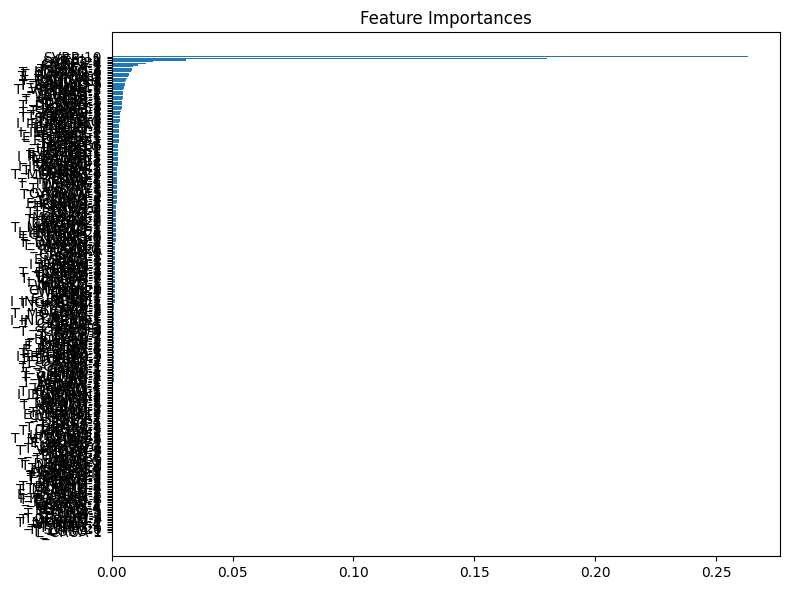

In [102]:
model_individual_generator_data_8, features_individual_generator_data_8, imp_individual_generator_data_8 = run_feature_importance_model(individual_unit_capacity)

[I 2025-08-03 14:42:12,548] A new study created in memory with name: no-name-69bc8143-1ff6-4278-bee3-06926879d730



Starting hyperparameter search (100 trials)...



[I 2025-08-03 14:42:17,716] Trial 0 finished with value: -36.35279636243962 and parameters: {'n_estimators': 600, 'max_depth': 9, 'learning_rate': 0.01309049631328087, 'subsample': 0.6429229528930296, 'colsample_bytree': 0.5333784739187548, 'reg_alpha': 8.652012102388473e-05, 'reg_lambda': 5.235153747488992}. Best is trial 0 with value: -36.35279636243962.
[I 2025-08-03 14:42:28,022] Trial 1 finished with value: -27.3413561798905 and parameters: {'n_estimators': 1000, 'max_depth': 11, 'learning_rate': 0.07327618303268627, 'subsample': 0.6219942013737907, 'colsample_bytree': 0.8840106335400613, 'reg_alpha': 0.28374636965266425, 'reg_lambda': 0.051770221869560956}. Best is trial 1 with value: -27.3413561798905.
[I 2025-08-03 14:42:37,452] Trial 2 finished with value: -32.56956607396016 and parameters: {'n_estimators': 500, 'max_depth': 12, 'learning_rate': 0.008478117279260787, 'subsample': 0.5605562593012143, 'colsample_bytree': 0.649846762811586, 'reg_alpha': 2.4559080140167475e-05, 'r


[Tuning complete] Best parameters:
{'n_estimators': 800, 'max_depth': 12, 'learning_rate': 0.274546705468488, 'subsample': 0.9998460230927616, 'colsample_bytree': 0.634257946496189, 'reg_alpha': 0.03940212249827996, 'reg_lambda': 0.04184014283755066}

[Result] Train RMSE = 26.011, MAE = 13.797, R² = 0.774



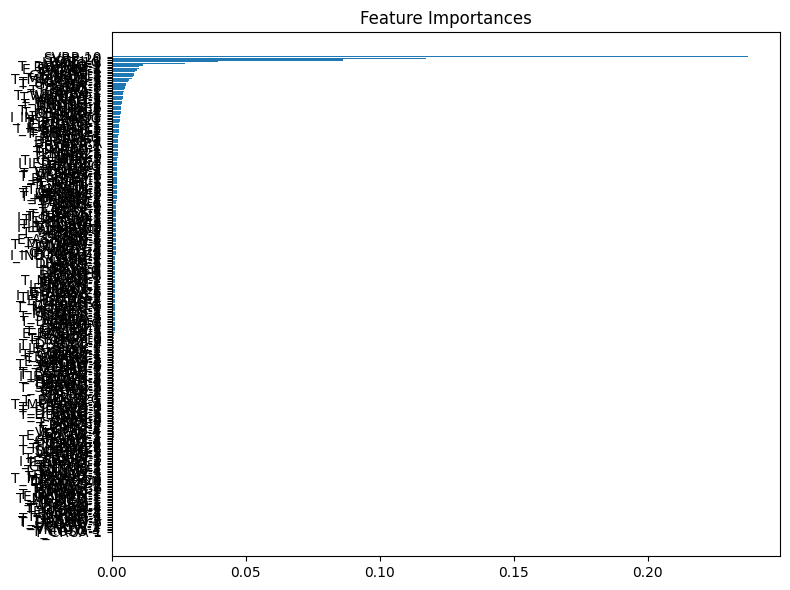

In [103]:
model_individual_generator_data_9, features_individual_generator_data_9, imp_individual_generator_data_9 = run_feature_importance_model(individual_unit_capacity)

[I 2025-08-03 14:52:54,334] A new study created in memory with name: no-name-4d76c62d-1248-4205-b962-b25fe9a57d97



Starting hyperparameter search (100 trials)...



[I 2025-08-03 14:52:58,992] Trial 0 finished with value: -34.685753501591414 and parameters: {'n_estimators': 1000, 'max_depth': 7, 'learning_rate': 0.022637711139496076, 'subsample': 0.6216044133430043, 'colsample_bytree': 0.7250344513191648, 'reg_alpha': 2.5888731805015956e-05, 'reg_lambda': 2.900154940700404e-05}. Best is trial 0 with value: -34.685753501591414.
[I 2025-08-03 14:52:59,658] Trial 1 finished with value: -42.69353471813557 and parameters: {'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.14746271757780646, 'subsample': 0.7211422534149222, 'colsample_bytree': 0.5180208040795287, 'reg_alpha': 0.03429961262243128, 'reg_lambda': 5.286927101201077}. Best is trial 0 with value: -34.685753501591414.
[I 2025-08-03 14:53:01,965] Trial 2 finished with value: -45.18216178062851 and parameters: {'n_estimators': 700, 'max_depth': 4, 'learning_rate': 0.005170492365337884, 'subsample': 0.5067235139778725, 'colsample_bytree': 0.5767833799686645, 'reg_alpha': 2.6579081263084547,


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.6287816948083662, 'subsample': 0.9981506786225656, 'colsample_bytree': 0.7006003276632954, 'reg_alpha': 0.3840170084229573, 'reg_lambda': 0.0006350716950336269}

[Result] Train RMSE = 26.036, MAE = 13.919, R² = 0.774



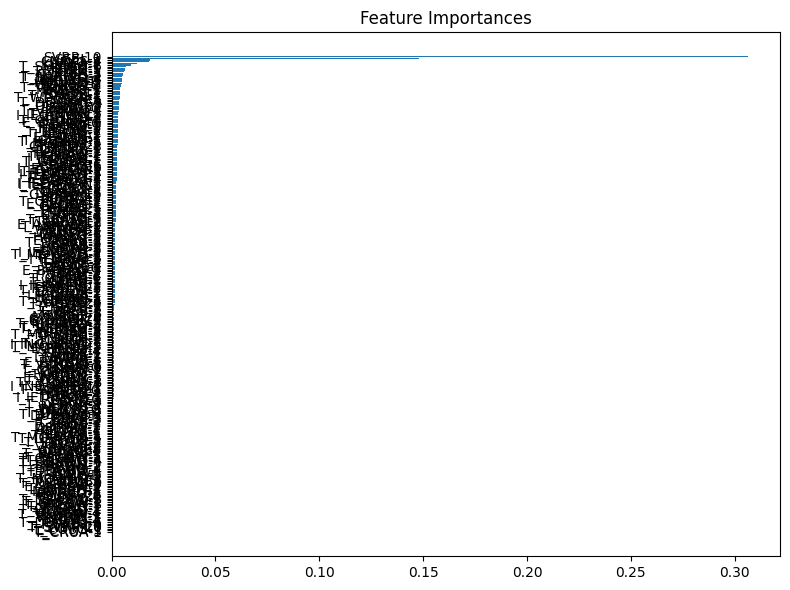

In [104]:
model_individual_generator_data_10, features_individual_generator_data_10, imp_individual_generator_data_10 = run_feature_importance_model(individual_unit_capacity)

In [ ]:
# Save all 10 models 
# List of models
models = [
    model_individual_generator_data_1,
    model_individual_generator_data_2,
    model_individual_generator_data_3,
    model_individual_generator_data_4,
    model_individual_generator_data_5,
    model_individual_generator_data_6,
    model_individual_generator_data_7,
    model_individual_generator_data_8,
    model_individual_generator_data_9,
    model_individual_generator_data_10
]

# Save each model
for i, model in enumerate(models, start=1):
    filename = f"model_individual_generator_data_{i}.joblib"
    joblib.dump(model, filename)
    print(f"Saved: {filename}")

In [ ]:
# Load all 10 models into a list
models = []

for i in range(1, 11):
    filename = f"model_individual_generator_data_{i}.joblib"
    model = joblib.load(filename)
    models.append(model)
    print(f"Loaded: {filename}")

Loaded: model_individual_generator_data_1.joblib
Loaded: model_individual_generator_data_2.joblib
Loaded: model_individual_generator_data_3.joblib
Loaded: model_individual_generator_data_4.joblib
Loaded: model_individual_generator_data_5.joblib
Loaded: model_individual_generator_data_6.joblib
Loaded: model_individual_generator_data_7.joblib
Loaded: model_individual_generator_data_8.joblib
Loaded: model_individual_generator_data_9.joblib
Loaded: model_individual_generator_data_10.joblib


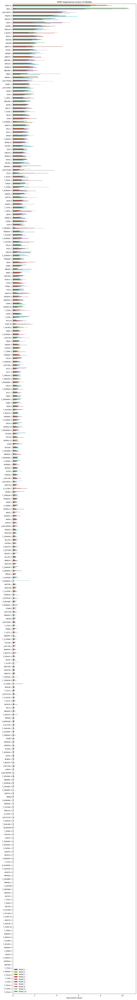

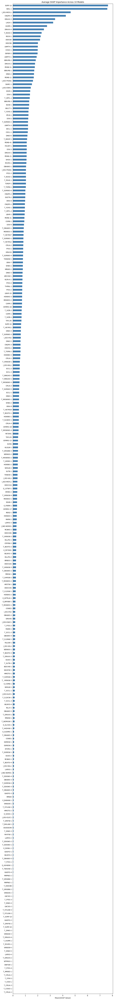

In [ ]:
# Use the same dataset for all models 
shap_data = individual_unit_capacity.drop(columns=['StartTime', 'SystemPrice'])

# Compute SHAP values and global importances for each model
shap_importances = []
for i, model in enumerate(models, start=1):
    shap_values, X_sampled = compute_shap_values(model, shap_data, sample_size=1000)
    shap_imp = get_global_shap_importance(shap_values, X_sampled)
    shap_importances.append(shap_imp.rename(f"Model_{i}"))

# Combine importances into a single DataFrame
shap_compare = pd.concat(shap_importances, axis=1)

# Compute average and standard deviation 
shap_compare["Mean"] = shap_compare.mean(axis=1)
shap_compare["StdDev"] = shap_compare.std(axis=1)
shap_compare = shap_compare.sort_values(by="Mean", ascending=False)

# Plot SHAP importances for all 10 models
shap_compare.iloc[:, :10].plot(
    kind='barh',
    figsize=(12, max(6, len(shap_compare) * 0.3)),
    title='SHAP Importances Across 10 Models'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

# Plot average SHAP importance across models
shap_compare["Mean"].plot(
    kind='barh',
    figsize=(10, max(6, len(shap_compare) * 0.3)),
    title='Average SHAP Importance Across 10 Models',
    color='steelblue'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

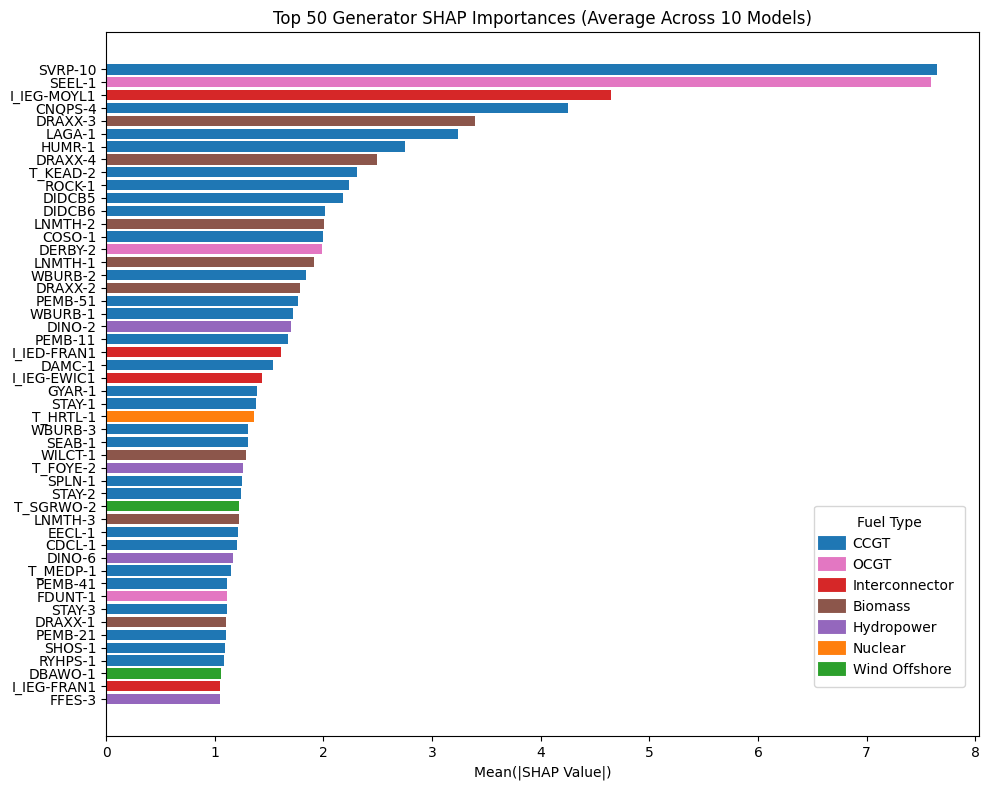

In [ ]:
# Colour map
fuel_colors = {
    'CCGT': '#1f77b4',            
    'Nuclear': '#ff7f0e',         
    'Wind Offshore': '#2ca02c',   
    'Interconnector': '#d62728',  
    'Hydropower': '#9467bd',      
    'Biomass': '#8c564b',         
    'OCGT': '#e377c2',            
    'Wind Onshore': '#7f7f7f'     
}

# Top 50 SHAP features 
top_50 = shap_compare["Mean"].head(50)

# Merge with fuel type info
fuel_map = dict(affected_unit_fuel.values)
top_50_fuel = pd.DataFrame({'Feature': top_50.index, 'SHAP': top_50.values})
top_50_fuel['FuelType'] = top_50_fuel['Feature'].map(fuel_map)

# Filter only features with defined fuel color
top_50_fuel = top_50_fuel[top_50_fuel['FuelType'].isin(fuel_colors)]

# Assign colors
colors = top_50_fuel['FuelType'].map(fuel_colors)

# Plot
plt.figure(figsize=(10, 8))
plt.barh(top_50_fuel['Feature'], top_50_fuel['SHAP'], color=colors)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.title("Top 50 Generator SHAP Importances (Average Across 10 Models)")
plt.tight_layout()

# Legend
unique_fuels_in_plot = top_50_fuel['FuelType'].unique()
handles = [plt.Line2D([0], [0], color=fuel_colors[f], lw=10) for f in unique_fuels_in_plot]
plt.legend(
    handles,
    unique_fuels_in_plot,
    title="Fuel Type",
    loc='lower right',
    bbox_to_anchor=(1.0, 0.05),
    frameon=True,
    handlelength=1,
    handletextpad=1,
    borderaxespad=1,
    fontsize='medium',
    borderpad=0.75,
    title_fontsize='medium'
)

plt.show()

# Save top 50 SHAP importances to CSV
top_50_fuel.to_csv('Top_50_Fuel_Types.csv', index=False)

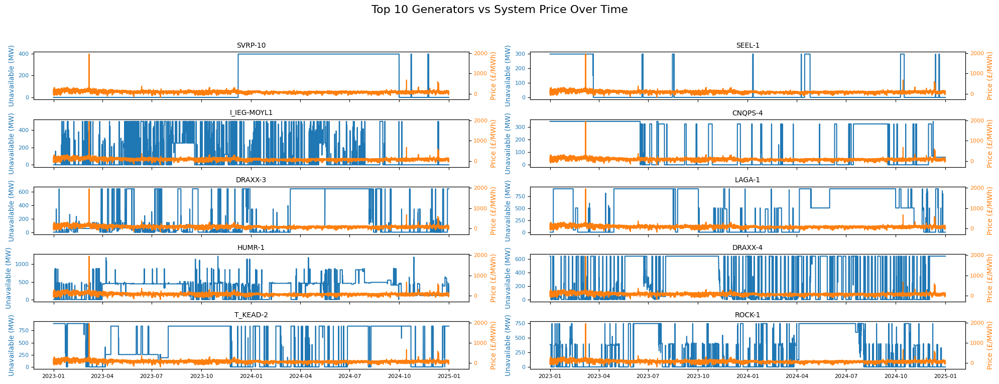

In [ ]:
# Top 10 Generators 
top_generators = top_50_fuel['Feature'].head(10).tolist()

# Sort data by time 
individual_unit_capacity = individual_unit_capacity.sort_values('StartTime')

# Plot setup 
rows, cols = 5, 2
fig, axes = plt.subplots(rows, cols, figsize=(20, 8), sharex=True)
fig.suptitle('Top 10 Generators vs System Price Over Time', fontsize=16)
axes = axes.flatten()

# Loop through each generator
for i, generator in enumerate(top_generators):
    if generator not in individual_unit_capacity.columns:
        print(f"Skipping missing generator: {generator}")
        continue
    
    ax1 = axes[i]

    # Plot unavailable capacity (left y-axis)
    ax1.plot(
        individual_unit_capacity['StartTime'],
        individual_unit_capacity[generator],
        color='tab:blue'
    )
    ax1.set_title(generator, fontsize=10)
    ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=8)
    ax1.tick_params(axis='x', labelsize=8)
    ax1.set_ylabel('Unavailable (MW)', color='tab:blue')

    # Plot system price (right y-axis)
    ax2 = ax1.twinx()
    ax2.plot(
        individual_unit_capacity['StartTime'],
        individual_unit_capacity['SystemPrice'],
        color='tab:orange'
    )
    ax2.set_ylabel('Price (£/MWh)', color='tab:orange')
    ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=8)

# Hide unused subplots if fewer than 10 generators
for j in range(len(top_generators), len(axes)):
    fig.delaxes(axes[j])

# Final layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## Individual Generator Feature Analysis (Planned)

In [ ]:
# Load data
df = individual_unit_capacity_planned.copy()

# Parameters
threshold = 0
min_consecutive_intervals = 90 * 48  # 1440 half-hour periods

# Exclude the timestamp column
generator_columns = df.columns.difference(['StartTime'])

# Function to check if a column has >=1440 consecutive values
def has_long_outage(series):
    condition = series > threshold
    # Use run-length encoding logic
    count = 0
    for val in condition:
        if val:
            count += 1
            if count >= min_consecutive_intervals:
                return True
        else:
            count = 0
    return False

# Identify generators to drop
generators_to_drop = [col for col in generator_columns if has_long_outage(df[col])]

# Drop those columns
individual_unit_capacity_planned_filtered = df.drop(columns=generators_to_drop)
individual_unit_capacity_planned_filtered.drop(columns=['T_GRGBW-3'], inplace=True, errors='ignore')
print(f"Dropped {len(generators_to_drop)} generators with long outages.")

## Save generator names to CSV
# Get column names, excluding the two unwanted ones
cols = [c for c in individual_unit_capacity_planned_filtered.columns 
        if c not in ["SystemPrice", "StartTime"]]

# Put into a DataFrame with one column "Generator"
df_cols = pd.DataFrame({"Generator": cols})

# Save to CSV
df_cols.to_csv("Planned_Generators.csv", index=False)
print("Saved Planned_Generators.csv with", len(df_cols), "generators.")

Dropped 66 generators with long outages.
Saved Planned_Generators.csv with 223 generators.


[I 2025-08-11 20:58:49,256] A new study created in memory with name: no-name-c09e008f-56d2-45d5-a719-8f8a21e4a972



Starting hyperparameter search (100 trials)...



[I 2025-08-11 20:59:02,290] Trial 0 finished with value: -39.34091988643892 and parameters: {'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.004314510365023388, 'subsample': 0.7614143537185687, 'colsample_bytree': 0.9792384492867975, 'reg_alpha': 0.00031948954592930995, 'reg_lambda': 0.10205543371791805}. Best is trial 0 with value: -39.34091988643892.
[I 2025-08-11 20:59:03,756] Trial 1 finished with value: -43.849926957655676 and parameters: {'n_estimators': 400, 'max_depth': 3, 'learning_rate': 0.09114574439872078, 'subsample': 0.576064898887527, 'colsample_bytree': 0.7690674464380753, 'reg_alpha': 0.06710302148158794, 'reg_lambda': 8.933370012164641e-05}. Best is trial 0 with value: -39.34091988643892.
[I 2025-08-11 20:59:10,128] Trial 2 finished with value: -46.301798261340785 and parameters: {'n_estimators': 900, 'max_depth': 8, 'learning_rate': 0.0012643746347050803, 'subsample': 0.9758098482097735, 'colsample_bytree': 0.5443599331598539, 'reg_alpha': 0.000319614029252


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.8001466945287972, 'subsample': 0.9994809210964769, 'colsample_bytree': 0.9314332047426865, 'reg_alpha': 0.00014113842834447774, 'reg_lambda': 0.1872616635249726}

[Result] Train RMSE = 34.988, MAE = 23.313, R² = 0.591



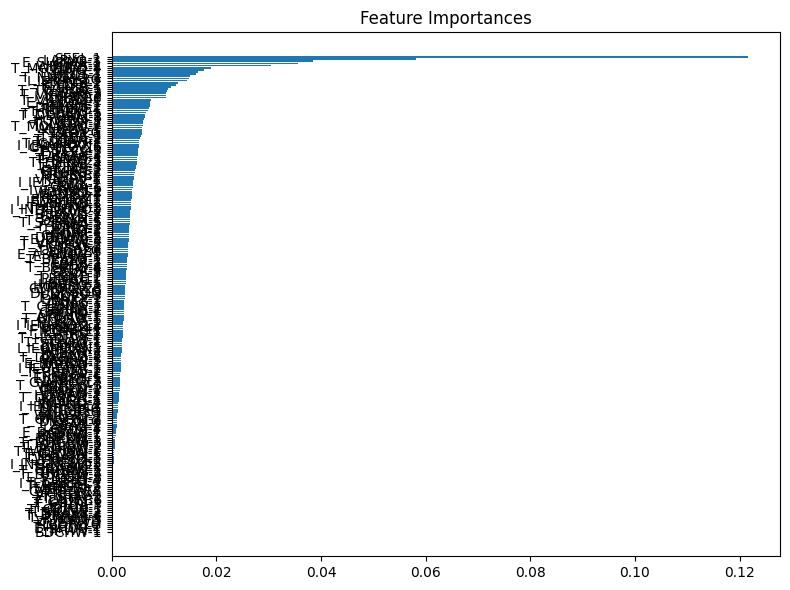

In [19]:
model_individual_generator_planned_data_1, features_individual_generator_planned_data_1, imp_individual_generator_planned_data_1 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

[I 2025-08-11 21:07:43,424] A new study created in memory with name: no-name-c4103ce0-8264-43b5-b1a5-d60777aeb580



Starting hyperparameter search (100 trials)...



[I 2025-08-11 21:07:45,814] Trial 0 finished with value: -39.11503915058678 and parameters: {'n_estimators': 400, 'max_depth': 8, 'learning_rate': 0.040921153796593314, 'subsample': 0.559210031169602, 'colsample_bytree': 0.575265291232195, 'reg_alpha': 0.00010674716277512645, 'reg_lambda': 0.252933983510041}. Best is trial 0 with value: -39.11503915058678.
[I 2025-08-11 21:07:50,883] Trial 1 finished with value: -35.25253644132888 and parameters: {'n_estimators': 900, 'max_depth': 8, 'learning_rate': 0.5625496873394562, 'subsample': 0.9371155411026597, 'colsample_bytree': 0.9770341036189298, 'reg_alpha': 0.0006092575805007141, 'reg_lambda': 7.392123423952009}. Best is trial 1 with value: -35.25253644132888.
[I 2025-08-11 21:07:58,193] Trial 2 finished with value: -35.86237027543118 and parameters: {'n_estimators': 900, 'max_depth': 12, 'learning_rate': 0.03116529182607784, 'subsample': 0.9698571066406294, 'colsample_bytree': 0.5085144163044407, 'reg_alpha': 1.4296538232664158, 'reg_lam


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 9, 'learning_rate': 0.5407230022727619, 'subsample': 0.9998627239762358, 'colsample_bytree': 0.6878986969204922, 'reg_alpha': 4.876555387885919e-05, 'reg_lambda': 3.87673421665175e-05}

[Result] Train RMSE = 34.986, MAE = 23.312, R² = 0.591



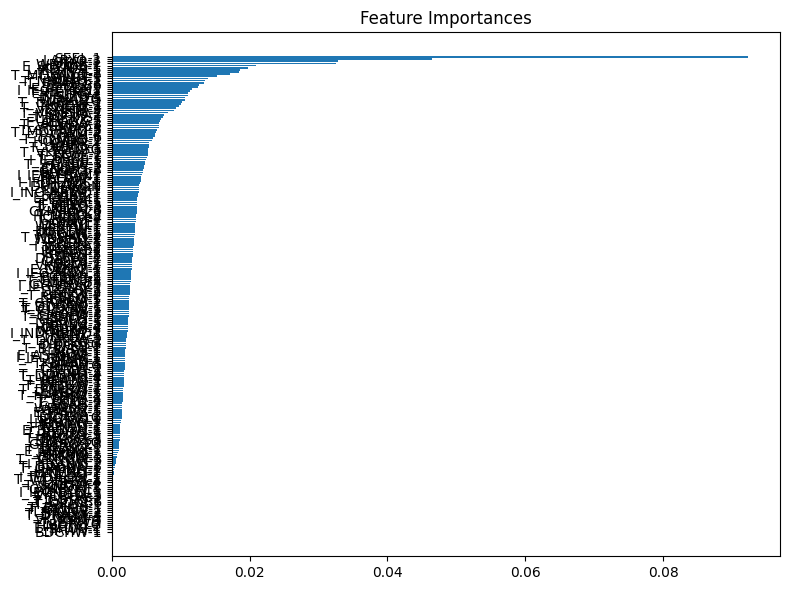

In [20]:
model_individual_generator_planned_data_2, features_individual_generator_planned_data_2, imp_individual_generator_planned_data_2 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

[I 2025-08-11 21:16:34,841] A new study created in memory with name: no-name-585d5d26-044e-4132-8d8c-61db7399ae55



Starting hyperparameter search (100 trials)...



[I 2025-08-11 21:16:42,243] Trial 0 finished with value: -43.09035045669117 and parameters: {'n_estimators': 700, 'max_depth': 11, 'learning_rate': 0.002251395684839179, 'subsample': 0.8136999539186918, 'colsample_bytree': 0.5222933321960079, 'reg_alpha': 0.00016925165243867352, 'reg_lambda': 1.8112280752390417}. Best is trial 0 with value: -43.09035045669117.
[I 2025-08-11 21:16:45,447] Trial 1 finished with value: -36.314523105380076 and parameters: {'n_estimators': 600, 'max_depth': 8, 'learning_rate': 0.2619711085690825, 'subsample': 0.528882522190457, 'colsample_bytree': 0.859427341911024, 'reg_alpha': 0.00046236325996854943, 'reg_lambda': 0.09537696497138629}. Best is trial 1 with value: -36.314523105380076.
[I 2025-08-11 21:16:50,575] Trial 2 finished with value: -35.51119897496133 and parameters: {'n_estimators': 700, 'max_depth': 11, 'learning_rate': 0.09992671673664454, 'subsample': 0.636211470591407, 'colsample_bytree': 0.6607358731710238, 'reg_alpha': 0.145284078447583, 're


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 9, 'learning_rate': 0.9994088998331423, 'subsample': 0.9997929215129886, 'colsample_bytree': 0.5992264733367606, 'reg_alpha': 3.846798135463544e-05, 'reg_lambda': 0.0001247518068384546}

[Result] Train RMSE = 34.986, MAE = 23.309, R² = 0.591



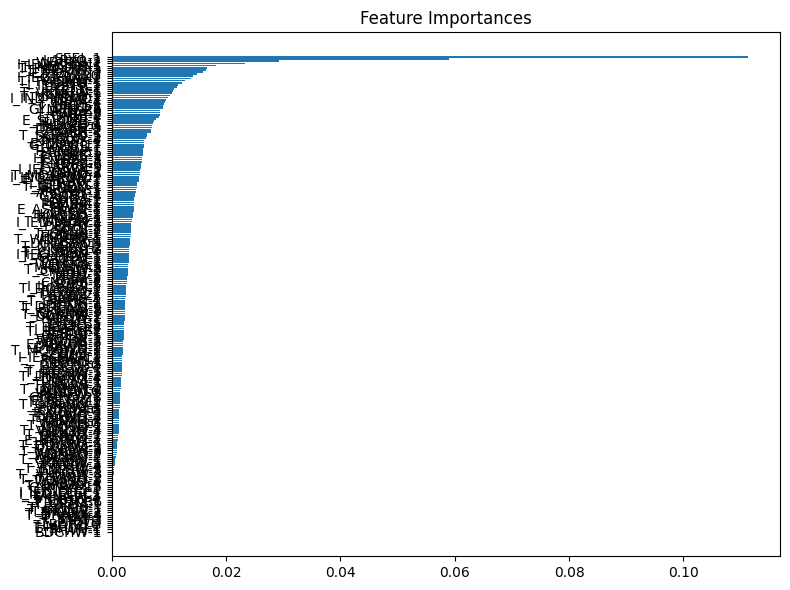

In [21]:
model_individual_generator_planned_data_3, features_individual_generator_planned_data_3, imp_individual_generator_planned_data_3 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

[I 2025-08-11 21:24:22,738] A new study created in memory with name: no-name-b781d561-ffe4-437b-9e0d-4a6d03138384



Starting hyperparameter search (100 trials)...



[I 2025-08-11 21:24:26,841] Trial 0 finished with value: -47.41752996344198 and parameters: {'n_estimators': 400, 'max_depth': 9, 'learning_rate': 0.001609710333487569, 'subsample': 0.733206133116543, 'colsample_bytree': 0.8599753815885253, 'reg_alpha': 0.009720810081590476, 'reg_lambda': 0.00015096488104421432}. Best is trial 0 with value: -47.41752996344198.
[I 2025-08-11 21:24:36,397] Trial 1 finished with value: -39.82415627853522 and parameters: {'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.003454705261028077, 'subsample': 0.7263863075244352, 'colsample_bytree': 0.9236523187479357, 'reg_alpha': 2.2506779720061014, 'reg_lambda': 1.59377880926183e-05}. Best is trial 1 with value: -39.82415627853522.
[I 2025-08-11 21:24:37,327] Trial 2 finished with value: -43.1833630873327 and parameters: {'n_estimators': 100, 'max_depth': 9, 'learning_rate': 0.01854135193068461, 'subsample': 0.9113607843011375, 'colsample_bytree': 0.695249071493617, 'reg_alpha': 0.012401480637630915, '


[Tuning complete] Best parameters:
{'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.679367072104435, 'subsample': 0.9998236954392823, 'colsample_bytree': 0.5104515706648936, 'reg_alpha': 0.1564133832919343, 'reg_lambda': 0.009602370977497717}

[Result] Train RMSE = 34.984, MAE = 23.311, R² = 0.591



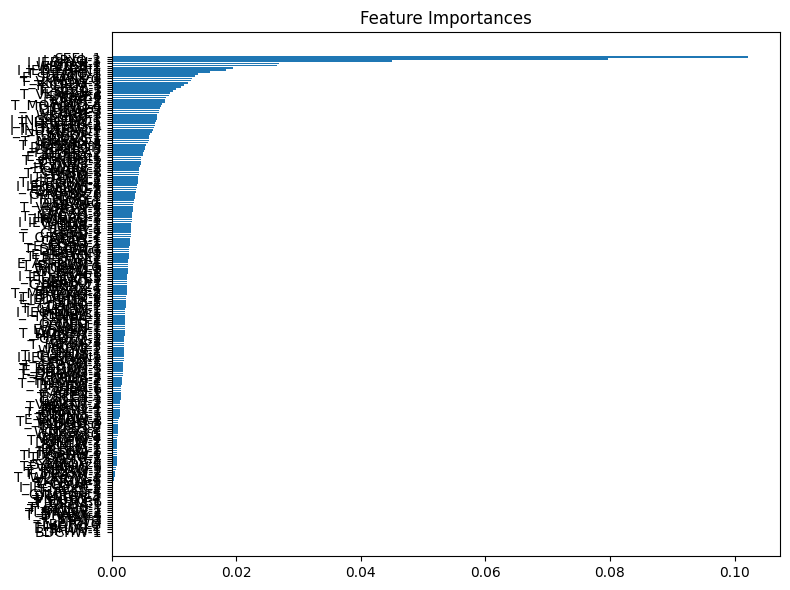

In [22]:
model_individual_generator_planned_data_4, features_individual_generator_planned_data_4, imp_individual_generator_planned_data_4 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

[I 2025-08-11 21:32:10,307] A new study created in memory with name: no-name-d05048a2-1d87-41ba-a4fe-d7eb75ea4945



Starting hyperparameter search (100 trials)...



[I 2025-08-11 21:32:14,683] Trial 0 finished with value: -35.30060447516346 and parameters: {'n_estimators': 700, 'max_depth': 9, 'learning_rate': 0.19582802678265068, 'subsample': 0.9601790363850222, 'colsample_bytree': 0.698237199298297, 'reg_alpha': 1.2154758672682007, 'reg_lambda': 0.00013097770708929193}. Best is trial 0 with value: -35.30060447516346.
[I 2025-08-11 21:32:17,568] Trial 1 finished with value: -36.30623165768869 and parameters: {'n_estimators': 600, 'max_depth': 7, 'learning_rate': 0.8304508813204399, 'subsample': 0.7293920900045283, 'colsample_bytree': 0.9906544733554004, 'reg_alpha': 0.006004352039681427, 'reg_lambda': 0.014688092923716893}. Best is trial 0 with value: -35.30060447516346.
[I 2025-08-11 21:32:20,813] Trial 2 finished with value: -42.89011579040214 and parameters: {'n_estimators': 800, 'max_depth': 5, 'learning_rate': 0.018451174893928245, 'subsample': 0.5894859582105767, 'colsample_bytree': 0.857349341214191, 'reg_alpha': 0.026497736513236093, 'reg


[Tuning complete] Best parameters:
{'n_estimators': 700, 'max_depth': 12, 'learning_rate': 0.5130308397903033, 'subsample': 0.9740350297342377, 'colsample_bytree': 0.9320023020747461, 'reg_alpha': 9.626608480531138, 'reg_lambda': 0.4969661468163971}

[Result] Train RMSE = 35.036, MAE = 23.456, R² = 0.590



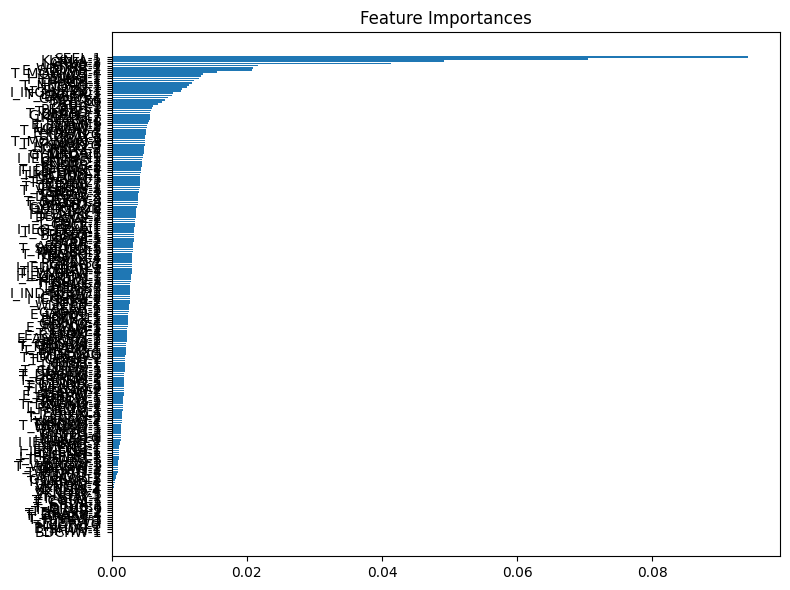

In [23]:
model_individual_generator_planned_data_5, features_individual_generator_planned_data_5, imp_individual_generator_planned_data_5 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

[I 2025-08-11 21:39:10,370] A new study created in memory with name: no-name-046161ba-0406-41fc-98c9-7a802c2feee4



Starting hyperparameter search (100 trials)...



[I 2025-08-11 21:39:13,257] Trial 0 finished with value: -36.51212089347174 and parameters: {'n_estimators': 300, 'max_depth': 12, 'learning_rate': 0.7797353549835341, 'subsample': 0.5297096761948604, 'colsample_bytree': 0.8681535651158923, 'reg_alpha': 0.001963011679571109, 'reg_lambda': 1.573498251068167}. Best is trial 0 with value: -36.51212089347174.
[I 2025-08-11 21:39:18,083] Trial 1 finished with value: -47.578599048753894 and parameters: {'n_estimators': 400, 'max_depth': 11, 'learning_rate': 0.001327925097301486, 'subsample': 0.5061959164053909, 'colsample_bytree': 0.7585224761226304, 'reg_alpha': 4.672242622520981, 'reg_lambda': 0.08535682151452707}. Best is trial 0 with value: -36.51212089347174.
[I 2025-08-11 21:39:19,619] Trial 2 finished with value: -51.40850470640356 and parameters: {'n_estimators': 400, 'max_depth': 3, 'learning_rate': 0.0017421735848241844, 'subsample': 0.5600635612893059, 'colsample_bytree': 0.7069890938044079, 'reg_alpha': 1.3890052026315484e-05, 'r


[Tuning complete] Best parameters:
{'n_estimators': 700, 'max_depth': 12, 'learning_rate': 0.6682198975356586, 'subsample': 0.9998560142138636, 'colsample_bytree': 0.7228588606903845, 'reg_alpha': 0.017134050041023446, 'reg_lambda': 1.867358724128748}

[Result] Train RMSE = 34.983, MAE = 23.298, R² = 0.591



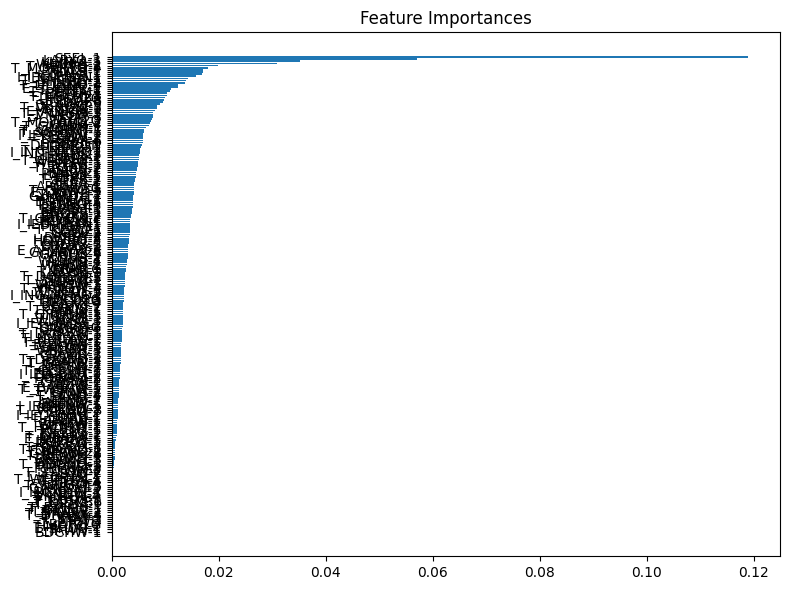

In [24]:
model_individual_generator_planned_data_6, features_individual_generator_planned_data_6, imp_individual_generator_planned_data_6 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

[I 2025-08-11 21:47:08,954] A new study created in memory with name: no-name-1f18ef68-8121-48fb-9ac6-af9c031ebdd9



Starting hyperparameter search (100 trials)...



[I 2025-08-11 21:47:20,736] Trial 0 finished with value: -44.302381940824375 and parameters: {'n_estimators': 1000, 'max_depth': 11, 'learning_rate': 0.0012088234006440814, 'subsample': 0.9315338033412778, 'colsample_bytree': 0.8036923196507809, 'reg_alpha': 4.352913652007151, 'reg_lambda': 7.300384317480126}. Best is trial 0 with value: -44.302381940824375.
[I 2025-08-11 21:47:22,623] Trial 1 finished with value: -44.03633295456616 and parameters: {'n_estimators': 600, 'max_depth': 3, 'learning_rate': 0.0614035986839238, 'subsample': 0.9214836990114437, 'colsample_bytree': 0.7510131264305449, 'reg_alpha': 0.0010189373094688658, 'reg_lambda': 0.08693912019471565}. Best is trial 1 with value: -44.03633295456616.
[I 2025-08-11 21:47:28,297] Trial 2 finished with value: -43.986349036330765 and parameters: {'n_estimators': 800, 'max_depth': 8, 'learning_rate': 0.0031759331082435037, 'subsample': 0.6578392047428965, 'colsample_bytree': 0.800233226917931, 'reg_alpha': 1.317990353483313e-05, 


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 11, 'learning_rate': 0.2373526467699818, 'subsample': 0.9999553657056491, 'colsample_bytree': 0.7676641847166401, 'reg_alpha': 0.0029531068073529714, 'reg_lambda': 0.010925511417749964}

[Result] Train RMSE = 34.983, MAE = 23.300, R² = 0.591



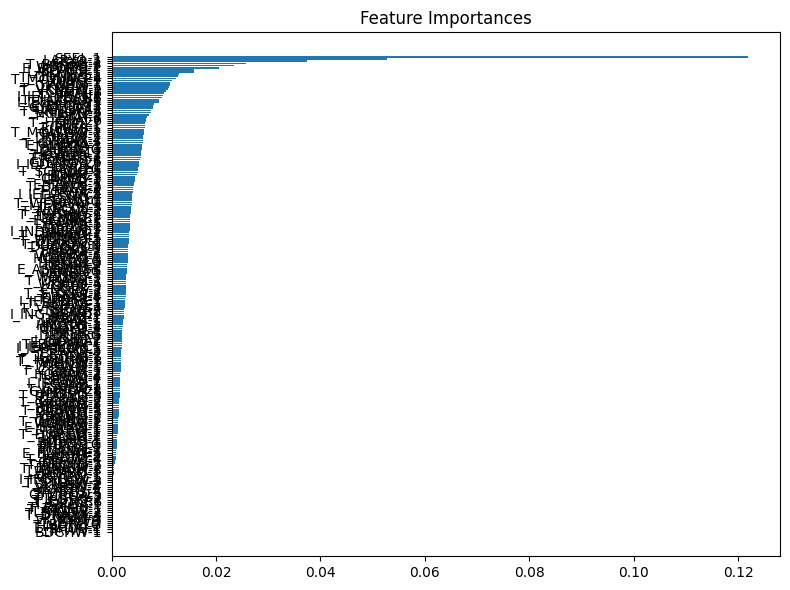

In [25]:
model_individual_generator_planned_data_7, features_individual_generator_planned_data_7, imp_individual_generator_planned_data_7 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

[I 2025-08-11 21:57:30,647] A new study created in memory with name: no-name-01ac9624-e9fe-425c-9f5c-bcf193e77320



Starting hyperparameter search (100 trials)...



[I 2025-08-11 21:57:36,066] Trial 0 finished with value: -36.328199089119884 and parameters: {'n_estimators': 1000, 'max_depth': 9, 'learning_rate': 0.05427936358537493, 'subsample': 0.5642591196051949, 'colsample_bytree': 0.6363954820127818, 'reg_alpha': 0.0006058170285179191, 'reg_lambda': 7.165498106889899e-05}. Best is trial 0 with value: -36.328199089119884.
[I 2025-08-11 21:57:37,735] Trial 1 finished with value: -50.0818309429884 and parameters: {'n_estimators': 600, 'max_depth': 3, 'learning_rate': 0.002318558705907884, 'subsample': 0.9218571293337228, 'colsample_bytree': 0.5215809089336338, 'reg_alpha': 0.049379797364052916, 'reg_lambda': 0.0016339909048810294}. Best is trial 0 with value: -36.328199089119884.
[I 2025-08-11 21:57:38,734] Trial 2 finished with value: -41.92276316953494 and parameters: {'n_estimators': 400, 'max_depth': 3, 'learning_rate': 0.27297323997866396, 'subsample': 0.720517126631864, 'colsample_bytree': 0.9397138003723318, 'reg_alpha': 0.0016608595727611


[Tuning complete] Best parameters:
{'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.3621335530036703, 'subsample': 0.9874566458207613, 'colsample_bytree': 0.6475733549306407, 'reg_alpha': 4.4709729315403766e-05, 'reg_lambda': 0.0002334800490731805}

[Result] Train RMSE = 35.040, MAE = 23.495, R² = 0.590



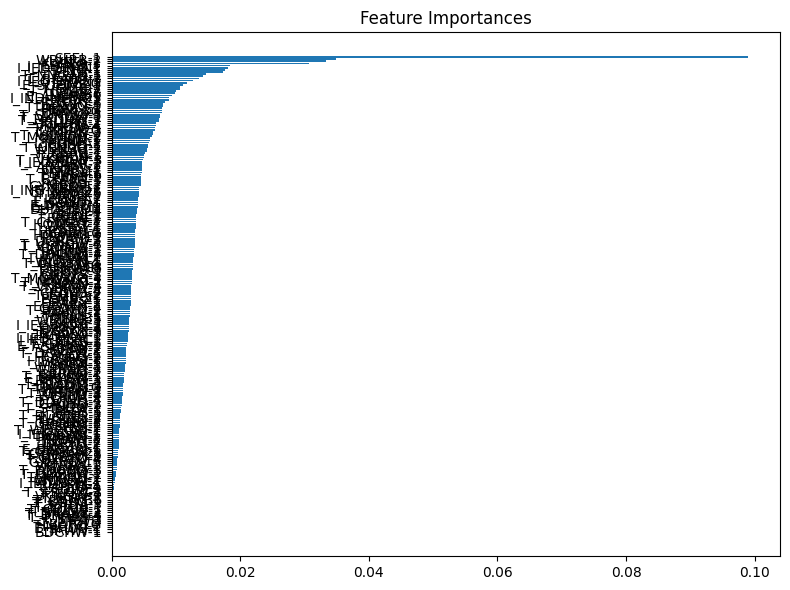

In [26]:
model_individual_generator_planned_data_8, features_individual_generator_planned_data_8, imp_individual_generator_planned_data_8 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

[I 2025-08-11 22:02:24,346] A new study created in memory with name: no-name-1fa88c17-abcb-4f79-af2c-fd8874a688e7



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:02:25,407] Trial 0 finished with value: -43.41390182092721 and parameters: {'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.09329816865596181, 'subsample': 0.5290361511662158, 'colsample_bytree': 0.7836462064609562, 'reg_alpha': 0.008316508890607574, 'reg_lambda': 0.001665483750818958}. Best is trial 0 with value: -43.41390182092721.
[I 2025-08-11 22:02:28,251] Trial 1 finished with value: -43.32074380708874 and parameters: {'n_estimators': 300, 'max_depth': 11, 'learning_rate': 0.003701737225488432, 'subsample': 0.5524651687975493, 'colsample_bytree': 0.9906191239816019, 'reg_alpha': 0.002553184075743289, 'reg_lambda': 0.005286979839148214}. Best is trial 1 with value: -43.32074380708874.
[I 2025-08-11 22:02:30,819] Trial 2 finished with value: -41.34351882028308 and parameters: {'n_estimators': 700, 'max_depth': 7, 'learning_rate': 0.010899538484155076, 'subsample': 0.72686340449359, 'colsample_bytree': 0.9207450079209085, 'reg_alpha': 0.2034137858953735, 're


[Tuning complete] Best parameters:
{'n_estimators': 700, 'max_depth': 11, 'learning_rate': 0.9654422100670977, 'subsample': 0.9999130600319729, 'colsample_bytree': 0.9953197187489939, 'reg_alpha': 1.640034238380988e-05, 'reg_lambda': 0.15929384678877176}

[Result] Train RMSE = 34.982, MAE = 23.288, R² = 0.591



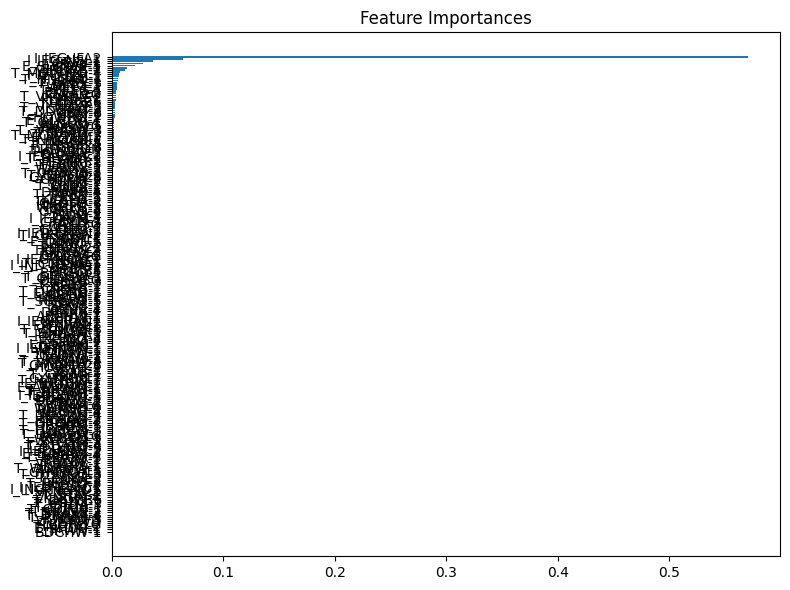

In [27]:
model_individual_generator_planned_data_9, features_individual_generator_planned_data_9, imp_individual_generator_planned_data_9 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

[I 2025-08-11 22:07:35,032] A new study created in memory with name: no-name-c5f5b9b5-879c-4769-9b9f-e54aa82cbf95



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:07:37,768] Trial 0 finished with value: -39.59322204356278 and parameters: {'n_estimators': 900, 'max_depth': 7, 'learning_rate': 0.02387013771562665, 'subsample': 0.9794413312160328, 'colsample_bytree': 0.9207652786342158, 'reg_alpha': 0.31240823196975787, 'reg_lambda': 5.686364616324068e-05}. Best is trial 0 with value: -39.59322204356278.
[I 2025-08-11 22:07:38,271] Trial 1 finished with value: -49.88281642381863 and parameters: {'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.007654315365193205, 'subsample': 0.6701968293016518, 'colsample_bytree': 0.5395298573837627, 'reg_alpha': 2.088973145721099e-05, 'reg_lambda': 0.5020779552855752}. Best is trial 0 with value: -39.59322204356278.
[I 2025-08-11 22:07:41,852] Trial 2 finished with value: -47.81246949428962 and parameters: {'n_estimators': 800, 'max_depth': 8, 'learning_rate': 0.001118641577286346, 'subsample': 0.7940974695020855, 'colsample_bytree': 0.5677046868616646, 'reg_alpha': 0.8080673544467118, 're


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.8604296789087023, 'subsample': 0.9986617379219566, 'colsample_bytree': 0.7485491735645029, 'reg_alpha': 0.0007106520936723368, 'reg_lambda': 6.156225599017355}

[Result] Train RMSE = 34.996, MAE = 23.384, R² = 0.591



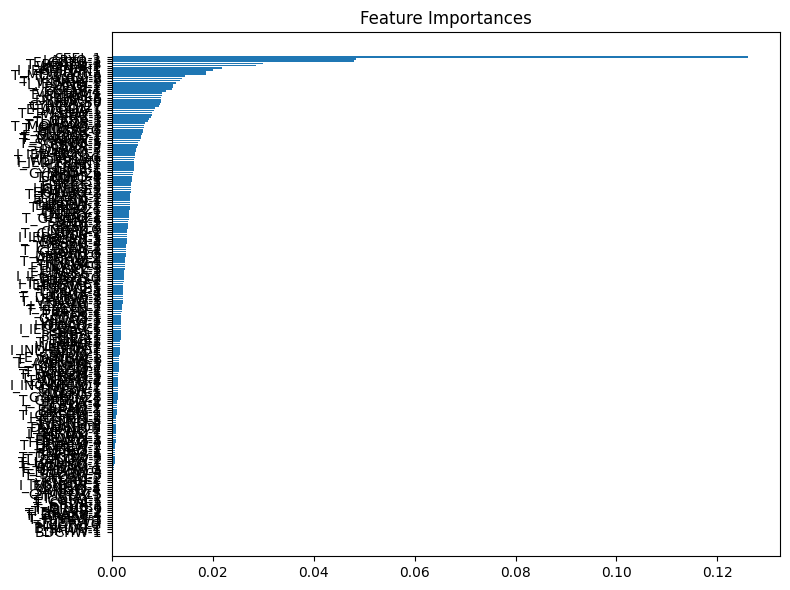

In [28]:
model_individual_generator_planned_data_10, features_individual_generator_planned_data_10, imp_individual_generator_planned_data_10 = run_feature_importance_model(individual_unit_capacity_planned_filtered)

In [ ]:
# Save all 10 models 
# List of models
models = [
    model_individual_generator_planned_data_1,
    model_individual_generator_planned_data_2,
    model_individual_generator_planned_data_3,
    model_individual_generator_planned_data_4,
    model_individual_generator_planned_data_5,
    model_individual_generator_planned_data_6,
    model_individual_generator_planned_data_7,
    model_individual_generator_planned_data_8,
    model_individual_generator_planned_data_9,
    model_individual_generator_planned_data_10
]

# Save each model
for i, model in enumerate(models, start=1):
    filename = f"model_individual_generator_planned_data_{i}.joblib"
    joblib.dump(model, filename)
    print(f"Saved: {filename}")

Saved: model_individual_generator_planned_data_1.joblib
Saved: model_individual_generator_planned_data_2.joblib
Saved: model_individual_generator_planned_data_3.joblib
Saved: model_individual_generator_planned_data_4.joblib
Saved: model_individual_generator_planned_data_5.joblib
Saved: model_individual_generator_planned_data_6.joblib
Saved: model_individual_generator_planned_data_7.joblib
Saved: model_individual_generator_planned_data_8.joblib
Saved: model_individual_generator_planned_data_9.joblib
Saved: model_individual_generator_planned_data_10.joblib


In [ ]:
# Load all 10 models into a list
models = []

for i in range(1, 11):
    filename = f"model_individual_generator_planned_data_{i}.joblib"
    model = joblib.load(filename)
    models.append(model)
    print(f"Loaded: {filename}")

Loaded: model_individual_generator_planned_data_1.joblib
Loaded: model_individual_generator_planned_data_2.joblib
Loaded: model_individual_generator_planned_data_3.joblib
Loaded: model_individual_generator_planned_data_4.joblib
Loaded: model_individual_generator_planned_data_5.joblib
Loaded: model_individual_generator_planned_data_6.joblib
Loaded: model_individual_generator_planned_data_7.joblib
Loaded: model_individual_generator_planned_data_8.joblib
Loaded: model_individual_generator_planned_data_9.joblib
Loaded: model_individual_generator_planned_data_10.joblib


In [ ]:
shap_data = individual_unit_capacity_planned_filtered.drop(columns=['StartTime', 'SystemPrice'])

# Compute SHAP values and global importances for each model 
shap_importances = []
for i, model in enumerate(models, start=1):
    shap_values, X_sampled = compute_shap_values(model, shap_data, sample_size=1000)
    shap_imp = get_global_shap_importance(shap_values, X_sampled)
    shap_importances.append(shap_imp.rename(f"Model_{i}"))

# Combine importances into a single DataFrame 
shap_compare = pd.concat(shap_importances, axis=1)

# Compute average and standard deviation 
shap_compare["Mean"] = shap_compare.mean(axis=1)
shap_compare["StdDev"] = shap_compare.std(axis=1)
shap_compare = shap_compare.sort_values(by="Mean", ascending=False)

# Plot SHAP importances for all 10 models
shap_compare.iloc[:, :10].plot(
    kind='barh',
    figsize=(12, max(6, len(shap_compare) * 0.3)),
    title='SHAP Importances Across 10 Models'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

#  Plot average SHAP importance across models 
shap_compare["Mean"].plot(
    kind='barh',
    figsize=(10, max(6, len(shap_compare) * 0.3)),
    title='Average SHAP Importance Across 10 Models',
    color='steelblue'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

In [ ]:
# Prepare top 50 SHAP features
top_50 = shap_compare["Mean"].head(50)

# Merge with fuel type info
fuel_map = dict(affected_unit_fuel.values)
top_50_fuel = pd.DataFrame({'Feature': top_50.index, 'SHAP': top_50.values})
top_50_fuel['FuelType'] = top_50_fuel['Feature'].map(fuel_map)

# Drop rows with unknown fuelType
top_50_fuel = top_50_fuel.dropna(subset=['FuelType'])

# Filter only features with defined fuel color
top_50_fuel = top_50_fuel[top_50_fuel['FuelType'].isin(fuel_colors)]

# Assign colors
colors = top_50_fuel['FuelType'].map(fuel_colors)

# Plot 
plt.figure(figsize=(10, 8))
plt.barh(top_50_fuel['Feature'], top_50_fuel['SHAP'], color=colors)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.title("Top 50 Planned Generator SHAP Importances (Average Across 10 Models)")
plt.tight_layout()

# Legend 
unique_fuels_in_plot = top_50_fuel['FuelType'].unique()
handles = [plt.Line2D([0], [0], color=fuel_colors[f], lw=10) for f in unique_fuels_in_plot]
plt.legend(
    handles,
    unique_fuels_in_plot,
    title="Fuel Type",
    loc='lower right',
    bbox_to_anchor=(1.0, 0.05),
    frameon=True,
    handlelength=1,
    handletextpad=1,
    borderaxespad=1,
    fontsize='medium',
    borderpad=0.75,
    title_fontsize='medium'
)

plt.show()

# Save top 50 SHAP importances to CSV
top_50_fuel.to_csv('Top_50_Fuel_Types_Planned.csv', index=False)

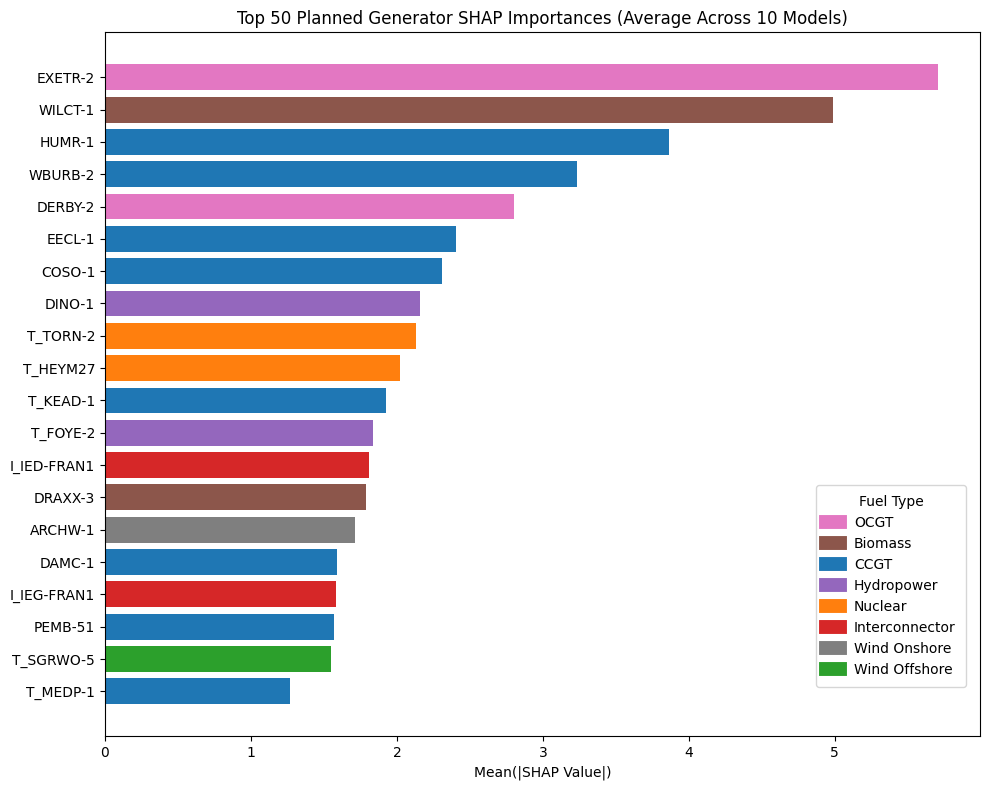

In [ ]:
# Assign colors
colors = top_50_fuel['FuelType'].map(fuel_colors)

# Plot
plt.figure(figsize=(10, 8))
plt.barh(top_50_fuel['Feature'], top_50_fuel['SHAP'], color=colors)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.title("Top 50 Planned Generator SHAP Importances (Average Across 10 Models)")
plt.tight_layout()

# Legend
unique_fuels_in_plot = top_50_fuel['FuelType'].unique()
handles = [plt.Line2D([0], [0], color=fuel_colors[f], lw=10) for f in unique_fuels_in_plot]
plt.legend(
    handles,
    unique_fuels_in_plot,
    title="Fuel Type",
    loc='lower right',
    bbox_to_anchor=(1.0, 0.05),
    frameon=True,
    handlelength=1,
    handletextpad=1,
    borderaxespad=1,
    fontsize='medium',
    borderpad=0.75,
    title_fontsize='medium'
)

plt.show()

# Save top 50 SHAP importances to CSV
top_50_fuel.to_csv('Top_50_Fuel_Types_Planned.csv', index=False)

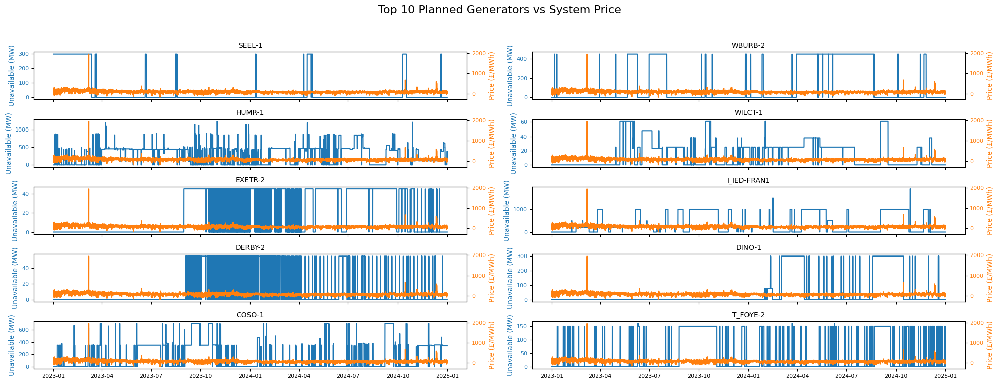

In [ ]:
#Top 10 generators
top_generators = top_50_fuel['Feature'].head(10).tolist()

# Sort data by date
individual_unit_capacity_planned_filtered = individual_unit_capacity_planned_filtered.sort_values('StartTime')

# Plot setup
rows, cols = 5, 2
fig, axes = plt.subplots(rows, cols, figsize=(20, 8), sharex=True)
fig.suptitle('Top 10 Planned Generators vs System Price', fontsize=16)
axes = axes.flatten()

# Loop through each generator
for i, generator in enumerate(top_generators):
    if generator not in individual_unit_capacity_planned_filtered.columns:
        print(f"Skipping missing generator: {generator}")
        continue
    
    ax1 = axes[i]

    # Plot unavailable capacity (left y-axis)
    ax1.plot(
        individual_unit_capacity_planned_filtered['StartTime'],
        individual_unit_capacity_planned_filtered[generator],
        color='tab:blue'
    )
    ax1.set_title(generator, fontsize=10)
    ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=8)
    ax1.tick_params(axis='x', labelsize=8)
    ax1.set_ylabel('Unavailable (MW)', color='tab:blue')

    # Plot system price (right y-axis)
    ax2 = ax1.twinx()
    ax2.plot(
        individual_unit_capacity_planned_filtered['StartTime'],
        individual_unit_capacity_planned_filtered['SystemPrice'],
        color='tab:orange'
    )
    ax2.set_ylabel('Price (£/MWh)', color='tab:orange')
    ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=8)

# Hide unused subplots if fewer than 10 generators
for j in range(len(top_generators), len(axes)):
    fig.delaxes(axes[j])

# Final layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## Individual Generator Feature Analysis (Unplanned)

In [ ]:
# Load your data (replace with actual loading if not already loaded)
df = individual_unit_capacity_unplanned.copy()

# Parameters
threshold = 0
min_consecutive_intervals = 90 * 48  # 1440 half-hour periods

# Exclude the timestamp column
generator_columns = df.columns.difference(['StartTime'])

# Function to check if a column has >=1440 consecutive values 
def has_long_outage(series):
    condition = series > threshold
    # Use run-length encoding logic
    count = 0
    for val in condition:
        if val:
            count += 1
            if count >= min_consecutive_intervals:
                return True
        else:
            count = 0
    return False

# Identify generators to drop
generators_to_drop = [col for col in generator_columns if has_long_outage(df[col])]

# Drop those columns
individual_unit_capacity_unplanned_filtered = df.drop(columns=generators_to_drop)
individual_unit_capacity_unplanned_filtered.drop(columns=['T_GRGBW-3'], inplace=True, errors='ignore')
print(f"Dropped {len(generators_to_drop)} generators with long outages.")

## Save generator names to CSV
# Get column names, excluding the two unwanted ones
cols = [c for c in individual_unit_capacity_unplanned_filtered.columns 
        if c not in ["SystemPrice", "StartTime"]]

# Put into a DataFrame with one column "Generator"
df_cols = pd.DataFrame({"Generator": cols})

# Save to CSV
df_cols.to_csv("Unplanned_Generators.csv", index=False)

print("Saved Unplanned_Generators.csv with", len(df_cols), "generators.")

Dropped 16 generators with long outages.
Saved Unplanned_Generators.csv with 272 generators.


[I 2025-08-11 22:14:24,775] A new study created in memory with name: no-name-b40d1eb6-f9e2-4a3b-a845-8cea84741907



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:14:30,524] Trial 0 finished with value: -36.32689147946422 and parameters: {'n_estimators': 600, 'max_depth': 12, 'learning_rate': 0.008924385237333365, 'subsample': 0.9516804390164566, 'colsample_bytree': 0.7973187146155145, 'reg_alpha': 0.0004017033418597278, 'reg_lambda': 0.00784825727770588}. Best is trial 0 with value: -36.32689147946422.
[I 2025-08-11 22:14:33,127] Trial 1 finished with value: -35.98539120949791 and parameters: {'n_estimators': 500, 'max_depth': 10, 'learning_rate': 0.03773005576514954, 'subsample': 0.7299256003791006, 'colsample_bytree': 0.813787027579556, 'reg_alpha': 0.006586917094448121, 'reg_lambda': 4.933012844276445}. Best is trial 1 with value: -35.98539120949791.
[I 2025-08-11 22:14:33,758] Trial 2 finished with value: -34.872020279686865 and parameters: {'n_estimators': 100, 'max_depth': 11, 'learning_rate': 0.2056877416018735, 'subsample': 0.6115130833732578, 'colsample_bytree': 0.6951486226669241, 'reg_alpha': 0.00021506009069370346, 


[Tuning complete] Best parameters:
{'n_estimators': 900, 'max_depth': 12, 'learning_rate': 0.596840835210856, 'subsample': 0.9992008799179197, 'colsample_bytree': 0.5409243506003948, 'reg_alpha': 0.0008454147496218909, 'reg_lambda': 6.58220495890153e-05}

[Result] Train RMSE = 31.858, MAE = 19.862, R² = 0.661



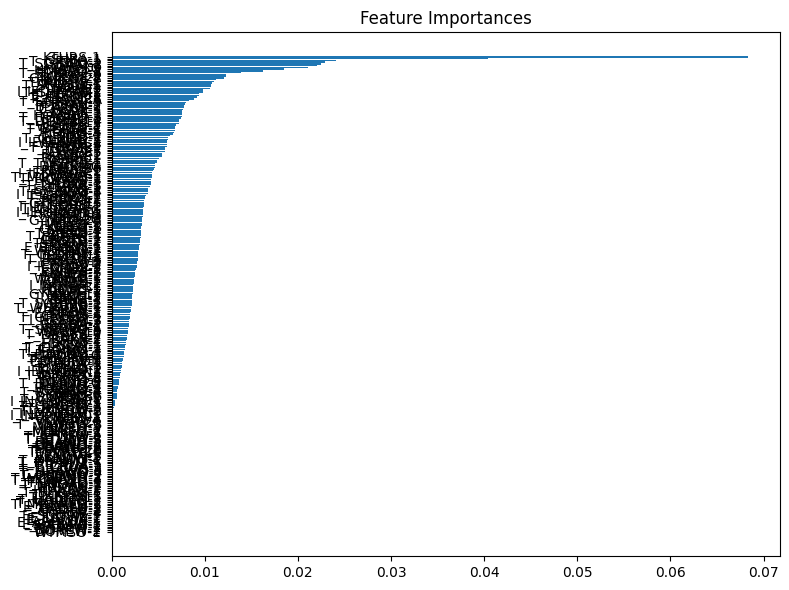

In [35]:
model_individual_generator_unplanned_data_1, features_individual_generator_unplanned_data_1, imp_individual_generator_unplanned_data_1 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

[I 2025-08-11 22:21:27,656] A new study created in memory with name: no-name-91eaa2a5-4380-4afe-a831-62f234e2f1a3



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:21:34,229] Trial 0 finished with value: -32.681410388004394 and parameters: {'n_estimators': 1000, 'max_depth': 12, 'learning_rate': 0.047527770393652906, 'subsample': 0.796199187861348, 'colsample_bytree': 0.789163905872754, 'reg_alpha': 0.04602280374091557, 'reg_lambda': 0.002599555345010649}. Best is trial 0 with value: -32.681410388004394.
[I 2025-08-11 22:21:36,312] Trial 1 finished with value: -34.13819137771393 and parameters: {'n_estimators': 500, 'max_depth': 9, 'learning_rate': 0.8065909929209966, 'subsample': 0.5578024858415354, 'colsample_bytree': 0.885009467802915, 'reg_alpha': 0.0010873844616904544, 'reg_lambda': 2.418519728347851e-05}. Best is trial 0 with value: -32.681410388004394.
[I 2025-08-11 22:21:40,013] Trial 2 finished with value: -37.17553243476823 and parameters: {'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.010081452917234822, 'subsample': 0.9742658755736747, 'colsample_bytree': 0.717596264183763, 'reg_alpha': 3.957971589799207, '


[Tuning complete] Best parameters:
{'n_estimators': 800, 'max_depth': 12, 'learning_rate': 0.9988073165229007, 'subsample': 0.9998877487641303, 'colsample_bytree': 0.9645298229005738, 'reg_alpha': 2.9627439657213264e-05, 'reg_lambda': 4.847220219066814e-05}

[Result] Train RMSE = 31.851, MAE = 19.802, R² = 0.661



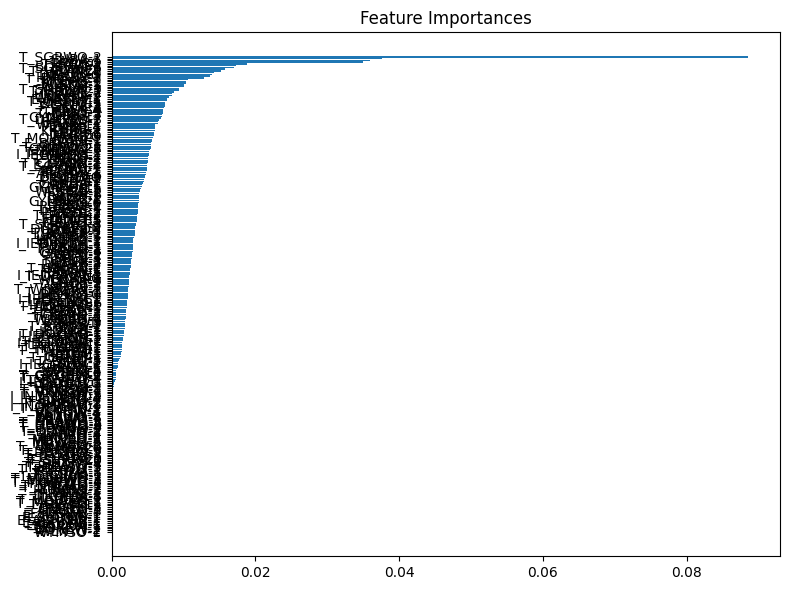

In [36]:
model_individual_generator_unplanned_data_2, features_individual_generator_unplanned_data_2, imp_individual_generator_unplanned_data_2 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

[I 2025-08-11 22:26:40,296] A new study created in memory with name: no-name-12711422-9353-4752-bca8-599a5fc36446



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:26:42,479] Trial 0 finished with value: -43.63390324367112 and parameters: {'n_estimators': 600, 'max_depth': 6, 'learning_rate': 0.0071356918082657525, 'subsample': 0.6091251783618494, 'colsample_bytree': 0.7577655164378488, 'reg_alpha': 0.00013426561247433875, 'reg_lambda': 1.0336017945335006e-05}. Best is trial 0 with value: -43.63390324367112.
[I 2025-08-11 22:26:43,974] Trial 1 finished with value: -52.092139502243825 and parameters: {'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.0014803469096114226, 'subsample': 0.572332029036629, 'colsample_bytree': 0.6639498786467835, 'reg_alpha': 0.05342804127219315, 'reg_lambda': 0.0004636801256227513}. Best is trial 0 with value: -43.63390324367112.
[I 2025-08-11 22:26:46,623] Trial 2 finished with value: -37.071803202866086 and parameters: {'n_estimators': 400, 'max_depth': 11, 'learning_rate': 0.01781512825103959, 'subsample': 0.7022909281238008, 'colsample_bytree': 0.5395376608928715, 'reg_alpha': 0.023278061121


[Tuning complete] Best parameters:
{'n_estimators': 800, 'max_depth': 12, 'learning_rate': 0.7457908184649423, 'subsample': 0.9997795544682858, 'colsample_bytree': 0.9412401645738907, 'reg_alpha': 0.016424607188082134, 'reg_lambda': 1.4011234478576467e-05}

[Result] Train RMSE = 31.852, MAE = 19.811, R² = 0.661



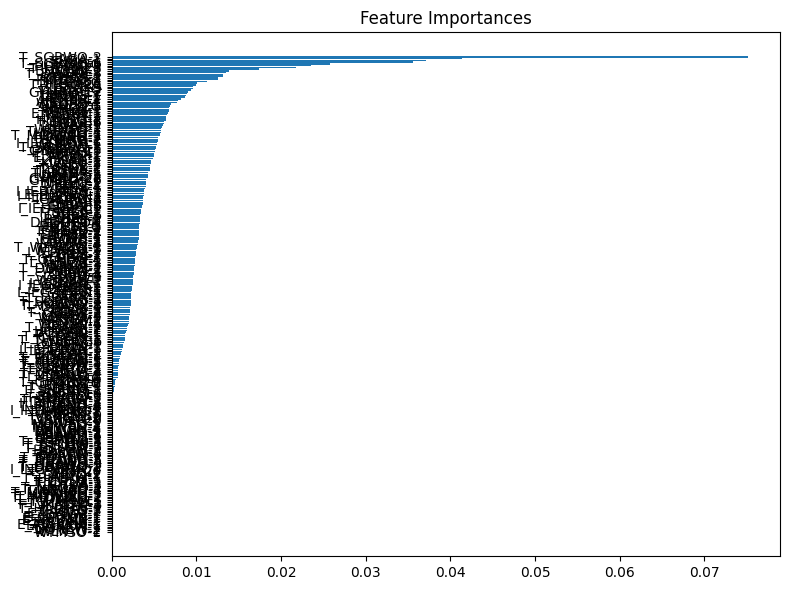

In [37]:
model_individual_generator_unplanned_data_3, features_individual_generator_unplanned_data_3, imp_individual_generator_unplanned_data_3 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

[I 2025-08-11 22:33:26,100] A new study created in memory with name: no-name-8b203452-20ce-4798-b759-43d8ceccfac2



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:33:30,134] Trial 0 finished with value: -36.4941151457237 and parameters: {'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.012018818224512133, 'subsample': 0.7487143959449876, 'colsample_bytree': 0.8727353269602744, 'reg_alpha': 0.03462327703552686, 'reg_lambda': 4.698858088013982e-05}. Best is trial 0 with value: -36.4941151457237.
[I 2025-08-11 22:33:33,457] Trial 1 finished with value: -32.973263866174776 and parameters: {'n_estimators': 600, 'max_depth': 11, 'learning_rate': 0.12153035120483342, 'subsample': 0.6391012698626912, 'colsample_bytree': 0.7385275202672534, 'reg_alpha': 0.0021313874552273517, 'reg_lambda': 0.30924181926818894}. Best is trial 1 with value: -32.973263866174776.
[I 2025-08-11 22:33:37,680] Trial 2 finished with value: -42.44739836154902 and parameters: {'n_estimators': 900, 'max_depth': 8, 'learning_rate': 0.0033926343550157788, 'subsample': 0.5677101342684647, 'colsample_bytree': 0.5972288358842219, 'reg_alpha': 0.00028314932968204


[Tuning complete] Best parameters:
{'n_estimators': 1000, 'max_depth': 12, 'learning_rate': 0.6098382117907647, 'subsample': 0.9999489952132331, 'colsample_bytree': 0.8056464023495896, 'reg_alpha': 0.03311735877845345, 'reg_lambda': 0.007895313838093962}

[Result] Train RMSE = 31.851, MAE = 19.805, R² = 0.661



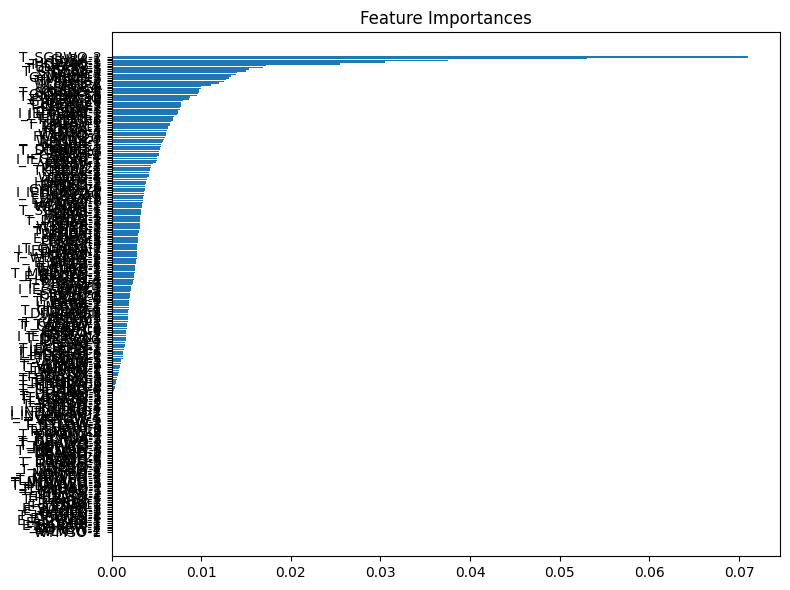

In [38]:
model_individual_generator_unplanned_data_4, features_individual_generator_unplanned_data_4, imp_individual_generator_unplanned_data_4 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

[I 2025-08-11 22:40:56,830] A new study created in memory with name: no-name-48fa1b6e-cade-4174-9611-715349ae3d6b



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:41:00,177] Trial 0 finished with value: -35.58538713634489 and parameters: {'n_estimators': 1000, 'max_depth': 7, 'learning_rate': 0.05097367202391514, 'subsample': 0.9837601337772683, 'colsample_bytree': 0.9449541312398897, 'reg_alpha': 0.412852306310974, 'reg_lambda': 0.18821271606045573}. Best is trial 0 with value: -35.58538713634489.
[I 2025-08-11 22:41:06,311] Trial 1 finished with value: -35.800898711375446 and parameters: {'n_estimators': 800, 'max_depth': 12, 'learning_rate': 0.009666867942806525, 'subsample': 0.8847411511783503, 'colsample_bytree': 0.8084811559460419, 'reg_alpha': 0.00015832420958594617, 'reg_lambda': 0.6323019491680613}. Best is trial 0 with value: -35.58538713634489.
[I 2025-08-11 22:41:09,049] Trial 2 finished with value: -36.79513703997505 and parameters: {'n_estimators': 1000, 'max_depth': 5, 'learning_rate': 0.09463538928471364, 'subsample': 0.5325639272049655, 'colsample_bytree': 0.9436181105832007, 'reg_alpha': 0.038721620427279904, '


[Tuning complete] Best parameters:
{'n_estimators': 600, 'max_depth': 10, 'learning_rate': 0.777623402788416, 'subsample': 0.9999681302624114, 'colsample_bytree': 0.892999777970005, 'reg_alpha': 0.9815950594436007, 'reg_lambda': 0.016654825866857337}

[Result] Train RMSE = 31.852, MAE = 19.852, R² = 0.661



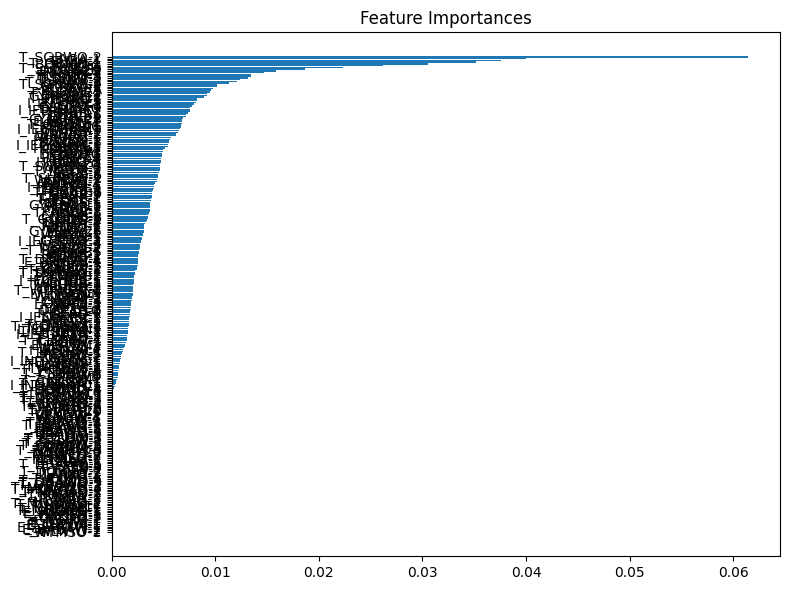

In [39]:
model_individual_generator_unplanned_data_5, features_individual_generator_unplanned_data_5, imp_individual_generator_unplanned_data_5 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

[I 2025-08-11 22:46:36,496] A new study created in memory with name: no-name-c2e060f0-f11a-4ccb-9775-40bcf1fc274e



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:46:37,897] Trial 0 finished with value: -35.38190855235728 and parameters: {'n_estimators': 400, 'max_depth': 7, 'learning_rate': 0.127115837903306, 'subsample': 0.8865589640420746, 'colsample_bytree': 0.6622765267409678, 'reg_alpha': 0.1502693827452142, 'reg_lambda': 1.2764641735769029e-05}. Best is trial 0 with value: -35.38190855235728.
[I 2025-08-11 22:46:42,829] Trial 1 finished with value: -33.19826569329295 and parameters: {'n_estimators': 700, 'max_depth': 12, 'learning_rate': 0.04035110597652574, 'subsample': 0.8664788354716045, 'colsample_bytree': 0.6219327849816817, 'reg_alpha': 0.015430156260666836, 'reg_lambda': 0.000833629220974592}. Best is trial 1 with value: -33.19826569329295.
[I 2025-08-11 22:46:44,182] Trial 2 finished with value: -45.60102780245597 and parameters: {'n_estimators': 400, 'max_depth': 5, 'learning_rate': 0.009513867669644191, 'subsample': 0.9134658472645338, 'colsample_bytree': 0.8623267550404239, 'reg_alpha': 0.24784361595684895, 're


[Tuning complete] Best parameters:
{'n_estimators': 500, 'max_depth': 10, 'learning_rate': 0.7828638118461398, 'subsample': 0.9996145395440048, 'colsample_bytree': 0.5123170558570213, 'reg_alpha': 0.13138347684813714, 'reg_lambda': 5.531471054362762e-05}

[Result] Train RMSE = 31.878, MAE = 19.961, R² = 0.661



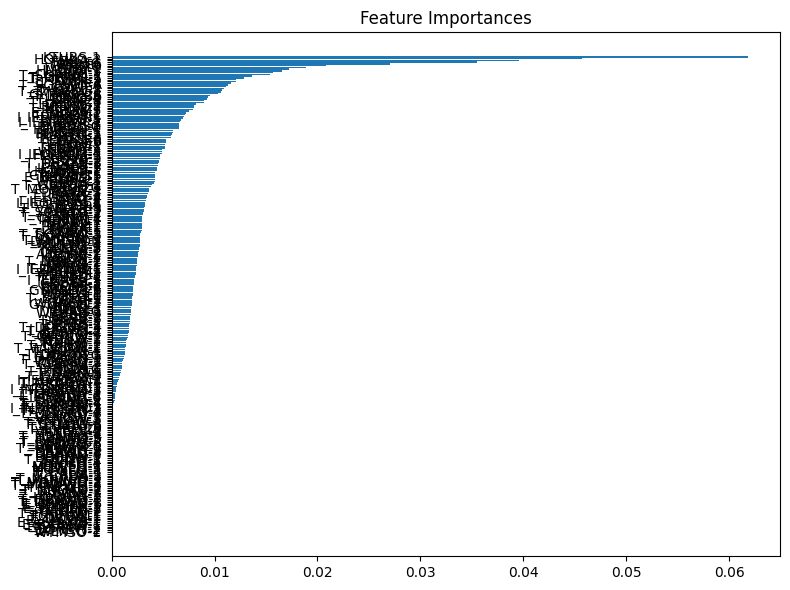

In [40]:
model_individual_generator_unplanned_data_6, features_individual_generator_unplanned_data_6, imp_individual_generator_unplanned_data_6 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

[I 2025-08-11 22:51:16,124] A new study created in memory with name: no-name-a644d984-9c18-4f9e-93ee-f785a86f8c5e



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:51:17,282] Trial 0 finished with value: -46.66949983018399 and parameters: {'n_estimators': 400, 'max_depth': 4, 'learning_rate': 0.013951573143719878, 'subsample': 0.9184463585630782, 'colsample_bytree': 0.6349016492412978, 'reg_alpha': 2.2461018242897255e-05, 'reg_lambda': 4.933262664614343}. Best is trial 0 with value: -46.66949983018399.
[I 2025-08-11 22:51:18,112] Trial 1 finished with value: -38.99607574677286 and parameters: {'n_estimators': 100, 'max_depth': 10, 'learning_rate': 0.036102516498304205, 'subsample': 0.9136504431968173, 'colsample_bytree': 0.9711296532514162, 'reg_alpha': 0.20759770048570414, 'reg_lambda': 0.00025914565524778345}. Best is trial 1 with value: -38.99607574677286.
[I 2025-08-11 22:51:19,355] Trial 2 finished with value: -38.103652560837695 and parameters: {'n_estimators': 400, 'max_depth': 6, 'learning_rate': 0.08670128261717744, 'subsample': 0.9552668251878418, 'colsample_bytree': 0.6586274061577166, 'reg_alpha': 1.1289276904465406, 


[Tuning complete] Best parameters:
{'n_estimators': 700, 'max_depth': 12, 'learning_rate': 0.16055699892903372, 'subsample': 0.9998145219074365, 'colsample_bytree': 0.9630226394510328, 'reg_alpha': 0.005760275273787474, 'reg_lambda': 0.0003451280317349162}

[Result] Train RMSE = 31.883, MAE = 20.027, R² = 0.661



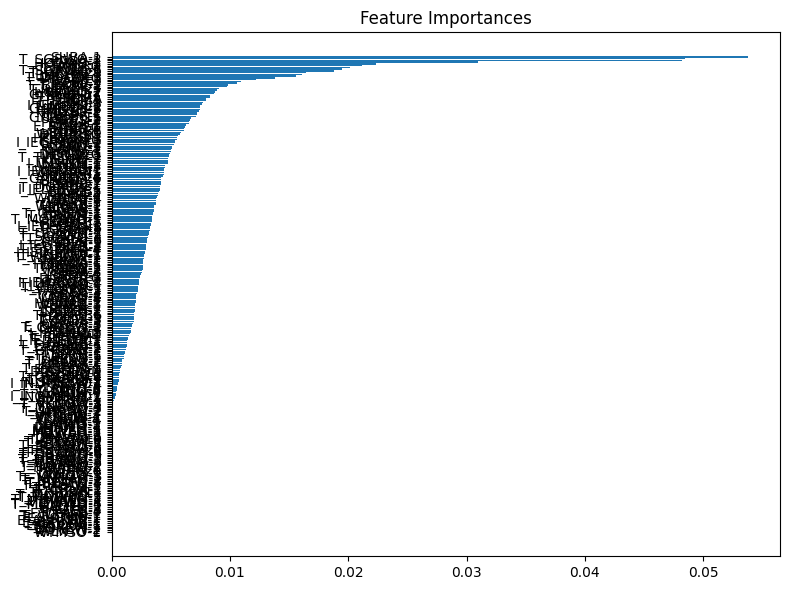

In [41]:
model_individual_generator_unplanned_data_7, features_individual_generator_unplanned_data_7, imp_individual_generator_unplanned_data_7 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

[I 2025-08-11 22:57:15,773] A new study created in memory with name: no-name-e3e03a84-bb9b-4109-878d-846c74afaccd



Starting hyperparameter search (100 trials)...



[I 2025-08-11 22:57:17,620] Trial 0 finished with value: -43.17132672934018 and parameters: {'n_estimators': 600, 'max_depth': 5, 'learning_rate': 0.019288096861699487, 'subsample': 0.7078895125132263, 'colsample_bytree': 0.9958296309136345, 'reg_alpha': 0.11409726629705334, 'reg_lambda': 7.656547925627295}. Best is trial 0 with value: -43.17132672934018.
[I 2025-08-11 22:57:20,924] Trial 1 finished with value: -33.46117478646218 and parameters: {'n_estimators': 800, 'max_depth': 9, 'learning_rate': 0.14245702936692908, 'subsample': 0.5472191560186195, 'colsample_bytree': 0.5138419175356232, 'reg_alpha': 0.0351101703816006, 'reg_lambda': 0.0001505751184384784}. Best is trial 1 with value: -33.46117478646218.
[I 2025-08-11 22:57:24,671] Trial 2 finished with value: -48.252697258015424 and parameters: {'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.0015678886840721524, 'subsample': 0.5702097902038041, 'colsample_bytree': 0.867270154521957, 'reg_alpha': 1.9181763240551315e-05, '


[Tuning complete] Best parameters:
{'n_estimators': 500, 'max_depth': 12, 'learning_rate': 0.7467776315064568, 'subsample': 0.9988605811967308, 'colsample_bytree': 0.5603112953116108, 'reg_alpha': 0.014613974192350623, 'reg_lambda': 0.12932846492636185}

[Result] Train RMSE = 31.867, MAE = 19.908, R² = 0.661



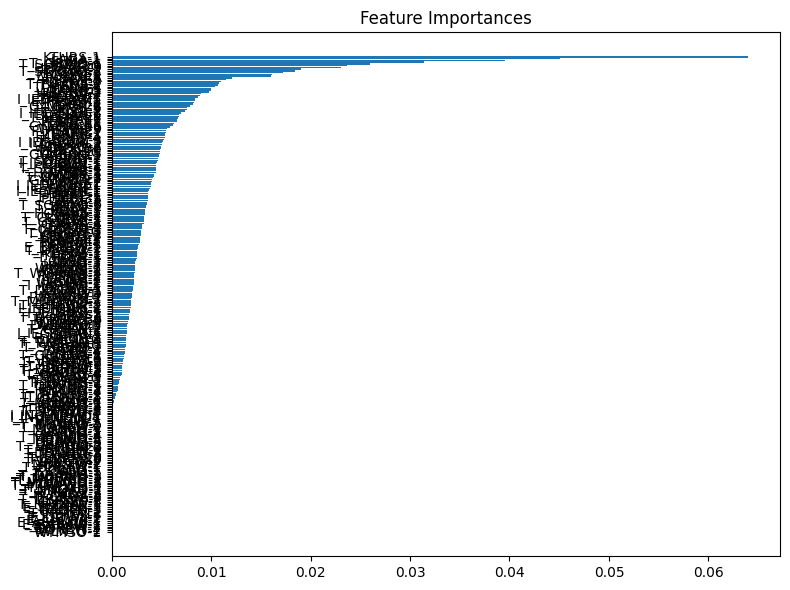

In [42]:
model_individual_generator_unplanned_data_8, features_individual_generator_unplanned_data_8, imp_individual_generator_unplanned_data_8 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

[I 2025-08-11 23:01:56,357] A new study created in memory with name: no-name-866d42bd-180f-4c82-894e-c64b0c07dfa2



Starting hyperparameter search (100 trials)...



[I 2025-08-11 23:01:58,037] Trial 0 finished with value: -42.69166907235643 and parameters: {'n_estimators': 300, 'max_depth': 8, 'learning_rate': 0.008804198352678557, 'subsample': 0.6395328849456858, 'colsample_bytree': 0.7709863229521423, 'reg_alpha': 4.603782073966581e-05, 'reg_lambda': 0.004615741196721694}. Best is trial 0 with value: -42.69166907235643.
[I 2025-08-11 23:01:59,090] Trial 1 finished with value: -47.501453310153416 and parameters: {'n_estimators': 400, 'max_depth': 3, 'learning_rate': 0.017105532721429124, 'subsample': 0.8134621383040839, 'colsample_bytree': 0.9891485340514992, 'reg_alpha': 7.273017907756263, 'reg_lambda': 0.0025438048676256282}. Best is trial 0 with value: -42.69166907235643.
[I 2025-08-11 23:02:01,391] Trial 2 finished with value: -34.913062119128476 and parameters: {'n_estimators': 300, 'max_depth': 12, 'learning_rate': 0.04479032359179001, 'subsample': 0.9262481971372041, 'colsample_bytree': 0.5070813742553563, 'reg_alpha': 0.000282944147248513


[Tuning complete] Best parameters:
{'n_estimators': 300, 'max_depth': 11, 'learning_rate': 0.9787498121689534, 'subsample': 0.9999204458300571, 'colsample_bytree': 0.9564574714674446, 'reg_alpha': 1.528452862821395e-05, 'reg_lambda': 0.0002946838403689672}

[Result] Train RMSE = 31.851, MAE = 19.810, R² = 0.661



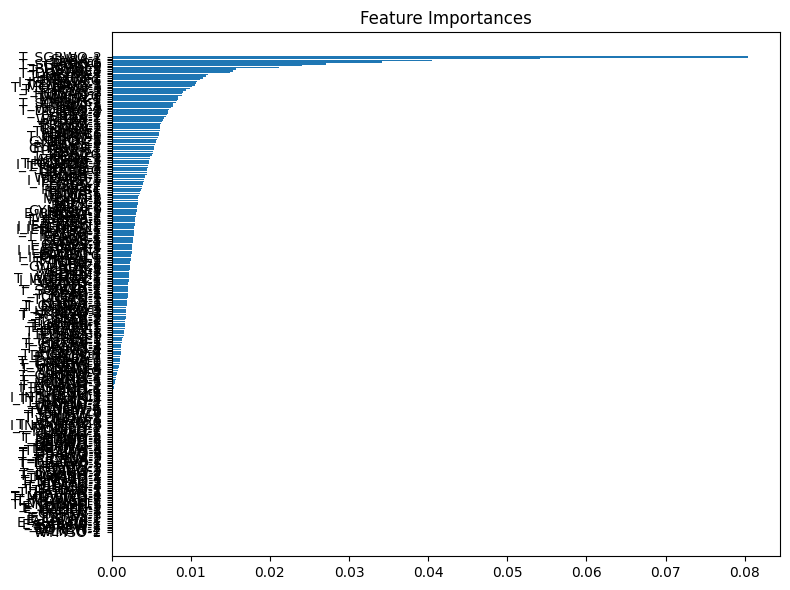

In [43]:
model_individual_generator_unplanned_data_9, features_individual_generator_unplanned_data_9, imp_individual_generator_unplanned_data_9 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

[I 2025-08-11 23:07:29,313] A new study created in memory with name: no-name-b67ddee4-124a-417a-900e-20cc0d301d01



Starting hyperparameter search (100 trials)...



[I 2025-08-11 23:07:30,895] Trial 0 finished with value: -32.830163576340745 and parameters: {'n_estimators': 300, 'max_depth': 10, 'learning_rate': 0.3378954213051971, 'subsample': 0.8558936649007551, 'colsample_bytree': 0.6949712062817573, 'reg_alpha': 0.0020975553517478818, 'reg_lambda': 0.06440158772721936}. Best is trial 0 with value: -32.830163576340745.
[I 2025-08-11 23:07:31,789] Trial 1 finished with value: -34.203536911375636 and parameters: {'n_estimators': 200, 'max_depth': 9, 'learning_rate': 0.30982619750956986, 'subsample': 0.6085160178074654, 'colsample_bytree': 0.6339144110807551, 'reg_alpha': 0.05865674950760361, 'reg_lambda': 4.780743087392755e-05}. Best is trial 0 with value: -32.830163576340745.
[I 2025-08-11 23:07:34,998] Trial 2 finished with value: -32.648164707130995 and parameters: {'n_estimators': 700, 'max_depth': 10, 'learning_rate': 0.34041833649817926, 'subsample': 0.7422903310229384, 'colsample_bytree': 0.5708605667010676, 'reg_alpha': 0.0002417893831644


[Tuning complete] Best parameters:
{'n_estimators': 400, 'max_depth': 12, 'learning_rate': 0.5716999192931668, 'subsample': 0.9993311022318953, 'colsample_bytree': 0.6801933183705365, 'reg_alpha': 0.3760168121416707, 'reg_lambda': 2.5368810865696835e-05}

[Result] Train RMSE = 31.867, MAE = 19.929, R² = 0.661



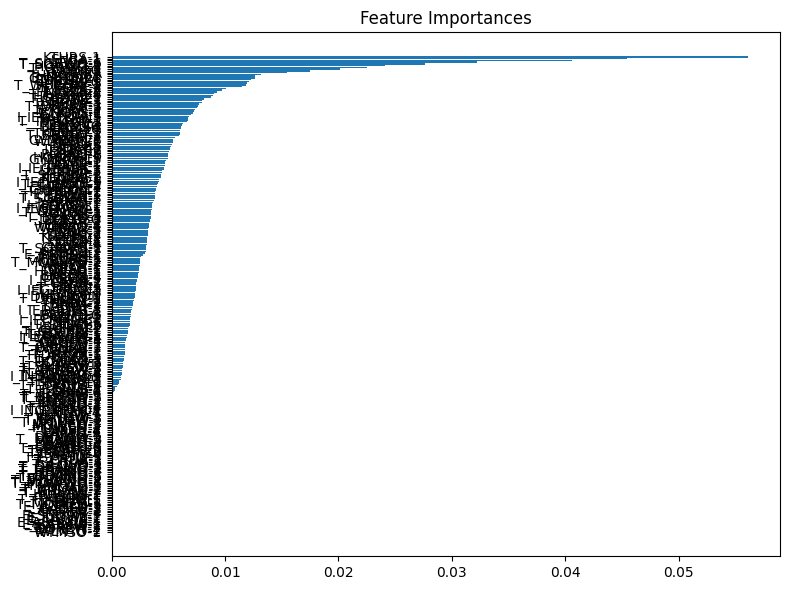

In [44]:
model_individual_generator_unplanned_data_10, features_individual_generator_unplanned_data_10, imp_individual_generator_unplanned_data_10 = run_feature_importance_model(individual_unit_capacity_unplanned_filtered)

In [ ]:
# Save all 10 models 
# List of models
models = [
    model_individual_generator_unplanned_data_1,
    model_individual_generator_unplanned_data_2,
    model_individual_generator_unplanned_data_3,
    model_individual_generator_unplanned_data_4,
    model_individual_generator_unplanned_data_5,
    model_individual_generator_unplanned_data_6,
    model_individual_generator_unplanned_data_7,
    model_individual_generator_unplanned_data_8,
    model_individual_generator_unplanned_data_9,
    model_individual_generator_unplanned_data_10
]

# Save each model
for i, model in enumerate(models, start=1):
    filename = f"model_individual_generator_unplanned_data_{i}.joblib"
    joblib.dump(model, filename)
    print(f"Saved: {filename}")

Saved: model_individual_generator_unplanned_data_1.joblib
Saved: model_individual_generator_unplanned_data_2.joblib
Saved: model_individual_generator_unplanned_data_3.joblib
Saved: model_individual_generator_unplanned_data_4.joblib
Saved: model_individual_generator_unplanned_data_5.joblib
Saved: model_individual_generator_unplanned_data_6.joblib
Saved: model_individual_generator_unplanned_data_7.joblib
Saved: model_individual_generator_unplanned_data_8.joblib
Saved: model_individual_generator_unplanned_data_9.joblib
Saved: model_individual_generator_unplanned_data_10.joblib


In [ ]:
# Load all 10 models into a list
models = []

for i in range(1, 11):
    filename = f"model_individual_generator_unplanned_data_{i}.joblib"
    model = joblib.load(filename)
    models.append(model)
    print(f"Loaded: {filename}")

Loaded: model_individual_generator_unplanned_data_1.joblib
Loaded: model_individual_generator_unplanned_data_2.joblib
Loaded: model_individual_generator_unplanned_data_3.joblib
Loaded: model_individual_generator_unplanned_data_4.joblib
Loaded: model_individual_generator_unplanned_data_5.joblib
Loaded: model_individual_generator_unplanned_data_6.joblib
Loaded: model_individual_generator_unplanned_data_7.joblib
Loaded: model_individual_generator_unplanned_data_8.joblib
Loaded: model_individual_generator_unplanned_data_9.joblib
Loaded: model_individual_generator_unplanned_data_10.joblib


In [ ]:
shap_data = individual_unit_capacity_unplanned_filtered.drop(columns=['StartTime', 'SystemPrice'])

#Compute SHAP values and global importances for each model 
shap_importances = []
for i, model in enumerate(models, start=1):
    shap_values, X_sampled = compute_shap_values(model, shap_data, sample_size=1000)
    shap_imp = get_global_shap_importance(shap_values, X_sampled)
    shap_importances.append(shap_imp.rename(f"Model_{i}"))

# Combine importances into a single DataFrame
shap_compare = pd.concat(shap_importances, axis=1)

# Compute average and standard deviation
shap_compare["Mean"] = shap_compare.mean(axis=1)
shap_compare["StdDev"] = shap_compare.std(axis=1)
shap_compare = shap_compare.sort_values(by="Mean", ascending=False)

# Plot SHAP importances for all 10 models
shap_compare.iloc[:, :10].plot(
    kind='barh',
    figsize=(12, max(6, len(shap_compare) * 0.3)),
    title='SHAP Importances Across 10 Models'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

# Plot average SHAP importance across models
shap_compare["Mean"].plot(
    kind='barh',
    figsize=(10, max(6, len(shap_compare) * 0.3)),
    title='Average SHAP Importance Across 10 Models',
    color='steelblue'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

In [ ]:
# Top 50 SHAP features 
top_50 = shap_compare["Mean"].head(50)

# Merge with fuel type info 
fuel_map = dict(affected_unit_fuel.values)
top_50_fuel = pd.DataFrame({'Feature': top_50.index, 'SHAP': top_50.values})
top_50_fuel['FuelType'] = top_50_fuel['Feature'].map(fuel_map)

# Filter only features with defined fuel color
top_50_fuel = top_50_fuel[top_50_fuel['FuelType'].isin(fuel_colors)]

# Assign colors
colors = top_50_fuel['FuelType'].map(fuel_colors)

# Plot
plt.figure(figsize=(10, 8))
plt.barh(top_50_fuel['Feature'], top_50_fuel['SHAP'], color=colors)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.title("Top 50 Unplanned Generator SHAP Importances (Average Across 10 Models)")
plt.tight_layout()

# Legend
unique_fuels_in_plot = top_50_fuel['FuelType'].unique()
handles = [plt.Line2D([0], [0], color=fuel_colors[f], lw=10) for f in unique_fuels_in_plot]
plt.legend(
    handles,
    unique_fuels_in_plot,
    title="Fuel Type",
    loc='lower right',
    bbox_to_anchor=(1.0, 0.05),
    frameon=True,
    handlelength=1,
    handletextpad=1,
    borderaxespad=1,
    fontsize='medium',
    borderpad=0.75,
    title_fontsize='medium'
)

plt.show()

# Save top 50 SHAP importances to CSV
top_50_fuel.to_csv('Top_50_Fuel_Types_Unplanned.csv', index=False)

In [ ]:
# Top 10 generators 
top_generators = top_50_fuel['Feature'].head(10).tolist()

# Sort data by time
individual_unit_capacity_unplanned_filtered = individual_unit_capacity_unplanned_filtered.sort_values('StartTime')

# Plot setup
rows, cols = 5, 2
fig, axes = plt.subplots(rows, cols, figsize=(20, 8), sharex=True)
fig.suptitle('Top 10 Unplanned Generators vs System Price', fontsize=16)
axes = axes.flatten()

# Loop through each generator
for i, generator in enumerate(top_generators):
    if generator not in individual_unit_capacity_unplanned_filtered.columns:
        print(f"Skipping missing generator: {generator}")
        continue
    
    ax1 = axes[i]

    # Plot unavailable capacity (left y-axis)
    ax1.plot(
        individual_unit_capacity_unplanned_filtered['StartTime'],
        individual_unit_capacity_unplanned_filtered[generator],
        color='tab:blue'
    )
    ax1.set_title(generator, fontsize=10)
    ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=8)
    ax1.tick_params(axis='x', labelsize=8)
    ax1.set_ylabel('Unavailable (MW)', color='tab:blue')

    # Plot system price (right y-axis)
    ax2 = ax1.twinx()
    ax2.plot(
        individual_unit_capacity_unplanned_filtered['StartTime'],
        individual_unit_capacity_unplanned_filtered['SystemPrice'],
        color='tab:orange'
    )
    ax2.set_ylabel('Price (£/MWh)', color='tab:orange')
    ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=8)

# Hide unused subplots if fewer than 10 generators
for j in range(len(top_generators), len(axes)):
    fig.delaxes(axes[j])

# Final layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## Individual Generator Feature Analysis (Planned + Unplanned as Separate Features)

In [ ]:
# Function to append suffix to all columns except specified ones
def rename_with_suffix(df, suffix, exclude_cols):
    return df.rename(
        columns={col: f"{col}{suffix}" for col in df.columns if col not in exclude_cols}
    )

# Columns to exclude from renaming
exclude_cols = ["StartTime", "SystemPrice"]

# Rename columns
individual_unit_capacity_planned_filtered = rename_with_suffix(
    individual_unit_capacity_planned_filtered, "_planned", exclude_cols
)
individual_unit_capacity_unplanned_filtered = rename_with_suffix(
    individual_unit_capacity_unplanned_filtered, "_unplanned", exclude_cols
)

# Merge DataFrames — keeping StartTime & SystemPrice from one (assuming they align)
individual_unit_capacity_planned_unplanned_filtered = pd.merge(
    individual_unit_capacity_planned_filtered,
    individual_unit_capacity_unplanned_filtered,
    on=exclude_cols,
    how="outer"  # or "inner" depending on your needs
)

# Preview result
print(individual_unit_capacity_planned_unplanned_filtered.head())

In [ ]:
model_individual_generator_planned_unplanned_data_1, features_individual_generator_planned_unplanned_data_1, imp_individual_generator_planned_unplanned_data_1 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
model_individual_generator_planned_unplanned_data_2, features_individual_generator_planned_unplanned_data_2, imp_individual_generator_planned_unplanned_data_2 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
model_individual_generator_planned_unplanned_data_3, features_individual_generator_planned_unplanned_data_3, imp_individual_generator_planned_unplanned_data_3 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
model_individual_generator_planned_unplanned_data_4, features_individual_generator_planned_unplanned_data_4, imp_individual_generator_planned_unplanned_data_4 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
model_individual_generator_planned_unplanned_data_5, features_individual_generator_planned_unplanned_data_5, imp_individual_generator_planned_unplanned_data_5 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
model_individual_generator_planned_unplanned_data_6, features_individual_generator_planned_unplanned_data_6, imp_individual_generator_planned_unplanned_data_6 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
model_individual_generator_planned_unplanned_data_7, features_individual_generator_planned_unplanned_data_7, imp_individual_generator_planned_unplanned_data_7 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
model_individual_generator_planned_unplanned_data_8, features_individual_generator_planned_unplanned_data_8, imp_individual_generator_planned_unplanned_data_8 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
model_individual_generator_planned_unplanned_data_9, features_individual_generator_planned_unplanned_data_9, imp_individual_generator_planned_unplanned_data_9 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
model_individual_generator_planned_unplanned_data_10, features_individual_generator_planned_unplanned_data_10, imp_individual_generator_planned_unplanned_data_10 = run_feature_importance_model(individual_unit_capacity_planned_unplanned_filtered)

In [ ]:
# Save all 10 models 
# List of models
models = [
    model_individual_generator_planned_unplanned_data_1,
    model_individual_generator_planned_unplanned_data_2,
    model_individual_generator_planned_unplanned_data_3,
    model_individual_generator_planned_unplanned_data_4,
    model_individual_generator_planned_unplanned_data_5,
    model_individual_generator_planned_unplanned_data_6,
    model_individual_generator_planned_unplanned_data_7,
    model_individual_generator_planned_unplanned_data_8,
    model_individual_generator_planned_unplanned_data_9,
    model_individual_generator_planned_unplanned_data_10
]

# Save each model
for i, model in enumerate(models, start=1):
    filename = f"model_individual_generator_planned_unplanned_data_{i}.joblib"
    joblib.dump(model, filename)
    print(f"Saved: {filename}")

In [ ]:
# Load all 10 models into a list
models = []

for i in range(1, 11):
    filename = f"model_individual_generator_planned_unplanned_data_{i}.joblib"
    model = joblib.load(filename)
    models.append(model)
    print(f"Loaded: {filename}")

In [ ]:
shap_data = individual_unit_capacity_planned_unplanned_filtered.drop(columns=['StartTime', 'SystemPrice'])

# Compute SHAP values and global importances for each model 
shap_importances = []
for i, model in enumerate(models, start=1):
    shap_values, X_sampled = compute_shap_values(model, shap_data, sample_size=1000)
    shap_imp = get_global_shap_importance(shap_values, X_sampled)
    shap_importances.append(shap_imp.rename(f"Model_{i}"))

# Combine importances into a single DataFrame
shap_compare = pd.concat(shap_importances, axis=1)

# Compute average and standard deviation
shap_compare["Mean"] = shap_compare.mean(axis=1)
shap_compare["StdDev"] = shap_compare.std(axis=1)
shap_compare = shap_compare.sort_values(by="Mean", ascending=False)

# Plot SHAP importances for all 10 models
shap_compare.iloc[:, :10].plot(
    kind='barh',
    figsize=(12, max(6, len(shap_compare) * 0.3)),
    title='SHAP Importances Across 10 Models'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

# Plot average SHAP importance across models
shap_compare["Mean"].plot(
    kind='barh',
    figsize=(10, max(6, len(shap_compare) * 0.3)),
    title='Average SHAP Importance Across 10 Models',
    color='steelblue'
)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.tight_layout()
plt.show()

In [ ]:
# Top 50 features
top_50 = shap_compare["Mean"].head(50)

# Merge with fuel type info
fuel_map = dict(affected_unit_fuel.values)
top_50_fuel = pd.DataFrame({'Feature': top_50.index, 'SHAP': top_50.values})
top_50_fuel['FuelType'] = top_50_fuel['Feature'].map(fuel_map)

# Drop rows with unknown fuelType
top_50_fuel = top_50_fuel.dropna(subset=['FuelType'])

# Filter only features with defined fuel color
top_50_fuel = top_50_fuel[top_50_fuel['FuelType'].isin(fuel_colors)]

# Assign colors
colors = top_50_fuel['FuelType'].map(fuel_colors)

# Plot
plt.figure(figsize=(10, 8))
plt.barh(top_50_fuel['Feature'], top_50_fuel['SHAP'], color=colors)
plt.gca().invert_yaxis()
plt.xlabel("Mean(|SHAP Value|)")
plt.title("Top 50 Unplanned Generator SHAP Importances (Average Across 10 Models)")
plt.tight_layout()

# Legend 
unique_fuels_in_plot = top_50_fuel['FuelType'].unique()
handles = [plt.Line2D([0], [0], color=fuel_colors[f], lw=10) for f in unique_fuels_in_plot]
plt.legend(
    handles,
    unique_fuels_in_plot,
    title="Fuel Type",
    loc='lower right',
    bbox_to_anchor=(1.0, 0.05),
    frameon=True,
    handlelength=1,
    handletextpad=1,
    borderaxespad=1,
    fontsize='medium',
    borderpad=0.75,
    title_fontsize='medium'
)

plt.show()

# Save top 50 SHAP importances to CSV
top_50_fuel.to_csv('Top_50_Fuel_Types_Unplanned_Planned.csv', index=False)

In [ ]:
# Top 10 generators
top_generators = top_50_fuel['Feature'].head(10).tolist()

# Sort data by time just in case
individual_unit_capacity_planned_unplanned_filtered = individual_unit_capacity_planned_unplanned_filtered.sort_values('StartTime')

# Plot setup
rows, cols = 5, 2
fig, axes = plt.subplots(rows, cols, figsize=(20, 8), sharex=True)
fig.suptitle('Top 10 Unplanned Generators vs System Price', fontsize=16)
axes = axes.flatten()

# Loop through each generator
for i, generator in enumerate(top_generators):
    if generator not in individual_unit_capacity_planned_unplanned_filtered.columns:
        print(f"Skipping missing generator: {generator}")
        continue
    
    ax1 = axes[i]

    # Plot unavailable capacity (left y-axis)
    ax1.plot(
        individual_unit_capacity_planned_unplanned_filtered['StartTime'],
        individual_unit_capacity_planned_unplanned_filtered[generator],
        color='tab:blue'
    )
    ax1.set_title(generator, fontsize=10)
    ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=8)
    ax1.tick_params(axis='x', labelsize=8)
    ax1.set_ylabel('Unavailable (MW)', color='tab:blue')

    # Plot system price (right y-axis)
    ax2 = ax1.twinx()
    ax2.plot(
        individual_unit_capacity_planned_unplanned_filtered['StartTime'],
        individual_unit_capacity_planned_unplanned_filtered['SystemPrice'],
        color='tab:orange'
    )
    ax2.set_ylabel('Price (£/MWh)', color='tab:orange')
    ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=8)

# Hide unused subplots if fewer than 10 generators
for j in range(len(top_generators), len(axes)):
    fig.delaxes(axes[j])

# Final layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()